In [33]:
"""Load Data
Structure:
    1. Imports, Variables, Functions
    2. Load Data
"""

# 1. Imports, Variables, Functions
# imports
import xml.etree.ElementTree as ET, os
import pandas as pd, numpy as np, os, sys
import anndata as ad
import logging
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import json
import random
from typing import *
from sklearn.metrics import (
    roc_auc_score,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score,
)
from sklearn.metrics import confusion_matrix, classification_report
from itertools import permutations, product
from tqdm import tqdm
import scanpy as sc


logging.basicConfig(level=logging.INFO)

# variables

run_dir = os.path.join("..", "outputs", "run-24-11-14-26")
output_dir = os.path.join(run_dir, "outputs")
split_n = 0
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

mesh_file_path = os.path.join(
    "/aloy/home/ddalton/projects/disease_signatures/data/MeSH/desc2023.xml"
)

mesh_da_mappings_path = "/aloy/home/ddalton/projects/disease_signatures/data/DiSignAtlas/mesh_tree_terms.pkl"

df_info_path = os.path.join(
    "/aloy",
    "home",
    "ddalton",
    "projects",
    "disease_signatures",
    "data",
    "DiSignAtlas",
    "Disease_information_Datasets_extended.csv",
)

# functions


def load_run_output(input_dir: str) -> tuple:
    """Load the output of a run
    Args:
        input_dir (str): path to the run output directory
    Returns:
        loaded_variables (tuple): tuple of loaded variables
    """

    variables_to_load = [
        # "split",
        "predictions_test",
        "labels_test",
        "results_test",
        "all_outputs_test",
        "predictions_valid",
        "labels_valid",
        "results_valid",
        "all_outputs_valid",
        "predictions_train",
        "labels_train",
        "results_train",
        "all_outputs_train",
        "adata_orig",
        "id2type",
        "train_indices",
        "valid_indices",
        # "adata_train_1",
        # "adata_valid_1",
        # "adata_test_1",
    ]

    # initialize loaded variables as an empty tuple
    loaded_variables = ()

    # loop through variables
    for variable in variables_to_load:
        if variable.startswith("adata"):

            # do not load everything
            loaded_variable = ad.read_h5ad(
                os.path.join(input_dir, f"{variable}.h5ad")
                # , backed="r"
            )

        else:
            with open(os.path.join(input_dir, f"{variable}.pkl"), "rb") as f:
                loaded_variable = pickle.load(f)

        # add the loaded variable to the tuple
        loaded_variables += (loaded_variable,)

    print(f"Nº of loaded variables {len(loaded_variables)}")

    return loaded_variables


def load_comparison_matrix_all(
    output_dir: str, comparison_type: str, scgpt: bool = True
) -> np.matrix:
    """Load the comparison matrix
    Args:
        - output_dir (str): path to the output directory
        - comparison_type (str): type of comparison matrix to load
    Returns:
        - matrix (np.matrix): comparison matrix
    """

    if comparison_type == "Cosine Similarity":
        file_name = "c_matrix"
    if comparison_type == "Euclidean Distance":
        file_name = "e_matrix"
    if comparison_type == "Pearson Correlation":
        file_name = "p_matrix"

    if scgpt:
        file_name = f"{file_name}_all_parallel.split_1.npy"
    else:
        file_name = f"raw_gex{file_name}_all_parallel.split_1.npy"

    matrix = np.load(os.path.join(output_dir, file_name))

    return matrix


def get_dsaid_relationships(
    disease_id: List,
    disease_tree: List,
    rest_ids: List,
    rest_trees: List,
    tree_root: str,
    relationship: str,
) -> np.array:
    """Get idxs for dsaids based on relationship
    Args:
        - disease_id (List): Disease ID
        - disease_tree (List): Disease Tree
        - rest_ids (List): Rest of the IDs
        - rest_trees (List): Rest of the Trees
        - tree_root (str): Root Tree
        - relationship (str): Relationship
    Returns:
        - idxs (np.array): Array of indexes
    """
    disease_tree = shorten_terms(disease_tree)
    rest_trees = shorten_terms(rest_trees)

    idxs = list()

    for idx in range(len(rest_ids)):
        rest_id_i = rest_ids[idx]
        rest_tree_i = rest_trees[idx]

        # disease id
        condition_1 = disease_id == rest_id_i

        # Related MeSH trees w/ disease
        condition_2 = len(set(disease_tree).intersection(set(rest_tree_i))) > 0

        # Same root tree
        condition_3 = len(set([tree_root]).intersection(set(rest_tree_i))) > 0

        if relationship == "same_disease":

            # Must have same Disease ID!
            if condition_1:
                idxs.append(idx)

        elif relationship == "related_disease":

            # Different Disease ID but same family as Root Tree
            if condition_1 and condition_3:
                idxs.append(idx)

        elif relationship == "unrelated_disease":

            # Different Disease ID and different family to Disease at all levels!
            if condition_1 and not condition_2:
                idxs.append(idx)

    return np.array(idxs)


def parse_mesh_data(file_path):
    """Parse MeSH XML data and extract disease terms."""
    tree = ET.parse(file_path)
    root = tree.getroot()

    # Dictionary to map tree numbers to disease terms
    tree_2_term = {}
    term_2_tree = {}

    # Extract disease terms and tree numbers
    for descriptor in root.findall("DescriptorRecord"):
        # Get the disease term name
        term = descriptor.find("DescriptorName/String").text

        # Get all tree numbers for this term
        tree_numbers = descriptor.findall("TreeNumberList/TreeNumber")

        for tree_number in tree_numbers:
            # Check for disease-related tree numbers starting with 'C'
            # if tree_number.text.startswith("C"):
            # Map each tree number to its term
            tree_2_term[tree_number.text] = term
            term_2_tree[term] = tree_number.text

    return tree_2_term, term_2_tree


def parse_mesh_data_with_ids(file_path):
    """Parse MeSH XML data and extract disease terms along with MeSH IDs."""
    tree = ET.parse(file_path)
    root = tree.getroot()

    # Dictionaries to map tree numbers and MeSH IDs to disease terms
    tree_2_term = {}
    term_2_tree = {}
    mesh_id_2_term = {}

    # Extract disease terms, tree numbers, and MeSH IDs
    for descriptor in root.findall("DescriptorRecord"):
        # Get the disease term name
        term = descriptor.find("DescriptorName/String").text

        # Get the MeSH ID
        mesh_id = descriptor.find("DescriptorUI").text
        mesh_id_2_term[mesh_id] = term

        # Get all tree numbers for this term
        tree_numbers = descriptor.findall("TreeNumberList/TreeNumber")

        for tree_number in tree_numbers:
            # Map each tree number to its term
            tree_2_term[tree_number.text] = term
            term_2_tree[term] = tree_number.text

    return tree_2_term, term_2_tree, mesh_id_2_term


def shorten_terms(mesh_terms: List) -> List:
    """Shorten Terms
    Args:
        - mesh_terms(List): List of MeSH terms
    Returns:
        - List: List of shortened MeSH terms
    """
    return [x.split(".")[0] for x in mesh_terms]


def get_relationship(
    mesh_id: str, df_obs: pd.DataFrame, mesh_id_2_tree_terms: dict
) -> List:
    """Get Relationship between two diseases
    Args:
        - mesh_id (str): MeSH ID
        - df_obs (pd.DataFrame): DataFrame with disease information
        - mesh_id_2_tree_terms (dict): Mapping of MeSH ID to Tree Terms
    Returns:
        - relationship (List): List of relationships
    """

    # get root tree terms
    tree_term = shorten_terms(mesh_id_2_tree_terms[mesh_id])

    # clean terms
    tree_term = [x for x in tree_term if x.startswith("C")]

    relationship = list()

    for i, row in df_obs.iterrows():
        disease_i = row["disease"]
        mesh_id_i = row["mesh_id"]
        tree_term_i = shorten_terms(mesh_id_2_tree_terms[mesh_id_i])

        # clean terms
        tree_term_i = [x for x in tree_term_i if x.startswith("C")]

        # check if same disease
        condition_1 = mesh_id == mesh_id_i

        # check if control
        condition_2 = disease_i == "Control"

        # check if related
        condition_3 = len(set(tree_term).intersection(set(tree_term_i))) > 0

        # Same Disease
        if condition_1 and not condition_2:
            relationship.append("same disease")

        # Control for same Disease
        elif condition_1 and condition_2:
            relationship.append("control")

        # Related Disease
        elif condition_3 and not condition_2:
            relationship.append("related disease")

        else:
            relationship.append("other")

    return relationship


def merge_embeddings(output: List[Dict]) -> np.array:
    """Merge Embeddings
    Args:
        output (List[Dict]): List of dictionaries with embeddings
    Returns:
        np.array: Merged embeddings
    """
    for i in range(len(output)):
        embeddings_i = output[i]["cell_emb"].numpy()

        if i == 0:
            embeddings = embeddings_i
        else:
            embeddings = np.concatenate((embeddings, embeddings_i), axis=0)
    return embeddings


# 2. Load Data
(
    # split,
    predictions_test,
    labels_test,
    results_test,
    all_outputs_test,
    predictions_valid,
    labels_valid,
    results_valid,
    all_outputs_valid,
    predictions_train,
    labels_train,
    results_train,
    all_outputs_train,
    adata_orig,
    id2type,
    train_indices,
    valid_indices,
    # adata_train,
    # adata_valid,
    # adata_test,
) = load_run_output(run_dir)

# load json

with open(os.path.join(run_dir, "parameters.json"), "r") as f:
    parameters = json.load(f)

for k, v in parameters.items():
    print(f"{k}: {v}")


# define train & test splits
split_n = 0
adata_test = adata_orig.obs[adata_orig.obs[f"test_split_{split_n+1}"] == 1]
adata_train = adata_orig[adata_orig.obs[f"test_split_{split_n+1}"] == 0]


# load DiSignAtlas info
df_info = pd.read_csv(df_info_path)

# load MeSH data
tree_2_term, term_2_tree = parse_mesh_data(file_path=mesh_file_path)

# map DisignAtlas to MeSH tree
mesh_da_mappings = pickle.load(open(mesh_da_mappings_path, "rb"))

dsaid_2_mesh_id = dict(zip(mesh_da_mappings["dsaids"], mesh_da_mappings["mesh_ids"]))
dsaid_2_tree_terms = dict(
    zip(mesh_da_mappings["dsaids"], mesh_da_mappings["mesh_tree_terms"])
)

mesh_id_2_tree_terms = {
    k[0]: v
    for k, v in zip(mesh_da_mappings["mesh_ids"], mesh_da_mappings["mesh_tree_terms"])
    if len(k) > 0
}

# clean up tree terms
# for k, v in dsaid_2_tree_terms.items():
#     dsaid_2_tree_terms[k] = [x for x in v if x.startswith("C")]

# for k, v in mesh_id_2_tree_terms.items():
#     mesh_id_2_tree_terms[k] = [x for x in v if x.startswith("C")]

# get adata test, valid & train
adata_test = adata_orig[adata_orig.obs[f"test_split_1"] == 1]
adata_rest = adata_orig[adata_orig.obs[f"test_split_1"] == 0]

adata_valid = adata_rest[valid_indices[0], :]
adata_train = adata_rest[train_indices[0], :]

# get concatenated adata.obs
df_obs = pd.concat([adata_test.obs, adata_valid.obs, adata_train.obs])

# reset index !
df_obs.reset_index(drop=True, inplace=True)

df_obs["gsm"] = df_obs["ids"].apply(lambda x: x.split(";")[1])

mask = ~df_obs["gsm"].duplicated(keep="first")  # Keep the first occurrence
df_obs = df_obs[mask]
df_obs.reset_index(drop=True, inplace=True)

adata = sc.concat([adata_test, adata_valid, adata_train], axis=0)
adata = adata[mask, :]

Nº of loaded variables 16
data_path: /aloy/home/ddalton/projects/scGPT_playground/data/pp_data-24-11-07-01/data.h5ad
max_seq_len: 3501
batch_size: 16
gene_presence_pct: 0.9
benchmark_data: False
split_type: mixed
val_split_type: random
n_splits: 3
n_tested_splits: 3
epochs: 20
gene_filtering: top_presence
sample_presence_pct: 0.3
ADV: False
INPUT_BATCH_LABELS: False


In [34]:
def get_relationship(
    mesh_id: str, df_obs: pd.DataFrame, mesh_id_2_tree_terms: dict
) -> List:
    """Get Relationship between two diseases
    Args:
        - mesh_id (str): MeSH ID
        - df_obs (pd.DataFrame): DataFrame with disease information
        - mesh_id_2_tree_terms (dict): Mapping of MeSH ID to Tree Terms
    Returns:
        - relationship (List): List of relationships
    """

    # get root tree terms
    tree_term = shorten_terms(mesh_id_2_tree_terms[mesh_id])

    # clean terms
    tree_term = [x for x in tree_term if x.startswith("C")]

    relationship = list()

    for i, row in df_obs.iterrows():
        disease_i = row["disease"]
        mesh_id_i = row["mesh_id"]
        tree_term_i = shorten_terms(mesh_id_2_tree_terms[mesh_id_i])

        # clean terms
        tree_term_i = [x for x in tree_term_i if x.startswith("C")]

        # check if same disease
        condition_1 = mesh_id == mesh_id_i

        # check if control
        condition_2 = disease_i == "Control"

        # check if related
        condition_3 = len(set(tree_term).intersection(set(tree_term_i))) > 0

        # Same Disease
        if condition_1 and not condition_2:
            relationship.append("same disease")

        # Control for same Disease
        elif condition_1 and condition_2:
            relationship.append("control")

        # Related Disease
        elif condition_3 and not condition_2:
            relationship.append("related disease")

        else:
            relationship.append("other")

    return relationship

## Plot the embedding space - integration library bias - tSNE and cosine similarity

In [35]:
# merge embeddings
for split_i in range(len(all_outputs_test)):
    # Only compute for the first fold as per original code structure
    scgpt_emb_test = merge_embeddings(all_outputs_test[split_i])
    logging.info(f"SCGPT Embeddings Test Shape: {scgpt_emb_test.shape}")

    scgpt_emb_valid = merge_embeddings(all_outputs_valid[split_i])
    logging.info(f"SCGPT Embeddings Train Shape: {scgpt_emb_valid.shape}")

    scgpt_emb_train = merge_embeddings(all_outputs_train[split_i])
    logging.info(f"SCGPT Embeddings Train Shape: {scgpt_emb_train.shape}")

    scgpt_emb_all = np.concatenate(
        [scgpt_emb_test, scgpt_emb_valid, scgpt_emb_train], axis=0
    )
    logging.info(f"SCGPT Embeddings All Shape: {scgpt_emb_all.shape}")

    break


# apply mask
scgpt_emb_all = scgpt_emb_all[mask, :]
logging.info(f"SCGPT Embeddings After Mask - Shape: {scgpt_emb_all.shape}")

INFO:root:SCGPT Embeddings Test Shape: (28089, 512)
INFO:root:SCGPT Embeddings Train Shape: (5618, 512)
INFO:root:SCGPT Embeddings Train Shape: (50558, 512)
INFO:root:SCGPT Embeddings All Shape: (84265, 512)
INFO:root:SCGPT Embeddings After Mask - Shape: (70665, 512)


Accuracy: 0.635878164556962
F1-score: 0.5779234342405368


<Figure size 1200x1000 with 0 Axes>

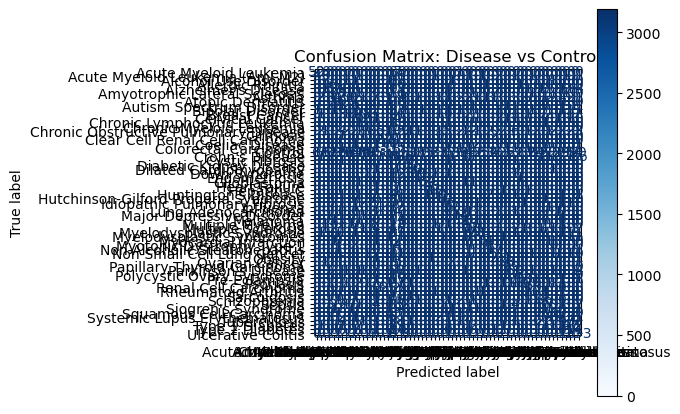

In [85]:
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Prepare embeddings and labels
X =   scgpt_emb_train # e.g., scgpt_emb_all or adata_2.X from UMAP section
y = adata_train.obs["disease"].to_numpy()  # Must be "Disease"/"Control" or binary

# Optional: convert string labels to numeric
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y)  # e.g., "Control"=0, "Disease"=1

# Step 2: Split into train and test
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Step 3: Train classifier
clf = MLPClassifier(
    hidden_layer_sizes=(128, 64),
    activation="relu",
    solver="adam",
    max_iter=300,
    random_state=42
)
clf.fit(X_train, y_train)

# Step 4: Predict and evaluate
y_pred = clf.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1-score:", f1_score(y_test, y_pred, average="macro"))

# Step 5: Plot confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=le.classes_)

plt.figure(figsize=(6, 5), dpi=200)
disp.plot(cmap=plt.cm.Blues, values_format="d")
plt.title("Confusion Matrix: Disease vs Control")
plt.tight_layout()
plt.show()


<Figure size 1200x1000 with 0 Axes>

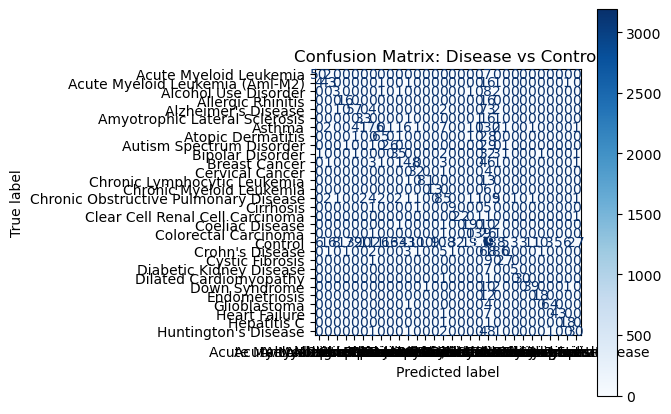

In [91]:
# Step 5: Plot confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(conf_matrix[:30][:,:30], display_labels=le.classes_[:30])

plt.figure(figsize=(6, 5), dpi=200)
disp.plot(cmap=plt.cm.Blues, values_format="d")
plt.title("Confusion Matrix: Disease vs Control")
plt.tight_layout()
plt.show()

<Figure size 2400x2400 with 0 Axes>

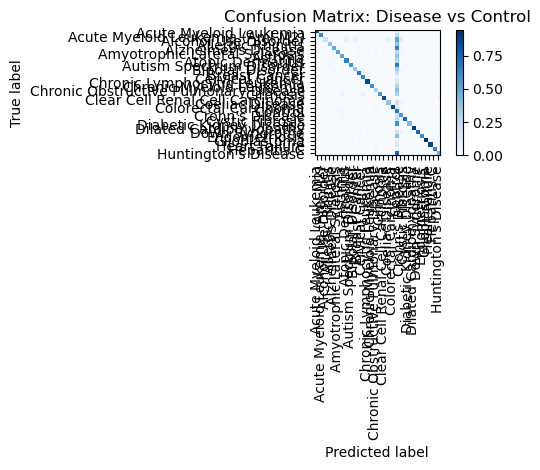

In [98]:
# Step 6: Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)


cm_normalized = cm.astype('float') / cm.sum(axis=0)[:, np.newaxis]

# Step 7: Plot (color only)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized[:30][:,:30], display_labels=le.classes_[:30])

plt.figure(figsize=(8, 8), dpi=300)
disp.plot(cmap=plt.cm.Blues, include_values=False)
plt.title("Confusion Matrix: Disease vs Control")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
adata_2.obs.shape

(50558, 18)

In [64]:
adata_2.obs

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,disease_study,library,mesh_id,mesh_disease,celltype_id,test_split_1,test_split_2,test_split_3
4,DSA00006;GSM3596910;Control,GSE126342,GSE126342,780,780,DSA00006,Skeletal muscle,19399,Control,Myotonic Dystrophy,Myotonic Dystrophy Type 1,RNA-Seq,D009223,Myotonic Dystrophy,42,True,False,False
9,DSA00006;GSM3596893;Case,GSE126342,GSE126342,780,780,DSA00006,Skeletal muscle,19399,Myotonic Dystrophy Type 1,Myotonic Dystrophy,Myotonic Dystrophy Type 1,RNA-Seq,D009223,Myotonic Dystrophy,42,True,False,False
11,DSA00006;GSM3596895;Case,GSE126342,GSE126342,780,780,DSA00006,Skeletal muscle,19399,Myotonic Dystrophy Type 1,Myotonic Dystrophy,Myotonic Dystrophy Type 1,RNA-Seq,D009223,Myotonic Dystrophy,42,True,False,False
12,DSA00006;GSM3596896;Case,GSE126342,GSE126342,780,780,DSA00006,Skeletal muscle,19399,Myotonic Dystrophy Type 1,Myotonic Dystrophy,Myotonic Dystrophy Type 1,RNA-Seq,D009223,Myotonic Dystrophy,42,True,False,False
13,DSA00006;GSM3596897;Case,GSE126342,GSE126342,780,780,DSA00006,Skeletal muscle,19399,Myotonic Dystrophy Type 1,Myotonic Dystrophy,Myotonic Dystrophy Type 1,RNA-Seq,D009223,Myotonic Dystrophy,42,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38752,DSA07026;GSM1206524;Control,GSE49755,GSE49755,808,808,DSA07026,Plasma,10975,Control,Sepsis,Sepsis,Microarray,D018805,Sepsis,55,False,False,True
48755,DSA07456;GSM2307249;Case,GSE86618,GSE86618,560,560,DSA07456,Lung,19399,Idiopathic Pulmonary Fibrosis,Idiopathic Pulmonary Fibrosis,Idiopathic Pulmonary Fibrosis,RNA-Seq,D054990,Idiopathic Pulmonary Fibrosis,31,False,False,True
35050,DSA04449;GSM5742958;Control,GSE191279,GSE191279,423,423,DSA04449,nan,19399,Control,"Pulmonary Disease, Chronic Obstructive",Chronic Obstructive Pulmonary Disease,RNA-Seq,D029424,"Pulmonary Disease, Chronic Obstructive",51,False,True,False
85231,DSA04179;GSM5469013;Control,GSE180722,GSE180722,168,168,DSA04179,Caudate nucleus,18538,Control,Alcoholism,Alcohol Use Disorder,Microarray,D000437,Alcoholism,1,False,True,False


/aloy/home/ddalton/miniconda3/envs/generic/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:243: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))
/aloy/home/ddalton/miniconda3/envs/generic/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:387: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)
/aloy/home/ddalton/miniconda3/envs/generic/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


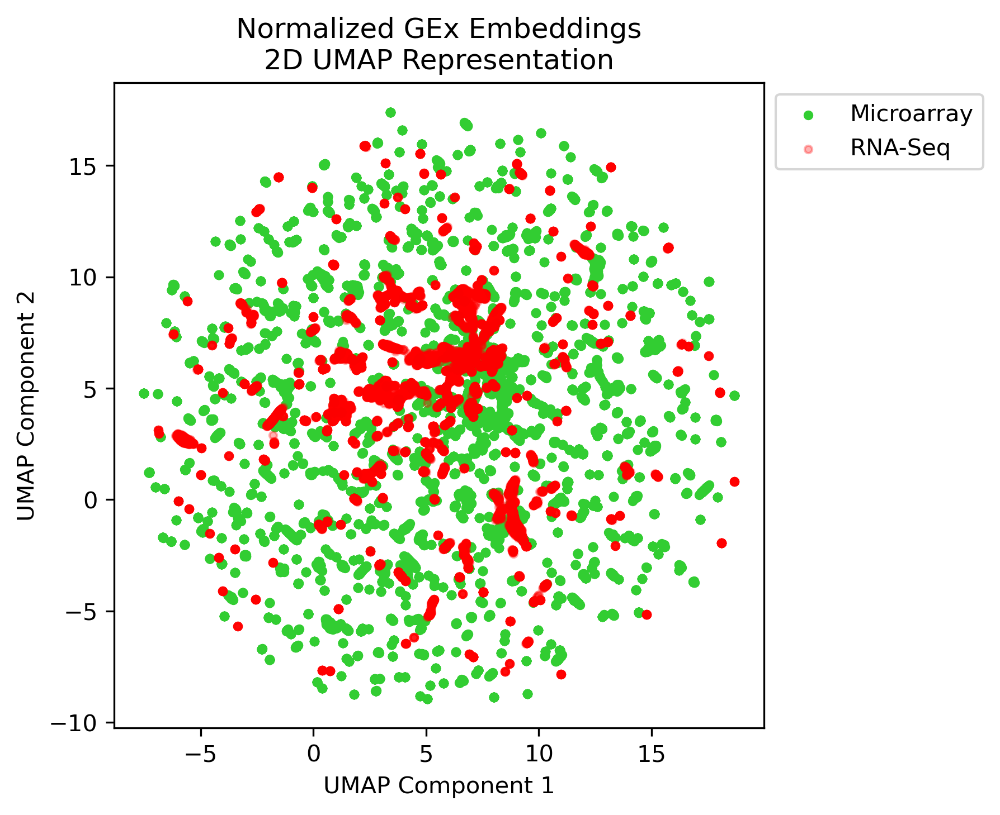

In [62]:
import scanpy as sc
import umap

umap_model = umap.UMAP(n_components=3)


for embedding_type in [
    # "scGPT Embeddings",
    # "Raw GEx Embeddings",
    "Normalized GEx Embeddings",
]:

    if embedding_type == "Normalized GEx Embeddings":
        adata_2 = adata.copy()
        adata_2.X = np.nan_to_num(adata_2.X, nan=0)

        sc.pp.normalize_total(
            adata_2, target_sum=1e6
        )  # Normalize counts to a target sum (e.g., 10,000 per cell)
        sc.pp.log1p(adata_2)  # Log-transform the normalized counts
        adata_2.X = np.nan_to_num(adata_2.X, nan=0)
        embeddings = adata_2.X

    elif embedding_type == "Raw GEx Embeddings":
        adata_2 = adata.copy()
        adata_2.X = np.nan_to_num(adata_2.X, nan=0)
        embeddings = adata_2.X

    elif embedding_type == "scGPT Embeddings":
        embeddings = scgpt_emb_all

    # Fit UMAP model
    embeddings = umap_model.fit_transform(embeddings)

    labels = adata.obs["library"].to_list()

    # Map labels to colors
    label_color_map = {"RNA-Seq": "red", "Microarray": "limegreen"}

    # Create a 2D scatter plot
    fig, ax = plt.subplots()

    # set figure size
    fig.set_size_inches(5, 5)
    fig.set_dpi(300)

    # Then plot Microarray points
    microarray_mask = [label == "Microarray" for label in labels]
    ax.scatter(
        embeddings[microarray_mask, 0],
        embeddings[microarray_mask, 1],
        c="limegreen",
        alpha=1,
        label="Microarray",
        s=10,
    )

    # First plot RNA-Seq points
    rna_seq_mask = [label == "RNA-Seq" for label in labels]
    ax.scatter(
        embeddings[rna_seq_mask, 0],
        embeddings[rna_seq_mask, 1],
        c="red",
        alpha=0.3,
        label="RNA-Seq",
        s=10,
    )

    # Adding legend
    ax.legend()

    ax.legend(loc="upper left", bbox_to_anchor=(1, 1))

    # Set labels
    ax.set_xlabel("UMAP Component 1")
    ax.set_ylabel("UMAP Component 2")
    ax.set_title(f"{embedding_type}\n2D UMAP Representation")

    plt.show()

    # Display the plot
    # plt.savefig(
    #     os.path.join(output_dir, f"{embedding_type}.{data_type}.umap_2d.library.png"),
    #     dpi=300,
    #     bbox_inches="tight",
    # )

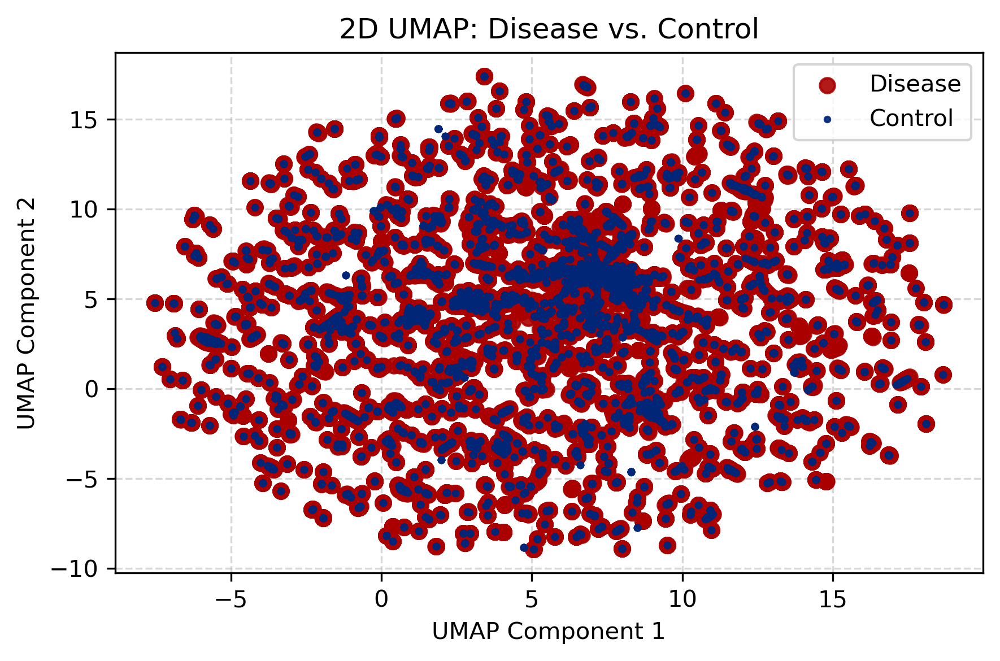

In [75]:
# Create a 2D scatter plot
fig, ax = plt.subplots()
fig.set_size_inches(6, 4)
fig.set_dpi(300)


# Plot Disease points on top (highlight)
disease_mask = [label != "Control" for label in labels]
ax.scatter(
    embeddings[disease_mask, 0],
    embeddings[disease_mask, 1],
    c="#aa0000ff",
    alpha=0.9,
    label="Disease",
    s=40,
    zorder=3
)

# Plot Control points first (background)
labels = adata_2.obs["disease"]
control_mask = [label == "Control" for label in labels]
ax.scatter(
    embeddings[control_mask, 0],
    embeddings[control_mask, 1],
    c="#022778",
    alpha=0.9,
    label="Control",
    s=5,
    zorder=3
)


# Customize plot
ax.set_xlabel("UMAP Component 1")
ax.set_ylabel("UMAP Component 2")
ax.set_title(f"2D UMAP: Disease vs. Control")
# ax.legend(loc="upper left", bbox_to_anchor=(1, 1))
ax.legend()
ax.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()


In [37]:
# plot distances

## Plot distances same/related/random diseases

In [38]:
print(f"Nº of Unique Diseases: {df_obs['mesh_disease'].nunique()}")
print(f"Nº of Samples: {df_obs.shape[0]}")
print(f"Nº of Unique Datasets: {df_obs['dataset'].nunique()}")

Nº of Unique Diseases: 60
Nº of Samples: 70665
Nº of Unique Datasets: 1473


In [39]:
for term_start in [
    "C01",
    "C02",
    "C03",
    "C04",
    "C05",
    "C06",
    "C07",
    "C08",
    "C09",
    "C10",
    "C11",
    "C12",
    "C13",
    "C14",
    "C15",
    "C16",
    "C17",
    "C18",
    "C19",
    "C20",
    "C21",
    "C22",
    "C23",
    "C24",
    "C25",
]:
    i = 0
    for id in df_obs["mesh_id"].unique():
        terms = [x for x in mesh_id_2_tree_terms[id] if x.startswith(term_start)]

        if len(terms) > 0:
            i += 1

    print(f"Term Start: {term_start} - Nº of Diseases: {i}")

Term Start: C01 - Nº of Diseases: 4
Term Start: C02 - Nº of Diseases: 0
Term Start: C03 - Nº of Diseases: 0
Term Start: C04 - Nº of Diseases: 16
Term Start: C05 - Nº of Diseases: 3
Term Start: C06 - Nº of Diseases: 7
Term Start: C07 - Nº of Diseases: 1
Term Start: C08 - Nº of Diseases: 7
Term Start: C09 - Nº of Diseases: 1
Term Start: C10 - Nº of Diseases: 7
Term Start: C11 - Nº of Diseases: 1
Term Start: C12 - Nº of Diseases: 7
Term Start: C13 - Nº of Diseases: 0
Term Start: C14 - Nº of Diseases: 4
Term Start: C15 - Nº of Diseases: 5
Term Start: C16 - Nº of Diseases: 7
Term Start: C17 - Nº of Diseases: 6
Term Start: C18 - Nº of Diseases: 6
Term Start: C19 - Nº of Diseases: 6
Term Start: C20 - Nº of Diseases: 11
Term Start: C21 - Nº of Diseases: 0
Term Start: C22 - Nº of Diseases: 0
Term Start: C23 - Nº of Diseases: 7
Term Start: C24 - Nº of Diseases: 0
Term Start: C25 - Nº of Diseases: 1


In [40]:
n_max_sample = 1000

same_dis_dt = list()
control = list()
unrelated_dt = list()
same_dis = list()
related_dis = list()
# unrelated = list()
other = list()

# Loop through datasets w/ unrelated diseases

for mesh_i in tqdm(df_obs["mesh_id"].unique()):
    QUERY = f"mesh_id == '{mesh_i}'"
    df_query = df_obs.query(QUERY)

    same_dis_dt_i = list()
    control_i = list()
    unrelated_dt_i = list()
    same_dis_i = list()
    related_dis_i = list()
    # unrelated_i = list()
    other_i = list()

    # define relationships knowing the disease
    df_obs["relationship"] = get_relationship(mesh_i, df_obs, mesh_id_2_tree_terms)

    # Loop through diseases in dataset
    for dataset_j in df_query["dataset"].unique():

        # get same disease indexes
        QUERY = "dataset == @dataset_j and relationship == 'same disease'"
        same_dis_dt_idxs = df_obs.query(QUERY).index.to_list()

        # get control indexes
        QUERY = "dataset == @dataset_j and relationship == 'control'"
        control_idxs = df_obs.query(QUERY).index.to_list()

        # get same disease indexes
        QUERY = "dataset != @dataset_j and relationship == 'same disease'"
        same_dis_idxs = df_obs.query(QUERY).index.to_list()

        # get related disease indexes
        QUERY = "relationship == 'related disease' and dataset != @dataset_j"
        related_dis_idxs = df_obs.query(QUERY).index.to_list()

        # # get unrelated disease different indexes
        # QUERY = "relationship == 'unrelated disease' and dataset != @dataset_j"
        # unrelated_idxs = df_obs.query(QUERY).index.to_list()

        # get other indexes
        QUERY = "dataset != @dataset_j and relationship == 'other'"
        other_idxs = df_obs.query(QUERY).index.to_list()

        # sample other indexes
        same_dis_dt_idxs = random.sample(
            same_dis_dt_idxs, min(len(same_dis_dt_idxs), n_max_sample)
        )

        control_idxs = random.sample(control_idxs, min(len(control_idxs), n_max_sample))

        other_idxs = random.sample(other_idxs, min(len(other_idxs), n_max_sample))
        related_dis_idxs = random.sample(
            related_dis_idxs, min(len(related_dis_idxs), n_max_sample)
        )
        same_dis_idxs = random.sample(
            same_dis_idxs, min(len(same_dis_idxs), n_max_sample)
        )

        # if we have data for all categories
        if (
            len(same_dis_dt_idxs) > 0
            and len(control_idxs) > 0
            and len(same_dis_idxs) > 0
            and len(related_dis_idxs) > 0
            and len(other_idxs) > 0
        ):
            # compute index pairs
            same_dis_dt_i.append(
                np.array(list(permutations(same_dis_dt_idxs, 2))).astype(int)
            )
            control_i.append(
                np.array(list(product(same_dis_dt_idxs, control_idxs))).astype(int)
            )
            same_dis_i.append(
                np.array(list(product(same_dis_dt_idxs, same_dis_idxs))).astype(int)
            )
            related_dis_i.append(
                np.array(list(product(same_dis_dt_idxs, related_dis_idxs))).astype(int)
            )
            # unrelated_i.append(list(product(same_dis_dt_idxs, unrelated_idxs)))
            other_i.append(
                np.array(list(product(same_dis_dt_idxs, other_idxs))).astype(int)
            )

    same_dis_dt.append(same_dis_dt_i)
    control.append(control_i)
    same_dis.append(same_dis_i)
    related_dis.append(related_dis_i)
    # unrelated.append(unrelated_i)
    other.append(other_i)

100%|██████████| 60/60 [01:58<00:00,  1.98s/it]


In [41]:
from scipy.interpolate import make_interp_spline


def plot_smoothed_line_through_histogram(all_data, bins, labels, title):
    """
    Plot smoothed lines for multiple datasets on the same plot.

    Args:
        all_data (list of np.ndarray): List of datasets (counts) to plot.
        bins (np.ndarray): Bin edges for the histogram.
        labels (list of str): Labels for each dataset.
    """
    from scipy.interpolate import make_interp_spline

    # Create the plot
    plt.figure(figsize=(6, 5), dpi=200)

    for data, label in zip(all_data, labels):
        # Compute bin centers
        bin_centers = 0.5 * (bins[:-1] + bins[1:])

        # Spline interpolation for smooth lines
        spline = make_interp_spline(bin_centers, data, k=3)  # Cubic spline
        x_smooth = np.linspace(bin_centers.min(), bin_centers.max(), 500)
        y_smooth = spline(x_smooth)

        # Plot the smoothed line
        plt.plot(x_smooth, y_smooth, label=label, linewidth=2)

        # # Overlay the histogram for context
        # plt.hist(
        #     bin_centers, bins=bins, weights=data, alpha=0.3, label=f"{label} Histogram"
        # )

        # fill_between
        plt.fill_between(x_smooth, y_smooth, alpha=0.3)

    # Add labels and legend
    plt.xlabel(f"{metric_i}")
    plt.ylabel("Density")
    plt.title(title)
    plt.legend(loc="upper left")
    plt.xlim(np.min(bins), np.max(bins))
    plt.ylim(
        0,
    )
    # show grid
    plt.grid(True, color="gray", linestyle="--", linewidth=0.5, alpha=0.7)

    plt.show()

In [42]:
def normalize_counts_with_bins(
    values_list: List[np.ndarray], fixed_bins: np.ndarray
) -> np.ndarray:
    """Normalize values into a density distribution using histogram bins and spline interpolation.

    Args:
        values_list (List[np.ndarray]): List of value arrays for each category.
        fixed_bins (np.ndarray): Predefined histogram bins for density computation.

    Returns:
        np.ndarray: Smoothed and combined normalized density values.
    """
    normalized_distributions = []
    for values in values_list:
        if len(values) == 0:  # Skip empty arrays
            continue

        # Compute histogram counts and normalize
        counts, _ = np.histogram(values, bins=fixed_bins)
        counts = counts / len(values)  # Normalize counts by the number of values

        normalized_distributions.append(counts)

    # Combine all normalized distributions
    if normalized_distributions:
        combined_normalized = np.sum(normalized_distributions, axis=0)
        combined_normalized = combined_normalized / np.sum(combined_normalized)
    else:
        combined_normalized = np.array([])
    return combined_normalized


metrics = [
    "Cosine Similarity",
    "Euclidean Distance",
    "Pearson Correlation",
]

metric_i = metrics[0]


# load comparison matrix of all
matrix = load_comparison_matrix_all(output_dir, metric_i)

logging.info(f"Matrix Shape: {matrix.shape}")
matrix = matrix[mask][:, mask]

logging.info(f"Matrix Shape After Mask: {matrix.shape}")

fixed_bins = {
    "Cosine Similarity": np.linspace(-1, 1, 100),
    # "Euclidean Distance": np.linspace(0, matrix.max(), 100),
    "Pearson Correlation": np.linspace(-1, 1, 100),
}

INFO:root:Matrix Shape: (84265, 84265)
INFO:root:Matrix Shape After Mask: (70665, 70665)


In [43]:
fixed_bins = {
    "Cosine Similarity": np.linspace(np.nanmin(matrix), 1, 100),
    # "Euclidean Distance": np.linspace(0, np.nanmax(matrix), 100),
    "Pearson Correlation": np.linspace(-1, 1, 100),
}

100%|██████████| 60/60 [00:06<00:00,  9.98it/s]


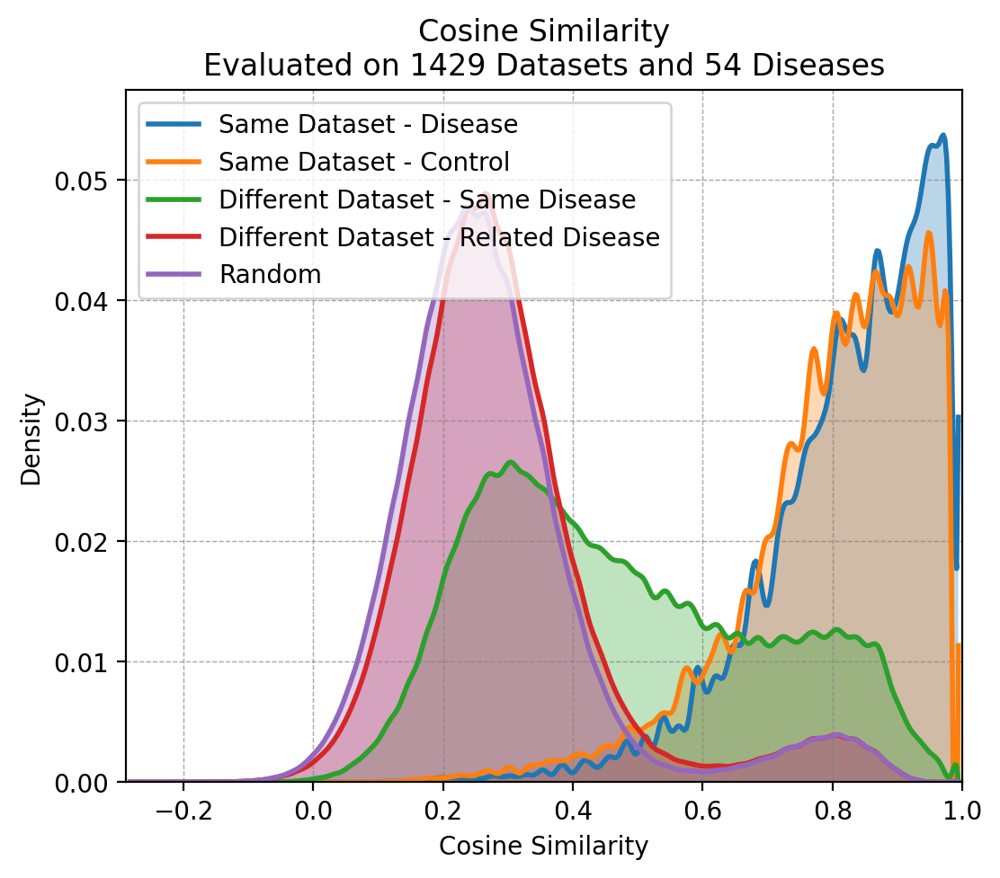

In [52]:

def plot_smoothed_line_through_histogram(all_data, bins, labels, title):
    """
    Plot smoothed lines for multiple datasets on the same plot.

    Args:
        all_data (list of np.ndarray): List of datasets (counts) to plot.
        bins (np.ndarray): Bin edges for the histogram.
        labels (list of str): Labels for each dataset.
    """
    from scipy.interpolate import make_interp_spline

    # Create the plot
    plt.figure(figsize=(6, 5), dpi=200)

    for data, label in zip(all_data, labels):
        # Compute bin centers
        bin_centers = 0.5 * (bins[:-1] + bins[1:])

        # Spline interpolation for smooth lines
        spline = make_interp_spline(bin_centers, data, k=9)  # Cubic spline
        x_smooth = np.linspace(bin_centers.min(), bin_centers.max(), 500)
        y_smooth = spline(x_smooth)

        # Plot the smoothed line
        plt.plot(x_smooth, y_smooth, label=label, linewidth=2)

        # # Overlay the histogram for context
        # plt.hist(
        #     bin_centers, bins=bins, weights=data, alpha=0.3, label=f"{label} Histogram"
        # )

        # fill_between
        plt.fill_between(x_smooth, y_smooth, alpha=0.3)

    # Add labels and legend
    plt.xlabel(f"{metric_i}")
    plt.ylabel("Density")
    plt.title(title)
    plt.legend(loc="upper left")
    plt.xlim(np.min(bins), np.max(bins))
    plt.ylim(
        0,
    )
    # show grid
    plt.grid(True, color="gray", linestyle="--", linewidth=0.5, alpha=0.7)

    plt.show()



# lists to store normalized counts
same_dis_dt_normalized = list()
control_normalized = list()
same_dis_normalized = list()
related_dis_normalized = list()
# unrelated_normalized = list()
other_normalized = list()


# loop through disease
n_datasets = 0
n_diseases = 0

all_diseases = df_obs["mesh_disease"].unique()
labels_diseases = list()
# loop through diseases
for i in tqdm(range(len(same_dis_dt))):
    # values for each dataset iteration i
    same_dis_dt_v_i = list()
    control_v_i = list()
    same_dis_v_i = list()
    related_dis_v_i = list()
    # unrelated_v_i = list()
    other_v_i = list()

    # loop through dataset
    for j in range(len(same_dis_dt[i])):
        same_dis_dt_ij = same_dis_dt[i][j]
        control_ij = control[i][j]
        same_dis_ij = same_dis[i][j]
        related_dis_ij = related_dis[i][j]
        # unrelated_ij = unrelated[i][j]
        other_ij = other[i][j]

        # don't retrieve data if no data for all categories
        if (
            (len(same_dis_dt_ij) == 0)
            or (len(control_ij) == 0)
            or (len(related_dis_ij) == 0)
            or (len(same_dis_ij) == 0)
            or (len(other_ij) == 0)
        ):
            continue

        # get values
        same_dis_dt_v_i.append(matrix[same_dis_dt_ij[:, 0], same_dis_dt_ij[:, 1]])
        control_v_i.append(matrix[control_ij[:, 0], control_ij[:, 1]])
        same_dis_v_i.append(matrix[same_dis_ij[:, 0], same_dis_ij[:, 1]])
        related_dis_v_i.append(matrix[related_dis_ij[:, 0], related_dis_ij[:, 1]])
        # unrelated_v_i.append(matrix[unrelated_ij[:, 0], unrelated_ij[:, 1]])
        other_v_i.append(matrix[other_ij[:, 0], other_ij[:, 1]])

        n_datasets += 1

    # don't append if no data for all categories
    if (
        (len(same_dis_dt_v_i) == 0)
        or (len(control_v_i) == 0)
        or (len(same_dis_v_i) == 0)
        or (len(related_dis_v_i) == 0)
        or (len(other_v_i) == 0)
    ):
        continue

    # normalize counts for diseases within a dataset
    same_dis_dt_normalized.append(
        normalize_counts_with_bins(same_dis_dt_v_i, fixed_bins.get(metric_i))
    )
    control_normalized.append(
        normalize_counts_with_bins(control_v_i, fixed_bins.get(metric_i))
    )

    same_dis_normalized.append(
        normalize_counts_with_bins(same_dis_v_i, fixed_bins.get(metric_i))
    )
    related_dis_normalized.append(
        normalize_counts_with_bins(related_dis_v_i, fixed_bins.get(metric_i))
    )
    # unrelated_normalized.append(
    #     normalize_counts_with_bins(unrelated_v_i, fixed_bins.get(metric_i))
    # )
    other_normalized.append(
        normalize_counts_with_bins(other_v_i, fixed_bins.get(metric_i))
    )

    # if [len(x) for x in same_dis_dt_normalized].count(0) > 0:
    #     print("ERROR")

    n_diseases += 1
    labels_diseases.append(all_diseases[i])

same_dis_dt_normalized_all = np.array(same_dis_dt_normalized).sum(axis=0) / len(
    same_dis_dt_normalized
)
control_normalized_all = np.array(control_normalized).sum(axis=0) / len(
    control_normalized
)

same_dis_normalized_all = np.array(same_dis_normalized).sum(axis=0) / len(
    same_dis_normalized
)
related_dis_normalized_all = np.array(related_dis_normalized).sum(axis=0) / len(
    related_dis_normalized
)
# unrelated_normalized_all = np.array(unrelated_normalized).sum(axis=0) / len(
#     unrelated_normalized
# )
other_normalized_all = np.array(other_normalized).sum(axis=0) / len(other_normalized)

# Example datasets
all_normalized = [
    same_dis_dt_normalized_all,
    control_normalized_all,
    same_dis_normalized_all,
    related_dis_normalized_all,
    other_normalized_all,
]

labels_plot = [
    "Same Dataset - Disease",
    "Same Dataset - Control",
    "Different Dataset - Same Disease",
    "Different Dataset - Related Disease",
    "Random",
]

title = f"{metric_i}\nEvaluated on {n_datasets} Datasets and {n_diseases} Diseases"

plot_smoothed_line_through_histogram(
    all_normalized, fixed_bins.get(metric_i), labels_plot, title
)

# if metric_i == "Euclidean Distance":
#     breakç

100%|██████████| 60/60 [00:05<00:00, 11.34it/s]


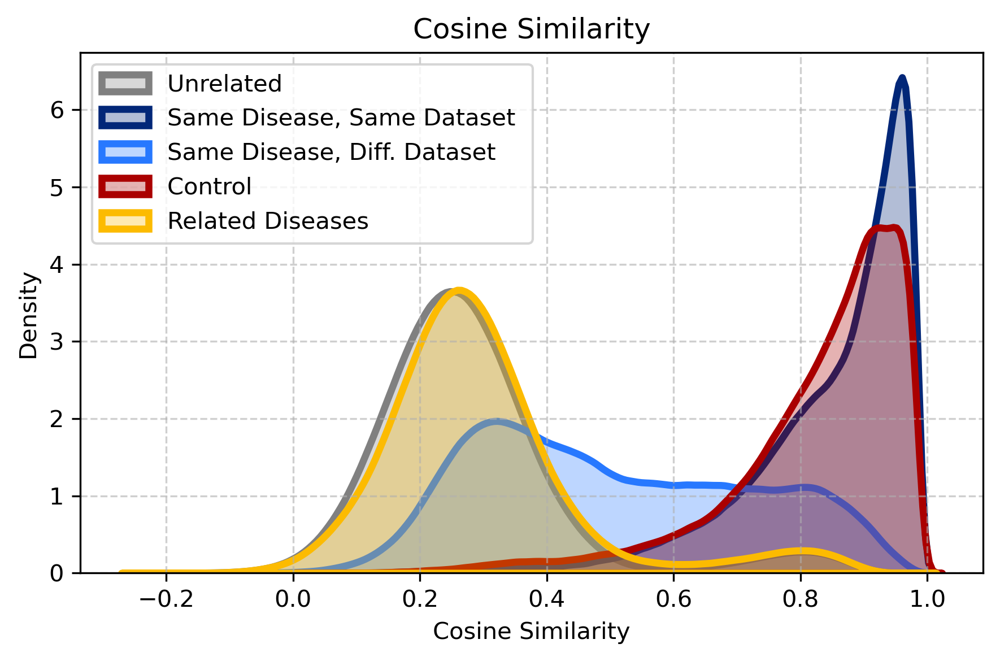

In [61]:
def plot_kde_distributions(data_dict, title, xlabel):
    """
    Plot KDEs for multiple categories using seaborn.

    Args:
        data_dict (dict): Keys are labels, values are 1D numpy arrays or lists of values.
        title (str): Plot title.
        xlabel (str): Label for the x-axis.
    """
    plt.figure(figsize=(6, 4), dpi=300)
    colors = ["grey", "#022778ff", "#2778ffff", "#aa0000ff", "#fcbb01ff" ]
    i = 0

    for label, values in data_dict.items():
        if len(values) == 0:
            continue
        sns.kdeplot(values, label=f"{label} ", fill=True, alpha=0.3, linewidth=3, color=colors[i])
        i+=1

    plt.xlabel(xlabel)
    plt.ylabel("Density")
    plt.title(title)
    plt.legend(loc="upper left")
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.tight_layout()
    plt.show()


# Prepare empty lists for raw values
same_dis_dt_values = []
control_values = []
same_dis_values = []
related_dis_values = []
other_values = []

n_datasets = 0
n_diseases = 0
labels_diseases = []

all_diseases = df_obs["mesh_disease"].unique()

for i in tqdm(range(len(same_dis_dt))):
    disease_has_data = False

    for j in range(len(same_dis_dt[i])):
        try:
            same_dis_dt_ij = same_dis_dt[i][j]
            control_ij = control[i][j]
            same_dis_ij = same_dis[i][j]
            related_dis_ij = related_dis[i][j]
            other_ij = other[i][j]

            # Skip if any category is empty
            if (
                len(same_dis_dt_ij) == 0 or len(control_ij) == 0 or
                len(same_dis_ij) == 0 or len(related_dis_ij) == 0 or
                len(other_ij) == 0
            ):
                continue

            # Collect raw values
            same_dis_dt_values.extend(matrix[same_dis_dt_ij[:, 0], same_dis_dt_ij[:, 1]])
            control_values.extend(matrix[control_ij[:, 0], control_ij[:, 1]])
            same_dis_values.extend(matrix[same_dis_ij[:, 0], same_dis_ij[:, 1]])
            related_dis_values.extend(matrix[related_dis_ij[:, 0], related_dis_ij[:, 1]])
            other_values.extend(matrix[other_ij[:, 0], other_ij[:, 1]])

            disease_has_data = True
            n_datasets += 1
        except Exception as e:
            print(f"Error in disease {i}, dataset {j}: {e}")
            continue

    if disease_has_data:
        labels_diseases.append(all_diseases[i])
        n_diseases += 1


plot_kde_distributions(
    {   
        "Unrelated": other_values,
        "Same Disease, Same Dataset": same_dis_dt_values,
        "Same Disease, Diff. Dataset": same_dis_values,
        "Control": control_values,
        "Related Diseases": related_dis_values,
        
    },
    title="Cosine Similarity",
    xlabel=metric_i,
)


In [47]:
same_dis_dt_v_i

[]

<Axes: ylabel='Density'>

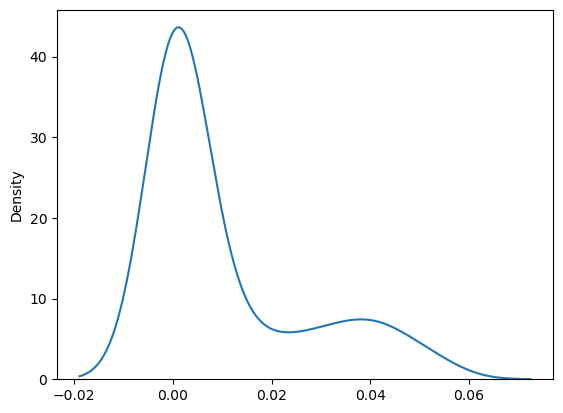

In [46]:
sns.kdeplot(same_dis_dt_normalized_all)

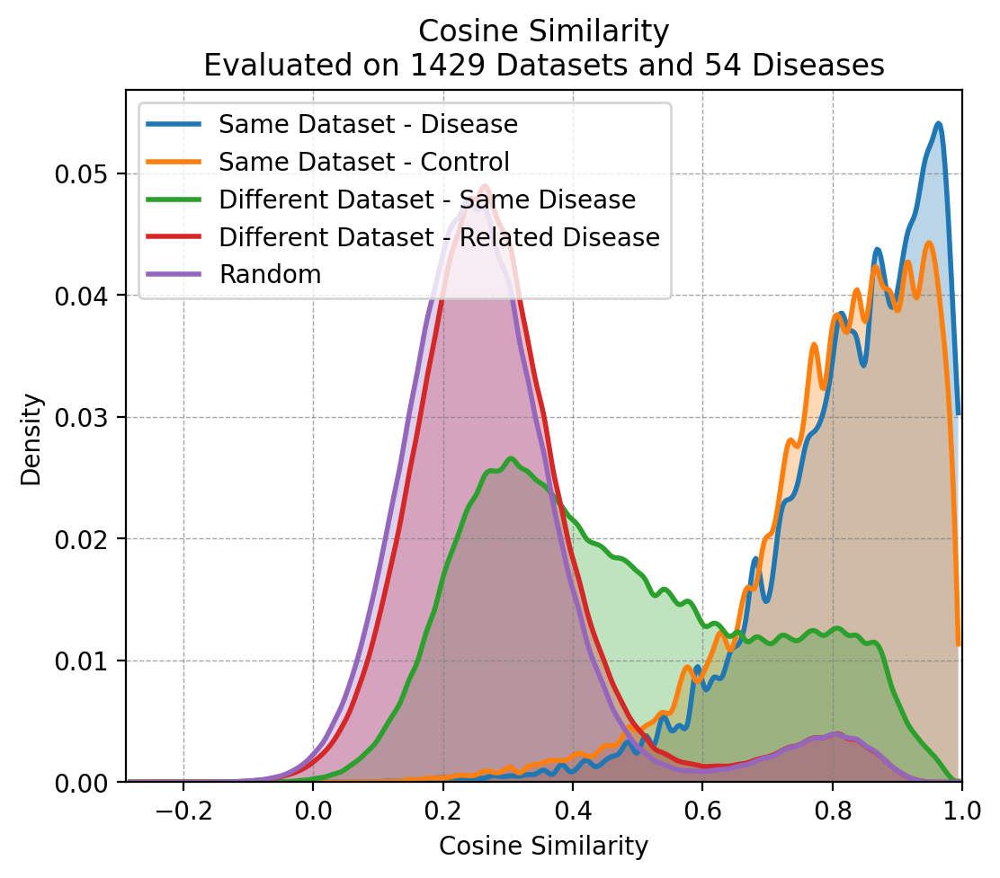

In [14]:
same_dis_dt_normalized_all = np.array(same_dis_dt_normalized).sum(axis=0) / len(
    same_dis_dt_normalized
)
control_normalized_all = np.array(control_normalized).sum(axis=0) / len(
    control_normalized
)

same_dis_normalized_all = np.array(same_dis_normalized).sum(axis=0) / len(
    same_dis_normalized
)
related_dis_normalized_all = np.array(related_dis_normalized).sum(axis=0) / len(
    related_dis_normalized
)
# unrelated_normalized_all = np.array(unrelated_normalized).sum(axis=0) / len(
#     unrelated_normalized
# )
other_normalized_all = np.array(other_normalized).sum(axis=0) / len(other_normalized)

# Example datasets
all_normalized = [
    same_dis_dt_normalized_all,
    control_normalized_all,
    same_dis_normalized_all,
    related_dis_normalized_all,
    other_normalized_all,
]

labels_plot = [
    "Same Dataset - Disease",
    "Same Dataset - Control",
    "Different Dataset - Same Disease",
    "Different Dataset - Related Disease",
    "Random",
]

title = f"{metric_i}\nEvaluated on {n_datasets} Datasets and {n_diseases} Diseases"

plot_smoothed_line_through_histogram(
    all_normalized, fixed_bins.get(metric_i), labels_plot, title
)

# if metric_i == "Euclidean Distance":
#     breakç

100%|██████████| 60/60 [00:05<00:00, 11.56it/s]


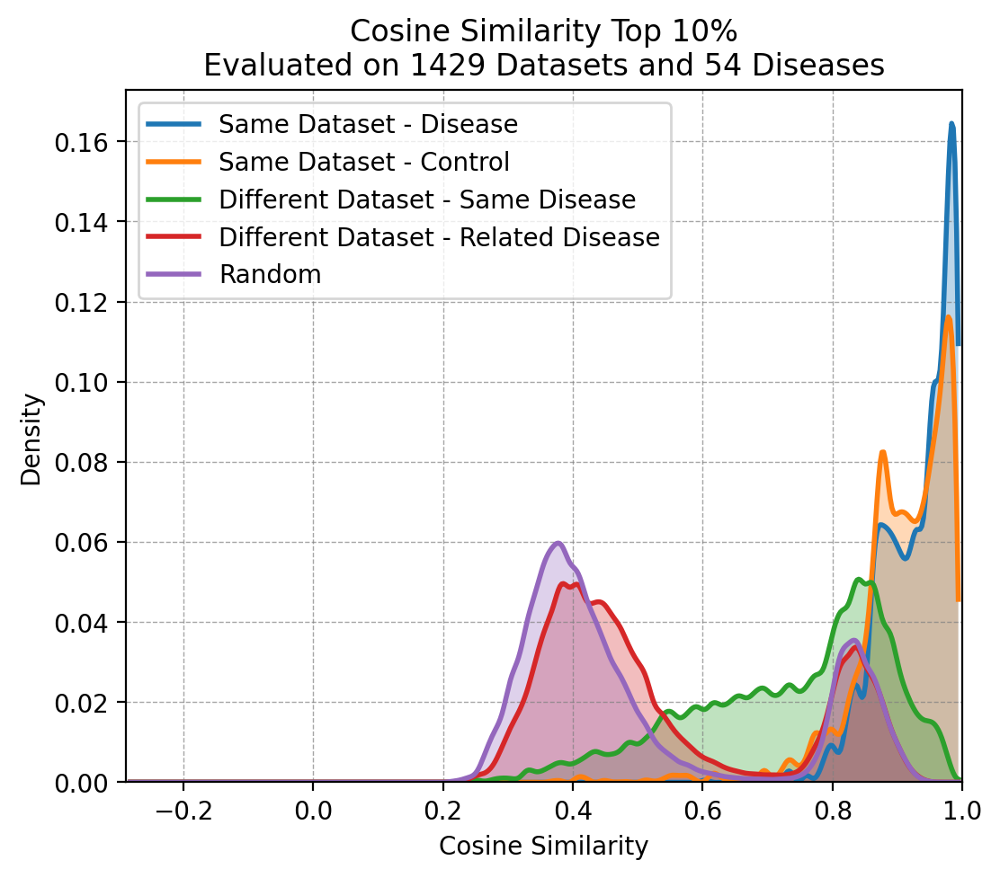

In [15]:
thr_pct = 90


def get_top_x_values(X: np.array, threshold: int) -> np.array:
    """Get top x values
    Args:
        - X (np.array): Input array
        - threshold (int): Threshold
    Returns:
        - np.array: Array with top x values
    """

    return X[X > np.percentile(X, threshold)]


# lists to store normalized counts
same_dis_dt_normalized = list()
control_normalized = list()
same_dis_normalized = list()
related_dis_normalized = list()
# unrelated_normalized = list()
other_normalized = list()


# loop through disease
n_datasets = 0
n_diseases = 0

all_diseases = df_obs["mesh_disease"].unique()
labels_diseases = list()
# loop through diseases
for i in tqdm(range(len(same_dis_dt))):
    # values for each dataset iteration i
    same_dis_dt_v_i = list()
    control_v_i = list()
    same_dis_v_i = list()
    related_dis_v_i = list()
    # unrelated_v_i = list()
    other_v_i = list()

    # loop through dataset
    for j in range(len(same_dis_dt[i])):
        same_dis_dt_ij = same_dis_dt[i][j]
        control_ij = control[i][j]
        same_dis_ij = same_dis[i][j]
        related_dis_ij = related_dis[i][j]
        # unrelated_ij = unrelated[i][j]
        other_ij = other[i][j]

        # don't retrieve data if no data for all categories
        if (
            (len(same_dis_dt_ij) == 0)
            or (len(control_ij) == 0)
            or (len(related_dis_ij) == 0)
            or (len(same_dis_ij) == 0)
            or (len(other_ij) == 0)
        ):
            continue

        # get top 10% values
        same_dis_dt_v_i.append(
            get_top_x_values(
                matrix[same_dis_dt_ij[:, 0], same_dis_dt_ij[:, 1]], thr_pct
            )
        )
        control_v_i.append(
            get_top_x_values(matrix[control_ij[:, 0], control_ij[:, 1]], thr_pct)
        )
        same_dis_v_i.append(
            get_top_x_values(matrix[same_dis_ij[:, 0], same_dis_ij[:, 1]], thr_pct)
        )
        related_dis_v_i.append(
            get_top_x_values(
                matrix[related_dis_ij[:, 0], related_dis_ij[:, 1]], thr_pct
            )
        )
        # unrelated_v_i.append(matrix[unrelated_ij[:, 0], unrelated_ij[:, 1]])
        other_v_i.append(
            get_top_x_values(matrix[other_ij[:, 0], other_ij[:, 1]], thr_pct)
        )

        n_datasets += 1

    # don't append if no data for all categories
    if (
        (len(same_dis_dt_v_i) == 0)
        or (len(control_v_i) == 0)
        or (len(same_dis_v_i) == 0)
        or (len(related_dis_v_i) == 0)
        or (len(other_v_i) == 0)
    ):
        continue

    # normalize counts for diseases within a dataset
    same_dis_dt_normalized.append(
        normalize_counts_with_bins(same_dis_dt_v_i, fixed_bins.get(metric_i))
    )
    control_normalized.append(
        normalize_counts_with_bins(control_v_i, fixed_bins.get(metric_i))
    )

    same_dis_normalized.append(
        normalize_counts_with_bins(same_dis_v_i, fixed_bins.get(metric_i))
    )
    related_dis_normalized.append(
        normalize_counts_with_bins(related_dis_v_i, fixed_bins.get(metric_i))
    )
    # unrelated_normalized.append(
    #     normalize_counts_with_bins(unrelated_v_i, fixed_bins.get(metric_i))
    # )
    other_normalized.append(
        normalize_counts_with_bins(other_v_i, fixed_bins.get(metric_i))
    )

    # if [len(x) for x in same_dis_dt_normalized].count(0) > 0:
    #     print("ERROR")

    n_diseases += 1
    labels_diseases.append(all_diseases[i])

same_dis_dt_normalized_all = np.array(same_dis_dt_normalized).sum(axis=0) / len(
    same_dis_dt_normalized
)
control_normalized_all = np.array(control_normalized).sum(axis=0) / len(
    control_normalized
)

same_dis_normalized_all = np.array(same_dis_normalized).sum(axis=0) / len(
    same_dis_normalized
)
related_dis_normalized_all = np.array(related_dis_normalized).sum(axis=0) / len(
    related_dis_normalized
)
# unrelated_normalized_all = np.array(unrelated_normalized).sum(axis=0) / len(
#     unrelated_normalized
# )
other_normalized_all = np.array(other_normalized).sum(axis=0) / len(other_normalized)

# Example datasets
all_normalized = [
    same_dis_dt_normalized_all,
    control_normalized_all,
    same_dis_normalized_all,
    related_dis_normalized_all,
    other_normalized_all,
]

labels_plot = [
    "Same Dataset - Disease",
    "Same Dataset - Control",
    "Different Dataset - Same Disease",
    "Different Dataset - Related Disease",
    "Random",
]

title = f"{metric_i} Top {100-thr_pct}%\nEvaluated on {n_datasets} Datasets and {n_diseases} Diseases"

plot_smoothed_line_through_histogram(
    all_normalized, fixed_bins.get(metric_i), labels_plot, title
)

# if metric_i == "Euclidean Distance":
#     breakç

100%|██████████| 60/60 [00:22<00:00,  2.70it/s]


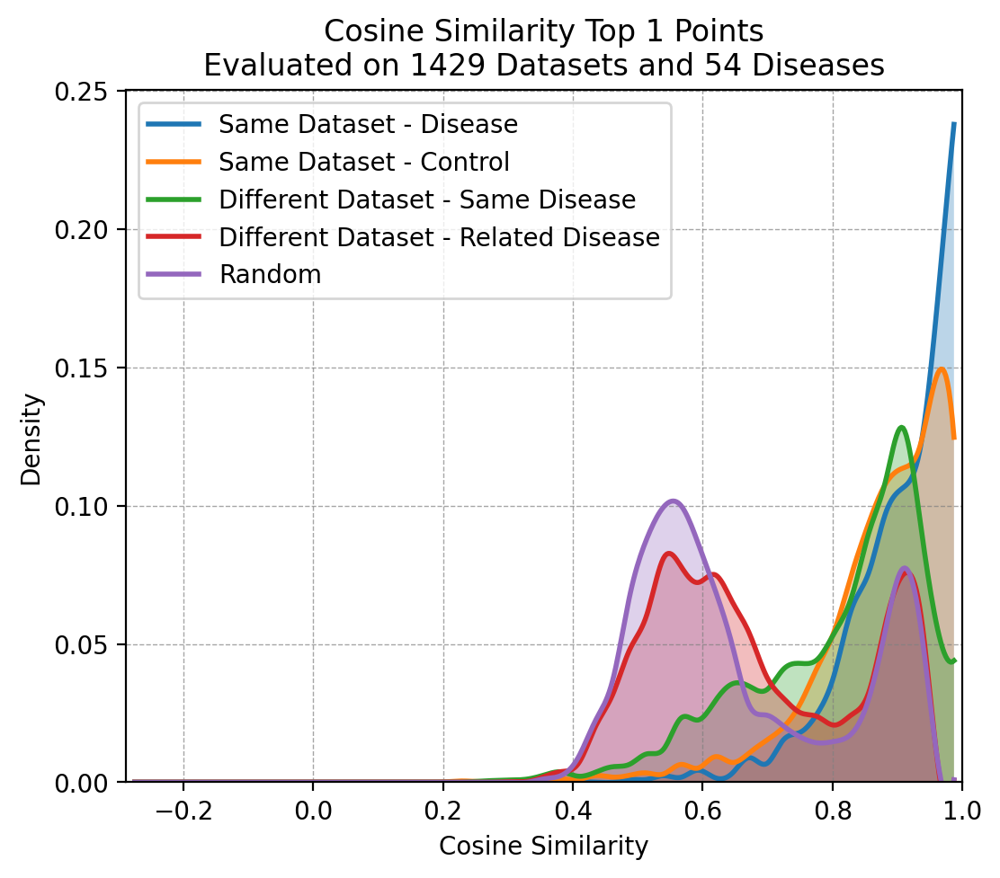

In [16]:
fixed_bins = {
    "Cosine Similarity": np.linspace(np.nanmin(matrix), 1, 50),
    # "Euclidean Distance": np.linspace(0, np.nanmax(matrix), 100),
    "Pearson Correlation": np.linspace(-1, 1, 100),
}

thr_k = 1


def get_top_k_values(X: np.array, k: int) -> np.array:
    """Get top x values
    Args:
        - X (np.array): Input array
        - k (int): Threshold
    Returns:
        - np.array: Array with top x values
    """

    return np.sort(X)[::-1][:k]


def get_top_k_values_iter(X: np.array, idx_pairs: np.array, k: int) -> np.array:
    """Get top k values for EACH ROW ELEMENT
    Args:
        - X (np.array): Input array
        - idx_pairs (np.array): Index pairs
        - k (int): Threshold
    Returns:
        - np.array: Array with top x values
    """
    top_values = list()
    for element in set(idx_pairs[:, 0]):
        mask = idx_pairs[:, 0] == element
        top_values.extend(get_top_k_values(X[mask], k))
    return np.array(top_values)


# lists to store normalized counts
same_dis_dt_normalized = list()
control_normalized = list()
same_dis_normalized = list()
related_dis_normalized = list()
# unrelated_normalized = list()
other_normalized = list()


# loop through disease
n_datasets = 0
n_diseases = 0

all_diseases = df_obs["mesh_disease"].unique()
labels_diseases = list()
# loop through diseases
for i in tqdm(range(len(same_dis_dt))):
    # values for each dataset iteration i
    same_dis_dt_v_i = list()
    control_v_i = list()
    same_dis_v_i = list()
    related_dis_v_i = list()
    # unrelated_v_i = list()
    other_v_i = list()

    # loop through dataset
    for j in range(len(same_dis_dt[i])):
        same_dis_dt_ij = same_dis_dt[i][j]
        control_ij = control[i][j]
        same_dis_ij = same_dis[i][j]
        related_dis_ij = related_dis[i][j]
        # unrelated_ij = unrelated[i][j]
        other_ij = other[i][j]

        # don't retrieve data if no data for all categories
        if (
            (len(same_dis_dt_ij) == 0)
            or (len(control_ij) == 0)
            or (len(related_dis_ij) == 0)
            or (len(same_dis_ij) == 0)
            or (len(other_ij) == 0)
        ):
            continue

        # get top 10% values
        same_dis_dt_v_i.append(
            get_top_k_values_iter(
                matrix[same_dis_dt_ij[:, 0], same_dis_dt_ij[:, 1]],
                same_dis_dt_ij,
                thr_k,
            )
        )
        control_v_i.append(
            get_top_k_values_iter(
                matrix[control_ij[:, 0], control_ij[:, 1]], control_ij, thr_k
            )
        )
        same_dis_v_i.append(
            get_top_k_values_iter(
                matrix[same_dis_ij[:, 0], same_dis_ij[:, 1]], same_dis_ij, thr_k
            )
        )
        related_dis_v_i.append(
            get_top_k_values_iter(
                matrix[related_dis_ij[:, 0], related_dis_ij[:, 1]],
                related_dis_ij,
                thr_k,
            )
        )
        # unrelated_v_i.append(matrix[unrelated_ij[:, 0], unrelated_ij[:, 1]])
        other_v_i.append(
            get_top_k_values_iter(
                matrix[other_ij[:, 0], other_ij[:, 1]], other_ij, thr_k
            )
        )

        n_datasets += 1

    # don't append if no data for all categories
    if (
        (len(same_dis_dt_v_i) == 0)
        or (len(control_v_i) == 0)
        or (len(same_dis_v_i) == 0)
        or (len(related_dis_v_i) == 0)
        or (len(other_v_i) == 0)
    ):
        continue

    # normalize counts for diseases within a dataset
    same_dis_dt_normalized.append(
        normalize_counts_with_bins(same_dis_dt_v_i, fixed_bins.get(metric_i))
    )
    control_normalized.append(
        normalize_counts_with_bins(control_v_i, fixed_bins.get(metric_i))
    )

    same_dis_normalized.append(
        normalize_counts_with_bins(same_dis_v_i, fixed_bins.get(metric_i))
    )
    related_dis_normalized.append(
        normalize_counts_with_bins(related_dis_v_i, fixed_bins.get(metric_i))
    )
    # unrelated_normalized.append(
    #     normalize_counts_with_bins(unrelated_v_i, fixed_bins.get(metric_i))
    # )
    other_normalized.append(
        normalize_counts_with_bins(other_v_i, fixed_bins.get(metric_i))
    )

    # if [len(x) for x in same_dis_dt_normalized].count(0) > 0:
    #     print("ERROR")

    n_diseases += 1
    labels_diseases.append(all_diseases[i])

same_dis_dt_normalized_all = np.array(same_dis_dt_normalized).sum(axis=0) / len(
    same_dis_dt_normalized
)
control_normalized_all = np.array(control_normalized).sum(axis=0) / len(
    control_normalized
)

same_dis_normalized_all = np.array(same_dis_normalized).sum(axis=0) / len(
    same_dis_normalized
)
related_dis_normalized_all = np.array(related_dis_normalized).sum(axis=0) / len(
    related_dis_normalized
)
# unrelated_normalized_all = np.array(unrelated_normalized).sum(axis=0) / len(
#     unrelated_normalized
# )
other_normalized_all = np.array(other_normalized).sum(axis=0) / len(other_normalized)

# Example datasets
all_normalized = [
    same_dis_dt_normalized_all,
    control_normalized_all,
    same_dis_normalized_all,
    related_dis_normalized_all,
    other_normalized_all,
]

labels_plot = [
    "Same Dataset - Disease",
    "Same Dataset - Control",
    "Different Dataset - Same Disease",
    "Different Dataset - Related Disease",
    "Random",
]

title = f"{metric_i} Top {thr_k} Points\nEvaluated on {n_datasets} Datasets and {n_diseases} Diseases"

plot_smoothed_line_through_histogram(
    all_normalized, fixed_bins.get(metric_i), labels_plot, title
)

# if metric_i == "Euclidean Distance":
#     breakç

In [17]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import numpy as np

# List of tissues
tissues = adata.obs["tissue"].dropna().unique().tolist()

# Vectorize tissue names using TF-IDF
vectorizer = TfidfVectorizer()
tissue_vectors = vectorizer.fit_transform(tissues)

# Perform clustering (e.g., into 5 groups)
num_clusters = 10
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(tissue_vectors)

# Group tissues by cluster
clusters = {}
for idx, label in enumerate(kmeans.labels_):
    if label not in clusters:
        clusters[label] = []
    clusters[label].append(tissues[idx])

# Print clusters
for cluster_id, tissue_group in clusters.items():
    print(f"Cluster {cluster_id}: {tissue_group}")

Cluster 8: ['Skeletal muscle', 'Muscle', 'Airway smooth muscle', 'Smooth muscle']
Cluster 5: ['Skin', 'nan', 'Brain', 'Heart', 'Quadriceps', 'Tibialis anterior', 'Central nervous system', 'Spinal cord', 'Callosal sulcus', 'Corticospinal tract', 'Deltoid', 'Lung', 'Colorectum', 'Colon', 'Peripheral blood', 'Mucosa', 'Plasma', 'Endothelium', 'Blood', 'Rectum', 'Liver', 'Pancreatic islet', 'Whole blood', 'Lumbar spinal cord', 'Kidney', 'Vastus lateralis', 'Pancreas', 'Myotube', 'Artery', 'Buccal cavity', 'Venous blood', 'Nasal airway epithelium', 'Tracheobronchial', 'Bronchus', 'Large airway epithelium', 'Bronchial airway', 'Airway wall', 'Airway', 'Nasal epithelium', 'Upper airway', 'Lower airway', 'Nasal scrape', 'Bronchial epithelium', 'Nasal mucosa', 'Epidermis', 'Bronchia', 'Cervix', 'Exocervix', 'Endocervix', 'Breast', 'Dermis', 'Ovary', 'Fallopian tube', 'Blood vessel', 'Endometrium', 'Placenta', 'Sigmoideum', 'Scalp skin', 'Chest wall', 'Lateral temporal lobe', 'Choroid plexus', '

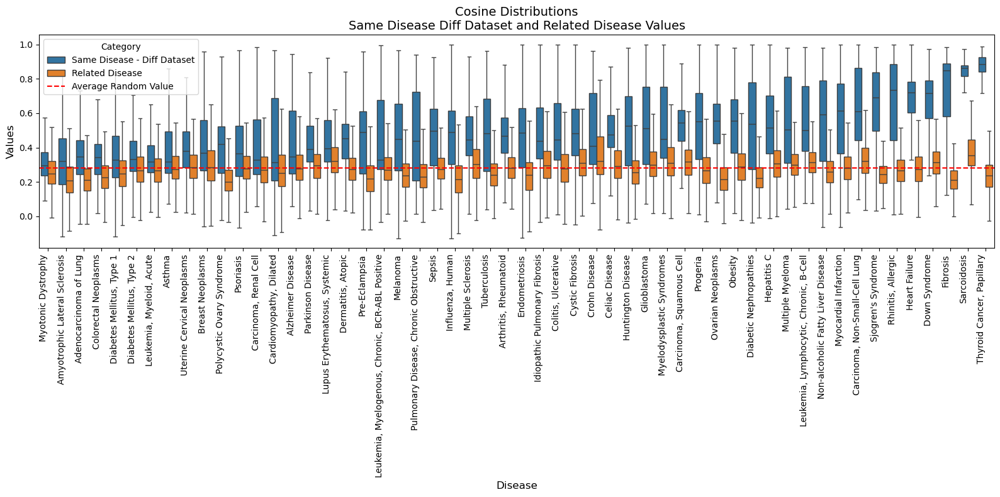

In [18]:
# Initialize storage for boxplot data
boxplot_data = {"same_dis": [], "related_dis": [], "diseases": []}

# Loop through diseases
all_disease = df_obs["mesh_disease"].unique()

label_diseases = list()
for i in range(len(same_dis)):
    # Collect data for boxplots
    same_dis_v_i = []
    related_dis_v_i = []

    for j in range(len(same_dis[i])):
        # Append values for this disease and dataset
        same_dis_v_i.extend(matrix[same_dis[i][j][:, 0], same_dis[i][j][:, 1]])
        related_dis_v_i.extend(matrix[related_dis[i][j][:, 0], related_dis[i][j][:, 1]])

    if len(same_dis_v_i) == 0 or len(related_dis_v_i) == 0:
        continue

    # Store disease name and values
    boxplot_data["same_dis"].append(same_dis_v_i)
    boxplot_data["related_dis"].append(related_dis_v_i)
    boxplot_data["diseases"].append(f"Disease {i+1}")

    label_diseases.append(all_disease[i])

# Calculate average random value across all `other` values
random_values = []
for i in range(len(other)):
    for j in range(len(other[i])):
        random_values.extend(matrix[other[i][j][:, 0], other[i][j][:, 1]])
average_random_value = np.mean(random_values)
import numpy as np
import matplotlib.pyplot as plt

# Sort diseases by the mean value of `same_dis`
sorted_indices = np.argsort([np.mean(values) for values in boxplot_data["same_dis"]])
boxplot_data["same_dis"] = [boxplot_data["same_dis"][i] for i in sorted_indices]
boxplot_data["related_dis"] = [boxplot_data["related_dis"][i] for i in sorted_indices]
boxplot_data["diseases"] = label_diseases
# Prepare for plotting
positions = np.arange(len(boxplot_data["diseases"]))
width = 0.4  # Width of each boxplot group


# Prepare the data for Seaborn
data = []

for i, disease in enumerate(boxplot_data["diseases"]):
    # Add same_dis data
    for value in boxplot_data["same_dis"][i]:
        data.append(
            {
                "Disease": disease,
                "Value": value,
                "Category": "Same Disease - Diff Dataset",
            }
        )
    # Add related_dis data
    for value in boxplot_data["related_dis"][i]:
        data.append({"Disease": disease, "Value": value, "Category": "Related Disease"})

# Convert to DataFrame
df = pd.DataFrame(data)

# Sort diseases by the mean of Same Disease - Diff Dataset values
same_dis_means = (
    df[df["Category"] == "Same Disease - Diff Dataset"]
    .groupby("Disease")["Value"]
    .mean()
    .sort_values()
)
df["Disease"] = pd.Categorical(
    df["Disease"], categories=same_dis_means.index, ordered=True
)

# Plot using Seaborn
plt.figure(figsize=(16, 8))
ax = sns.boxplot(
    data=df,
    x="Disease",
    y="Value",
    hue="Category",
    showfliers=False,  # Hide outliers
    showmeans=False,  # Show means
    meanprops={"marker": "o", "markerfacecolor": "black", "markeredgecolor": "black"},
)

# Add average random value line
ax.axhline(
    y=average_random_value, color="red", linestyle="--", label="Average Random Value"
)

# Customize plot
ax.set_title(
    "Cosine Distributions\nSame Disease Diff Dataset and Related Disease Values",
    fontsize=14,
)
ax.set_xlabel("Disease", fontsize=12)
ax.set_ylabel("Values", fontsize=12)
ax.legend(title="Category")
plt.xticks(rotation=90, ha="right")
plt.tight_layout()

plt.show()

## Plot disease specific disease distances

In [19]:
from scipy.interpolate import make_interp_spline


def plot_smoothed_line_through_histogram(all_data, bins, labels, title):
    """
    Plot smoothed lines for multiple datasets on the same plot.

    Args:
        all_data (list of np.ndarray): List of datasets (counts) to plot.
        bins (np.ndarray): Bin edges for the histogram.
        labels (list of str): Labels for each dataset.
    """
    from scipy.interpolate import make_interp_spline

    # Create the plot
    plt.figure(figsize=(6, 4), dpi=200)

    for data, label in zip(all_data, labels):
        # Compute bin centers
        bin_centers = 0.5 * (bins[:-1] + bins[1:])

        # Spline interpolation for smooth lines
        spline = make_interp_spline(bin_centers, data, k=3)  # Cubic spline
        x_smooth = np.linspace(bin_centers.min(), bin_centers.max(), 250)
        y_smooth = spline(x_smooth)

        # Plot the smoothed line
        if label in ["Random", "Different Dataset - Related Disease"]:
            plt.plot(x_smooth, y_smooth, label=label, linewidth=2, alpha=0.9)
            plt.fill_between(x_smooth, y_smooth, alpha=0.9)
        else:
            plt.plot(x_smooth, y_smooth, label=label, linewidth=2, alpha=0.5)
            plt.fill_between(x_smooth, y_smooth, alpha=0.1)

    # Add labels and legend
    plt.xlabel(f"{metric_i}")
    plt.ylabel("Density")
    plt.title(title)
    plt.legend(loc="upper left")
    plt.xlim(np.min(bins), np.max(bins))
    plt.ylim(
        0,
    )
    # show grid
    plt.grid(True, color="gray", linestyle="--", linewidth=0.5, alpha=0.7)

    plt.show()


def get_relationship_root(
    mesh_id: str, root_id: str, df_obs: pd.DataFrame, mesh_id_2_tree_terms: dict
) -> List:
    """Get Relationship between two diseases
    Args:
        - mesh_id (str): MeSH ID
        - root_id (str): Root ID
        - df_obs (pd.DataFrame): DataFrame with disease information
        - mesh_id_2_tree_terms (dict): Mapping of MeSH ID to Tree Terms
    Returns:
        - relationship (List): List of relationships
    """

    # get root tree terms
    tree_term = shorten_terms(mesh_id_2_tree_terms[mesh_id])

    # clean terms
    tree_term = [x for x in tree_term if x.startswith("C")]

    relationship = list()

    for i, row in df_obs.iterrows():
        disease_i = row["disease"]
        mesh_id_i = row["mesh_id"]
        tree_term_i = shorten_terms(mesh_id_2_tree_terms[mesh_id_i])

        # clean terms
        tree_term_i = [x for x in tree_term_i if x.startswith("C")]

        # check if same disease
        condition_1 = mesh_id == mesh_id_i

        # check if control
        condition_2 = disease_i == "Control"

        # check if related
        condition_3 = len(set(tree_term).intersection(set(tree_term_i))) > 0

        # check if related to root
        condition_4 = len(set(root_id).intersection(set(tree_term_i))) > 0

        # Same Disease
        if condition_1 and not condition_2:
            relationship.append("same disease")

        # Control for same Disease
        elif condition_1 and condition_2:
            relationship.append("control")

        # Related Disease
        elif condition_4 and not condition_2:
            relationship.append("related disease")

        # Related but not root
        elif condition_3 and not condition_2:
            relationship.append("related but not root")

        else:
            relationship.append("other")

    return relationship

In [20]:
root_id = ["C04"]
max_sample = 100000

same_dis_dt = list()
control = list()
unrelated_dt = list()
same_dis = list()
related_dis = list()
# unrelated = list()
other = list()

# Loop through datasets w/ unrelated diseases


mesh_ids = df_obs["mesh_id"].unique()
mesh_ids = [
    k
    for k in mesh_ids
    if len(set(shorten_terms(mesh_id_2_tree_terms.get(k))).intersection(set(root_id)))
    > 0
]

for mesh_i in tqdm(mesh_ids):
    QUERY = f"mesh_id == '{mesh_i}'"
    df_query = df_obs.query(QUERY)

    same_dis_dt_i = list()
    control_i = list()
    unrelated_dt_i = list()
    same_dis_i = list()
    related_dis_i = list()
    # unrelated_i = list()
    other_i = list()

    # define relationships knowing the disease
    df_obs["relationship"] = get_relationship_root(
        mesh_i, root_id, df_obs, mesh_id_2_tree_terms
    )

    # Loop through diseases in dataset
    for dataset_j in df_query["dataset"].unique():

        # get same disease indexes
        QUERY = "dataset == @dataset_j and relationship == 'same disease'"
        same_dis_dt_idxs = df_obs.query(QUERY).index.to_list()

        # get control indexes
        QUERY = "dataset == @dataset_j and relationship == 'control'"
        control_idxs = df_obs.query(QUERY).index.to_list()

        # get same disease indexes
        QUERY = "dataset != @dataset_j and relationship == 'same disease'"
        same_dis_idxs = df_obs.query(QUERY).index.to_list()

        # get related disease indexes
        QUERY = "relationship == 'related disease' and dataset != @dataset_j"
        related_dis_idxs = df_obs.query(QUERY).index.to_list()

        # # get unrelated disease different indexes
        # QUERY = "relationship == 'unrelated disease' and dataset != @dataset_j"
        # unrelated_idxs = df_obs.query(QUERY).index.to_list()

        # get other indexes
        QUERY = "dataset != @dataset_j and relationship == 'other'"
        other_idxs = df_obs.query(QUERY).index.to_list()

        # sample other indexes
        same_dis_dt_idxs = random.sample(
            same_dis_dt_idxs, min(len(same_dis_dt_idxs), max_sample)
        )

        control_idxs = random.sample(control_idxs, min(len(control_idxs), max_sample))

        other_idxs = random.sample(other_idxs, min(len(other_idxs), max_sample))
        related_dis_idxs = random.sample(
            related_dis_idxs, min(len(related_dis_idxs), max_sample)
        )
        same_dis_idxs = random.sample(
            same_dis_idxs, min(len(same_dis_idxs), max_sample)
        )

        # if we have data for all categories
        if (
            len(same_dis_dt_idxs) > 0
            and len(control_idxs) > 0
            and len(same_dis_idxs) > 0
            and len(related_dis_idxs) > 0
            and len(other_idxs) > 0
        ):
            # compute index pairs
            same_dis_dt_i.append(
                np.array(list(permutations(same_dis_dt_idxs, 2))).astype(int)
            )
            control_i.append(
                np.array(list(product(same_dis_dt_idxs, control_idxs))).astype(int)
            )
            same_dis_i.append(
                np.array(list(product(same_dis_dt_idxs, same_dis_idxs))).astype(int)
            )
            related_dis_i.append(
                np.array(list(product(same_dis_dt_idxs, related_dis_idxs))).astype(int)
            )
            # unrelated_i.append(list(product(same_dis_dt_idxs, unrelated_idxs)))
            other_i.append(
                np.array(list(product(same_dis_dt_idxs, other_idxs))).astype(int)
            )

    same_dis_dt.append(same_dis_dt_i)
    control.append(control_i)
    same_dis.append(same_dis_i)
    related_dis.append(related_dis_i)
    # unrelated.append(unrelated_i)
    other.append(other_i)

100%|██████████| 16/16 [02:25<00:00,  9.11s/it]


  0%|          | 0/16 [00:00<?, ?it/s]

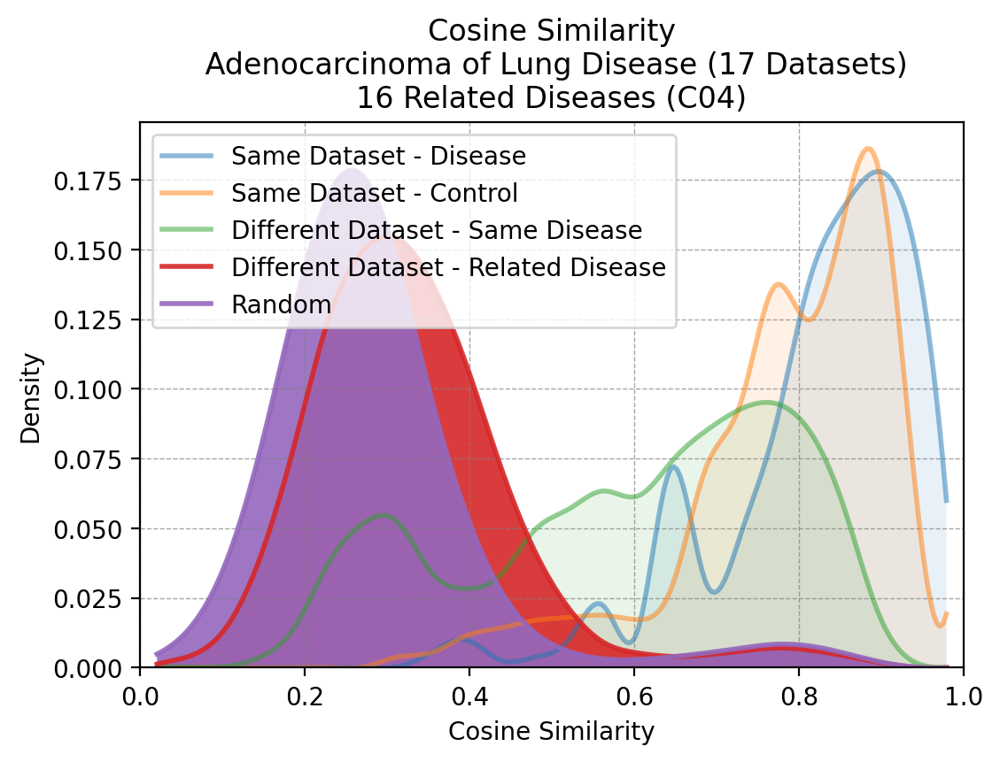

  6%|▋         | 1/16 [00:03<00:48,  3.23s/it]

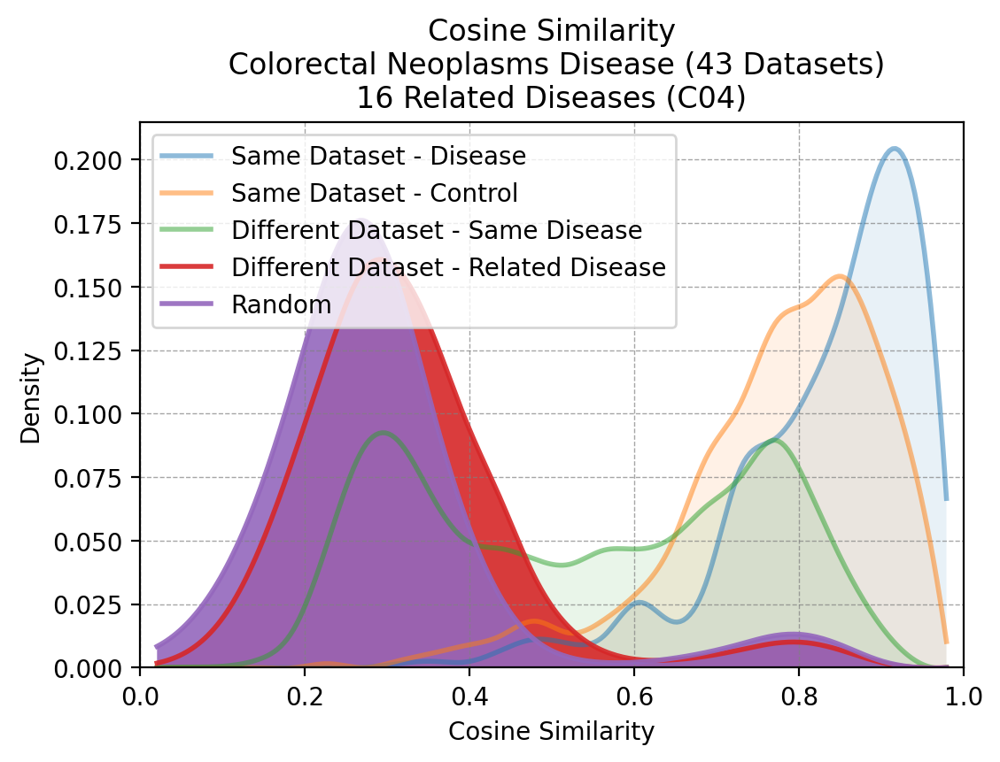

 12%|█▎        | 2/16 [00:08<00:57,  4.14s/it]

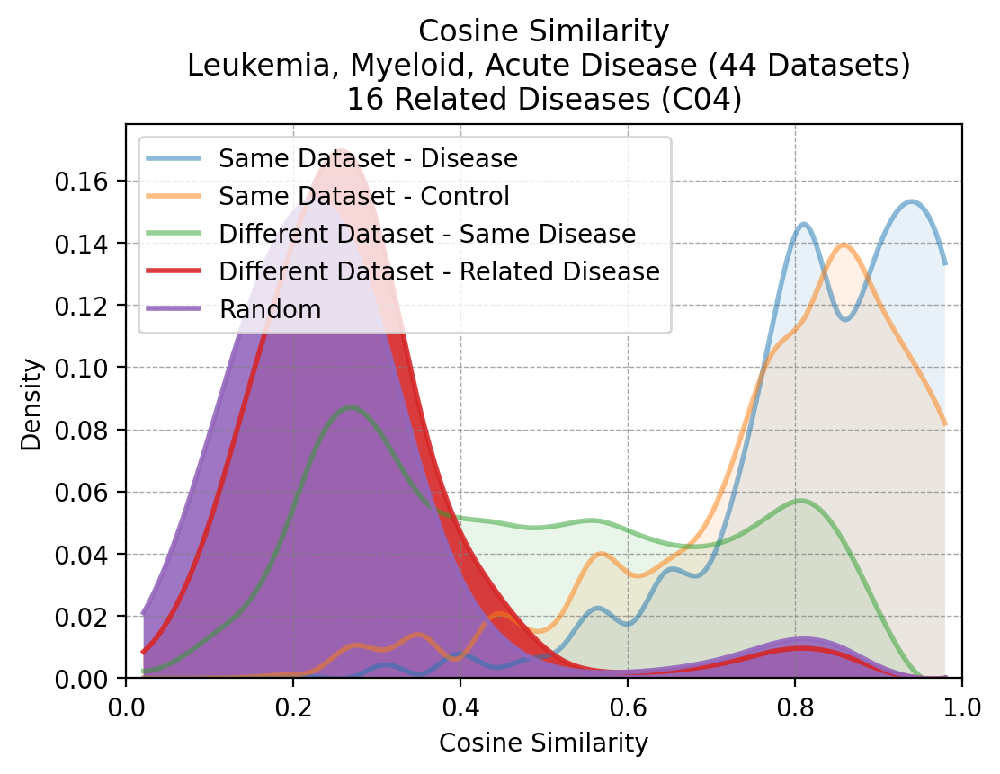

 19%|█▉        | 3/16 [00:12<00:53,  4.08s/it]

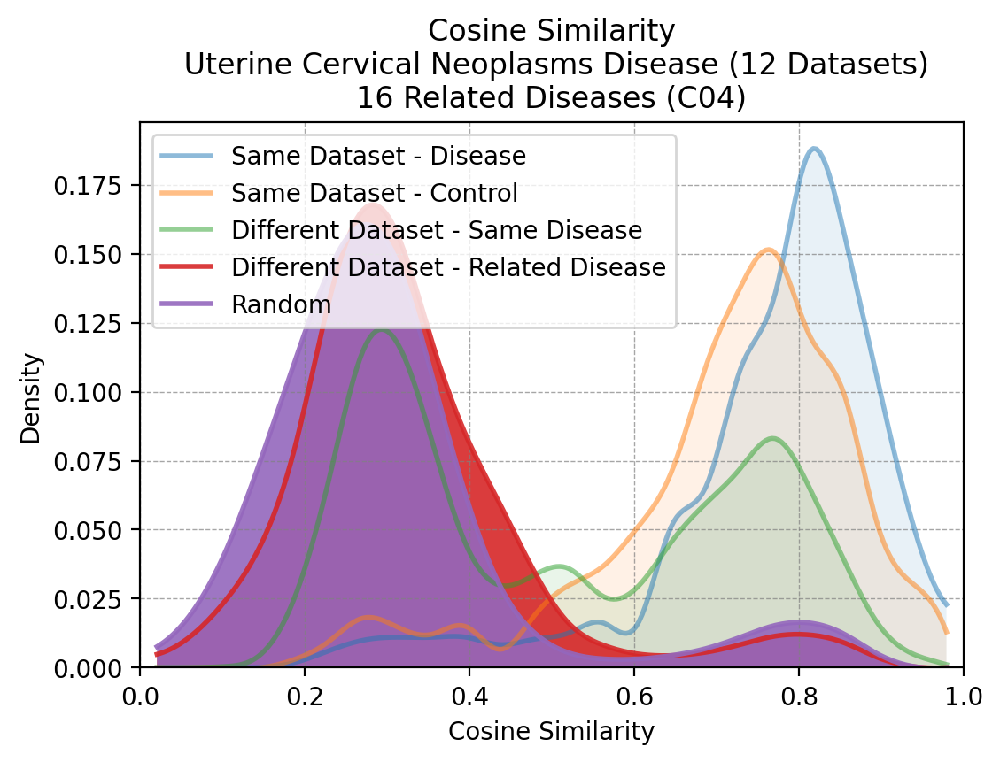

 25%|██▌       | 4/16 [00:13<00:35,  2.97s/it]

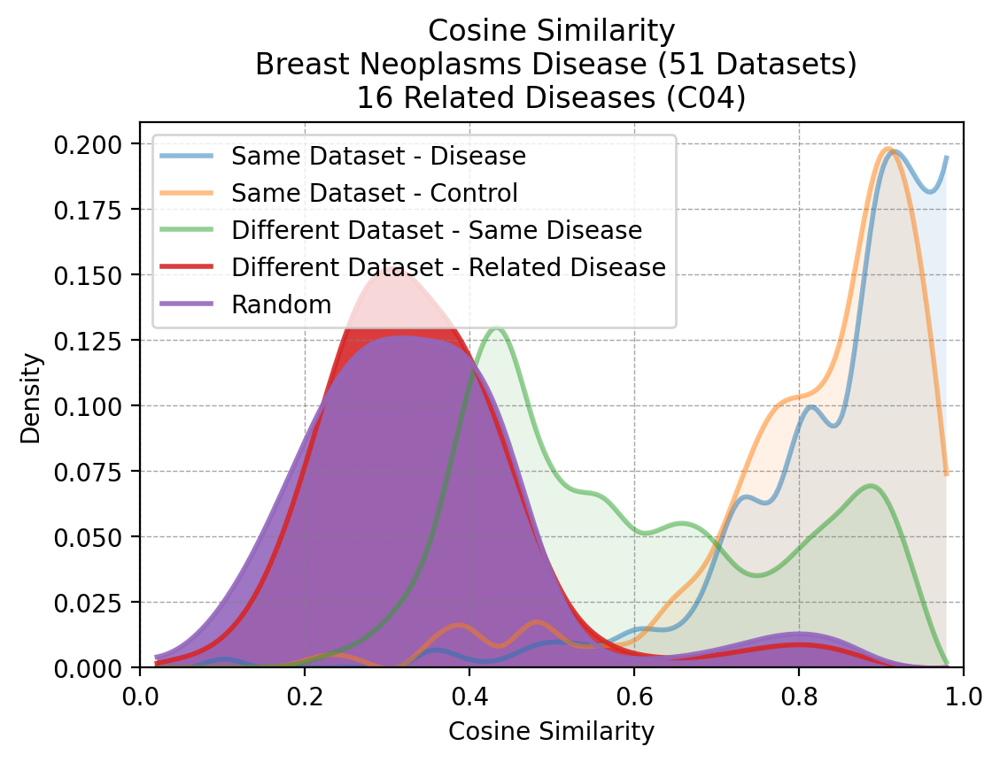

 31%|███▏      | 5/16 [00:19<00:44,  4.04s/it]

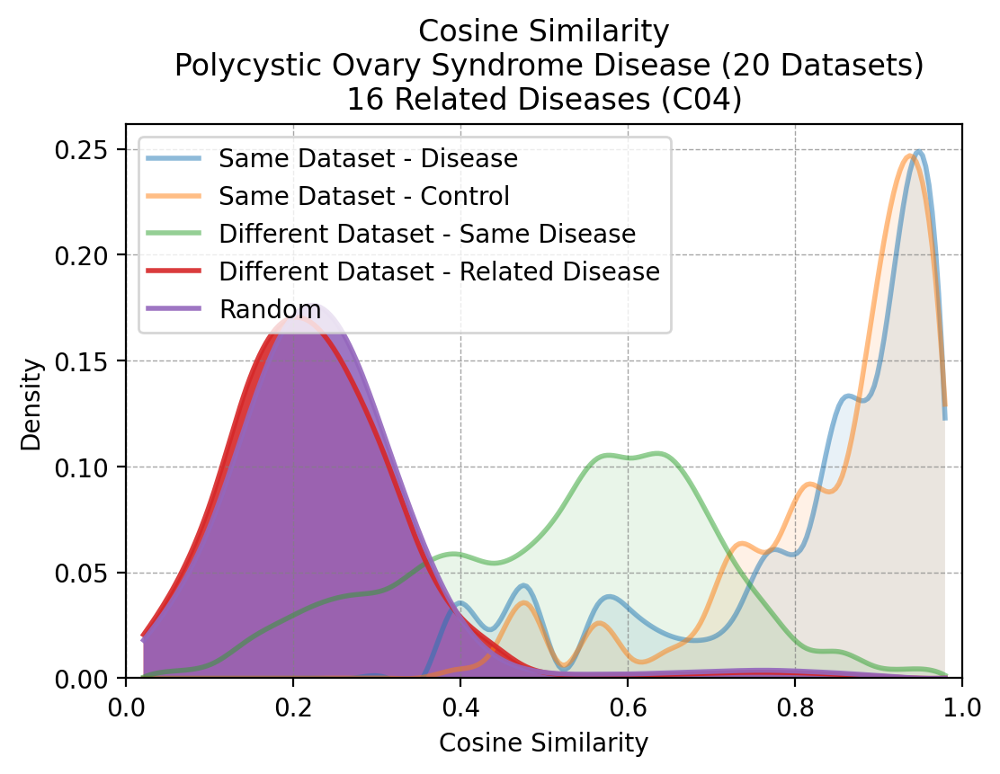

 38%|███▊      | 6/16 [00:19<00:28,  2.88s/it]

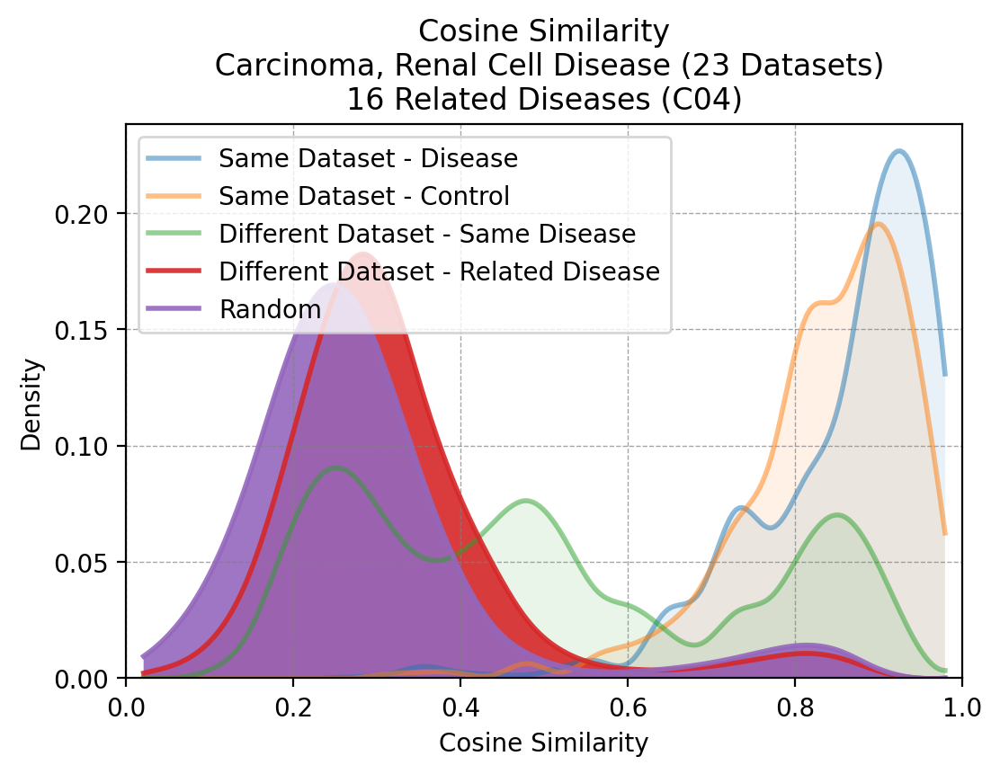

 44%|████▍     | 7/16 [00:21<00:21,  2.40s/it]

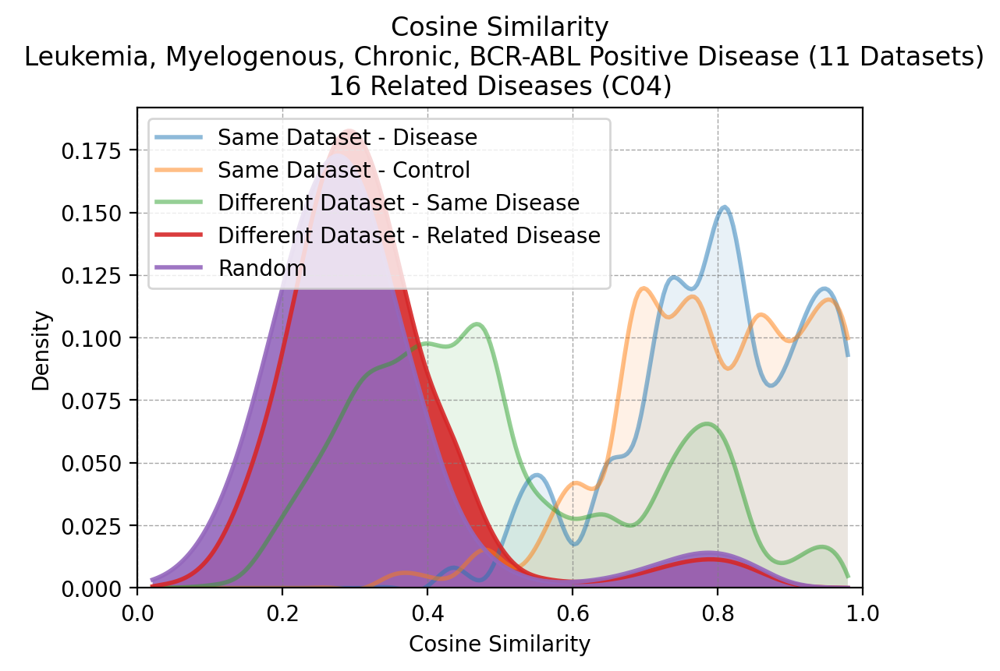

 50%|█████     | 8/16 [00:21<00:14,  1.83s/it]

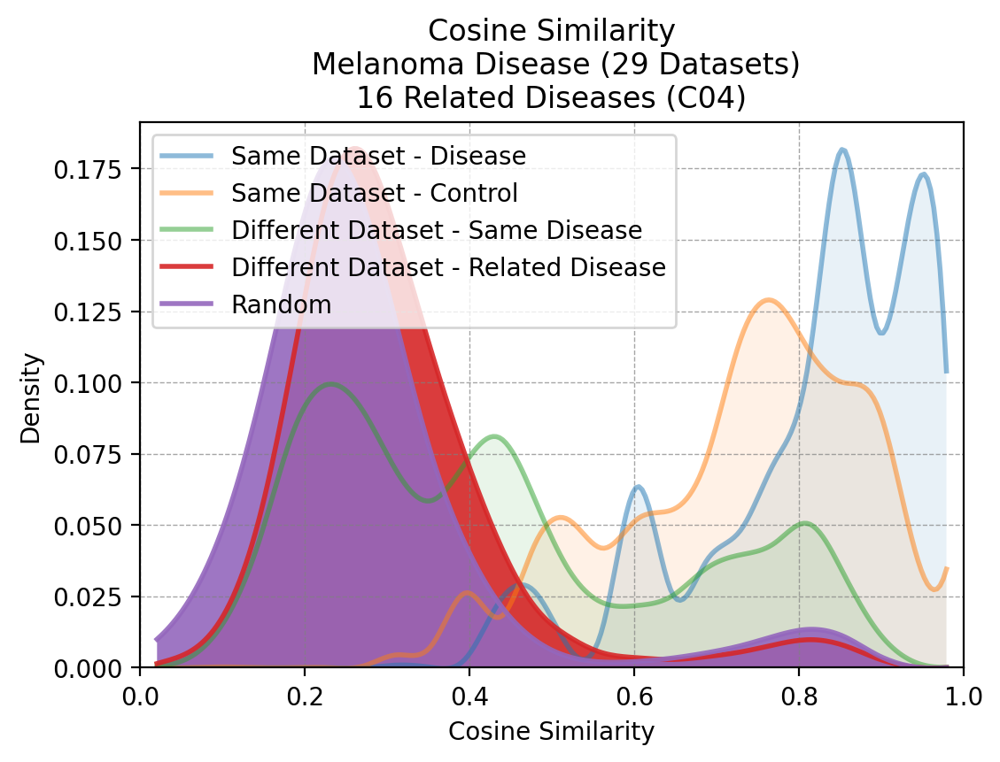

 56%|█████▋    | 9/16 [00:23<00:12,  1.78s/it]

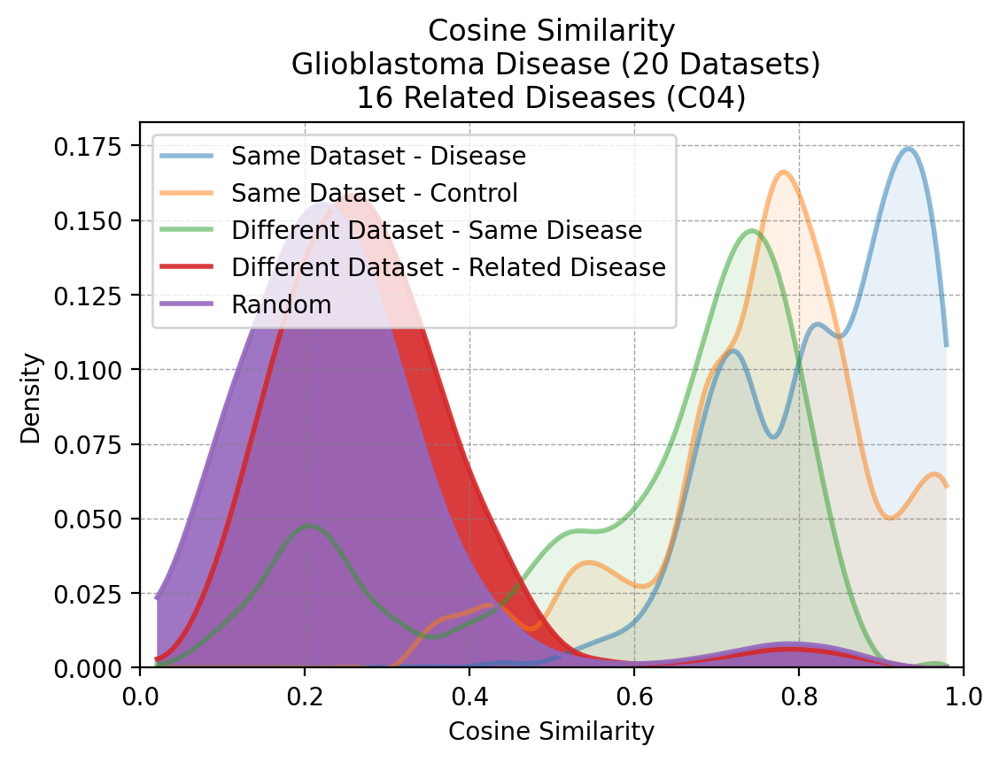

 62%|██████▎   | 10/16 [00:25<00:10,  1.70s/it]

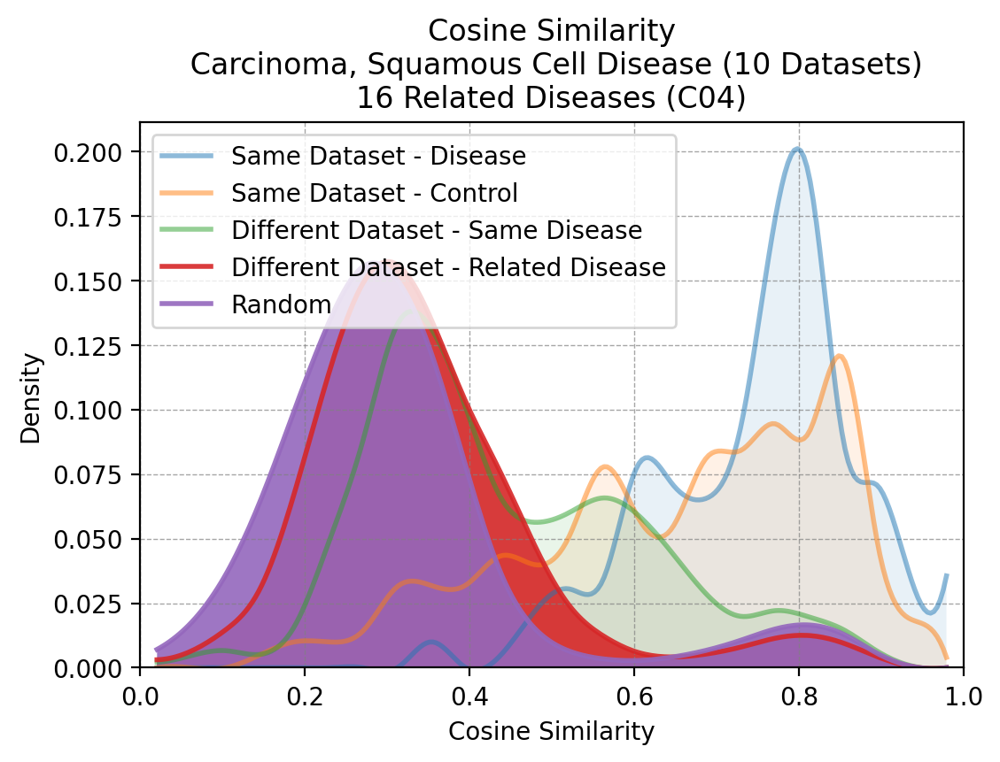

 69%|██████▉   | 11/16 [00:25<00:06,  1.34s/it]

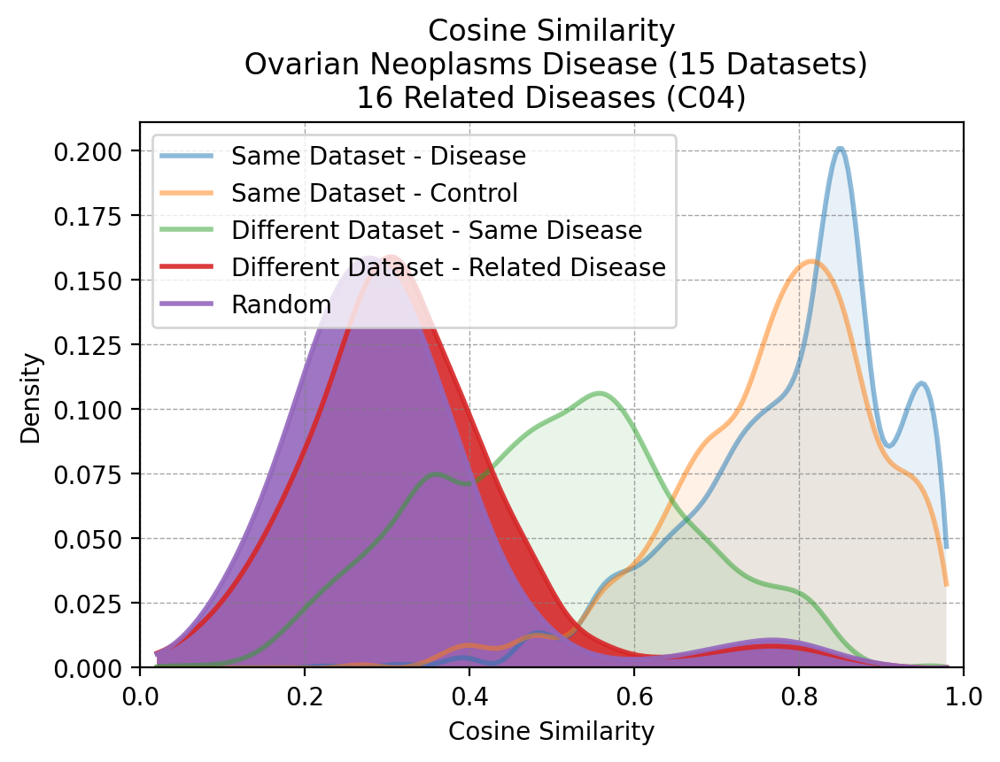

 75%|███████▌  | 12/16 [00:26<00:05,  1.36s/it]

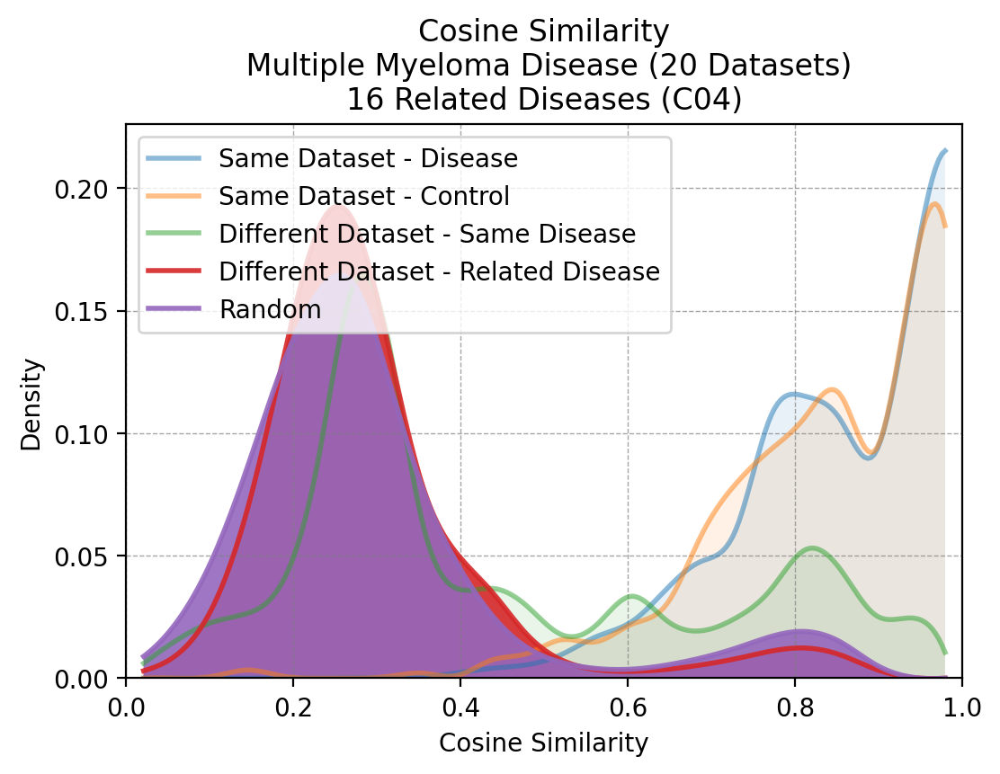

 81%|████████▏ | 13/16 [00:28<00:04,  1.55s/it]

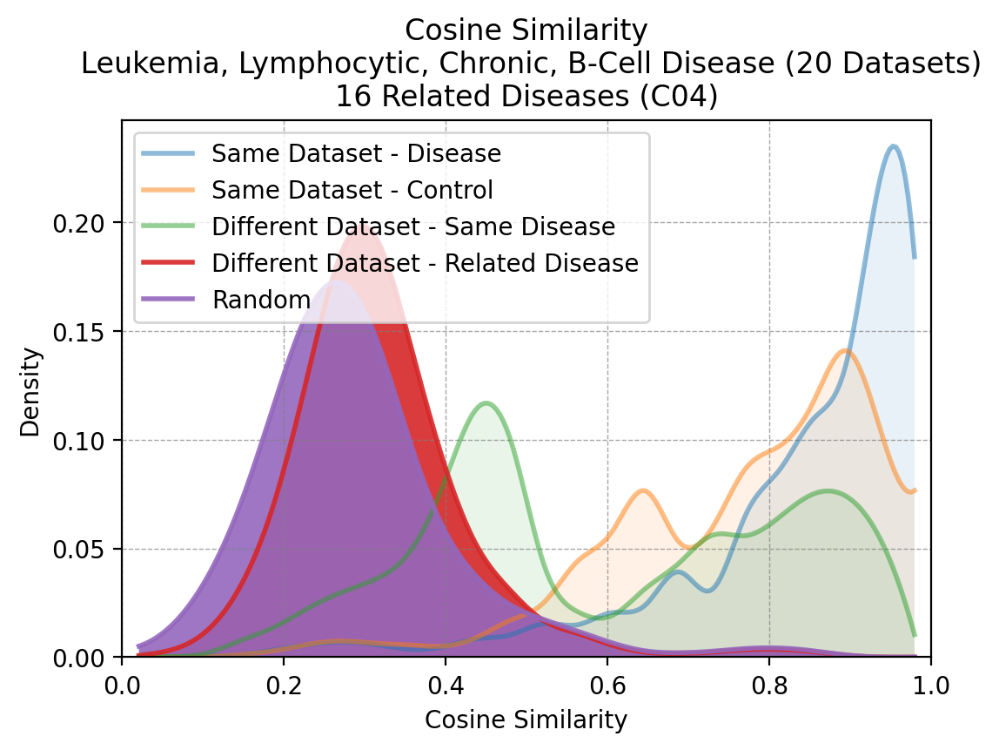

 88%|████████▊ | 14/16 [00:31<00:03,  1.78s/it]

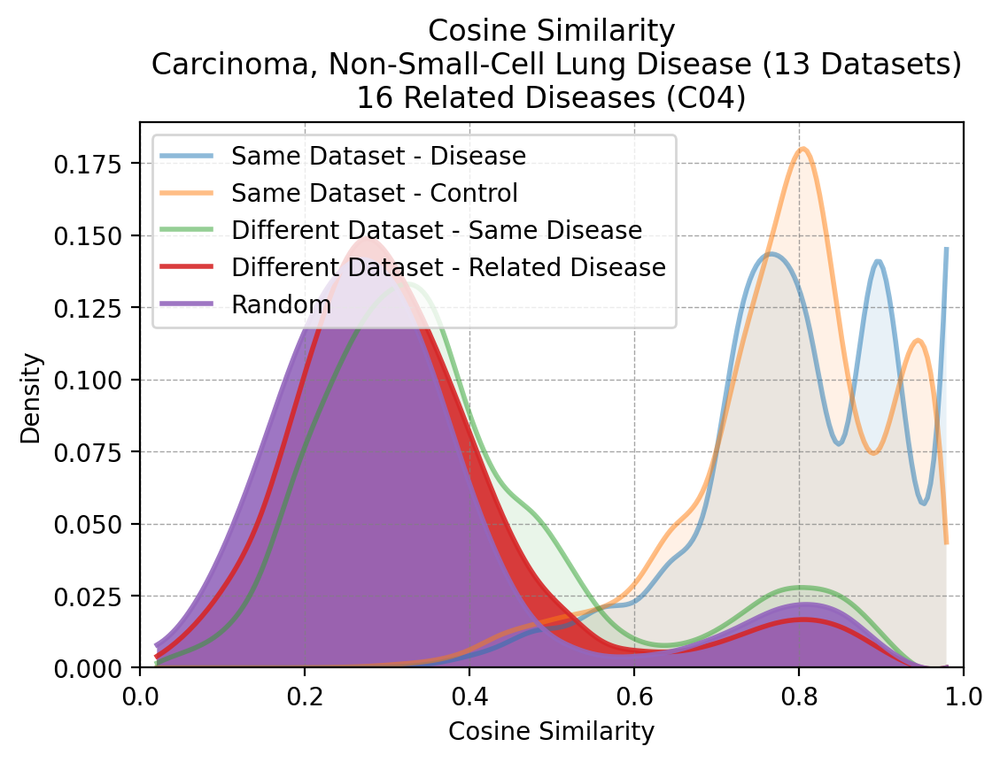

 94%|█████████▍| 15/16 [00:33<00:02,  2.01s/it]

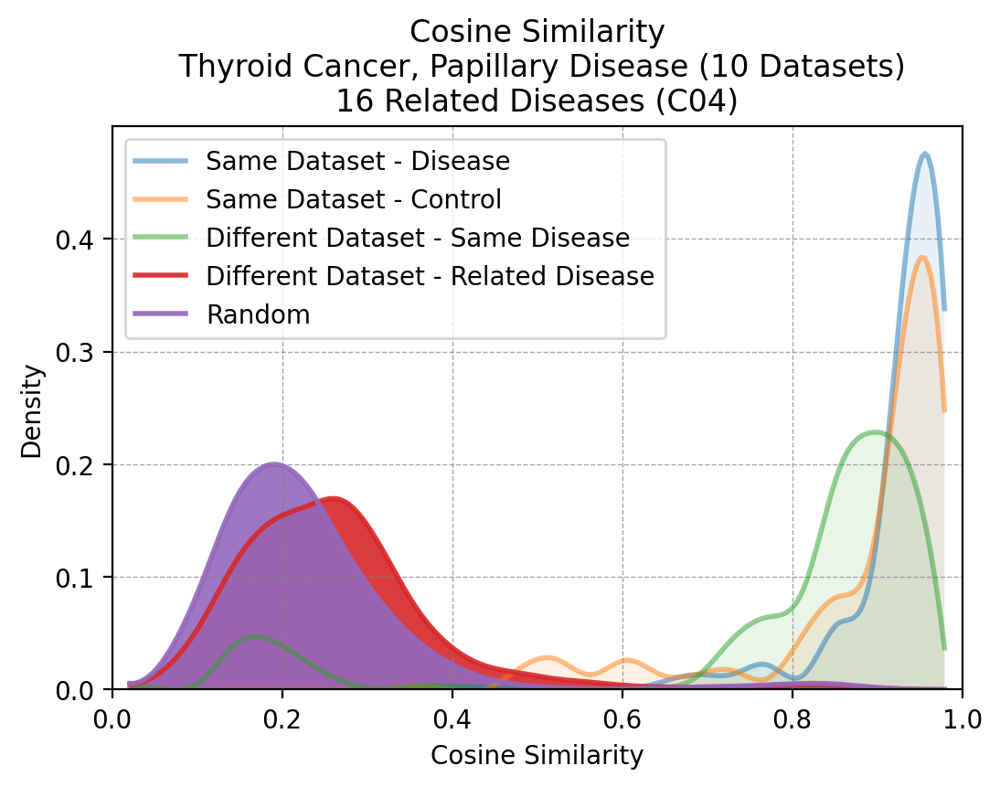

100%|██████████| 16/16 [00:34<00:00,  2.17s/it]


In [21]:
# fuxed bins
fixed_bins = {
    "Cosine Similarity": np.linspace(0, 1, 25),
    # "Euclidean Distance": np.linspace(0, np.nanmax(matrix), 100),
    "Pearson Correlation": np.linspace(-1, 1, 100),
}

# lists to store normalized counts
same_dis_dt_normalized = list()
control_normalized = list()
same_dis_normalized = list()
related_dis_normalized = list()
# unrelated_normalized = list()
other_normalized = list()


# loop through disease
mesh_id_2_name = dict(zip(df_obs["mesh_id"], df_obs["mesh_disease"]))

# loop through diseases
for i in tqdm(range(len(same_dis_dt))):
    # values for each dataset iteration i
    same_dis_dt_v_i = list()
    control_v_i = list()
    same_dis_v_i = list()
    related_dis_v_i = list()
    # unrelated_v_i = list()
    other_v_i = list()

    n_datasets = 0

    # loop through dataset
    for j in range(len(same_dis_dt[i])):
        same_dis_dt_ij = same_dis_dt[i][j]
        control_ij = control[i][j]
        same_dis_ij = same_dis[i][j]
        related_dis_ij = related_dis[i][j]
        # unrelated_ij = unrelated[i][j]
        other_ij = other[i][j]

        # don't retrieve data if no data for all categories
        if (
            (len(same_dis_dt_ij) == 0)
            or (len(control_ij) == 0)
            or (len(related_dis_ij) == 0)
            or (len(same_dis_ij) == 0)
            or (len(other_ij) == 0)
        ):
            continue

        # get values
        same_dis_dt_v_i.append(matrix[same_dis_dt_ij[:, 0], same_dis_dt_ij[:, 1]])
        control_v_i.append(matrix[control_ij[:, 0], control_ij[:, 1]])
        same_dis_v_i.append(matrix[same_dis_ij[:, 0], same_dis_ij[:, 1]])
        related_dis_v_i.append(matrix[related_dis_ij[:, 0], related_dis_ij[:, 1]])
        # unrelated_v_i.append(matrix[unrelated_ij[:, 0], unrelated_ij[:, 1]])
        other_v_i.append(matrix[other_ij[:, 0], other_ij[:, 1]])

        n_datasets += 1

    # don't append if no data for all categories
    if (
        (len(same_dis_dt_v_i) == 0)
        or (len(control_v_i) == 0)
        or (len(same_dis_v_i) == 0)
        or (len(related_dis_v_i) == 0)
        or (len(other_v_i) == 0)
    ):
        continue

    # normalize counts for diseases within a dataset
    same_dis_dt_normalized = normalize_counts_with_bins(
        same_dis_dt_v_i, fixed_bins.get(metric_i)
    )

    control_normalized = normalize_counts_with_bins(
        control_v_i, fixed_bins.get(metric_i)
    )

    same_dis_normalized = normalize_counts_with_bins(
        same_dis_v_i, fixed_bins.get(metric_i)
    )

    related_dis_normalized = normalize_counts_with_bins(
        related_dis_v_i, fixed_bins.get(metric_i)
    )

    # unrelated_normalized.append(
    #     normalize_counts_with_bins(unrelated_v_i, fixed_bins.get(metric_i))
    # )
    other_normalized = normalize_counts_with_bins(other_v_i, fixed_bins.get(metric_i))

    # # aggregate counts
    # same_dis_dt_normalized = np.array(same_dis_dt_normalized).sum(axis=0) / len(
    #     same_dis_dt_normalized
    # )
    # control_normalized = np.array(control_normalized).sum(axis=0) / len(
    #     control_normalized
    # )
    # same_dis_normalized = np.array(same_dis_normalized).sum(axis=0) / len(
    #     same_dis_normalized
    # )
    # related_dis_normalized = np.array(related_dis_normalized).sum(axis=0) / len(
    #     related_dis_normalized
    # )
    # # unrelated_normalized = np.array(unrelated_normalized).sum(axis=0) / len(
    # #     unrelated_normalized
    # # )
    # other_normalized = np.array(other_normalized).sum(axis=0) / len(other_normalized)

    labels_diseases.append(all_diseases[i])

    labels_plot = [
        "Same Dataset - Disease",
        "Same Dataset - Control",
        "Different Dataset - Same Disease",
        "Different Dataset - Related Disease",
        "Random",
    ]

    all_normalized = [
        same_dis_dt_normalized,
        control_normalized,
        same_dis_normalized,
        related_dis_normalized,
        other_normalized,
    ]

    title = f"{metric_i}\n {mesh_id_2_name.get(mesh_ids[i])} Disease ({n_datasets} Datasets)\n{len(mesh_ids)} Related Diseases ({root_id[0]})"

    plot_smoothed_line_through_histogram(
        all_normalized, fixed_bins.get(metric_i), labels_plot, title
    )

  0%|          | 0/16 [00:00<?, ?it/s]

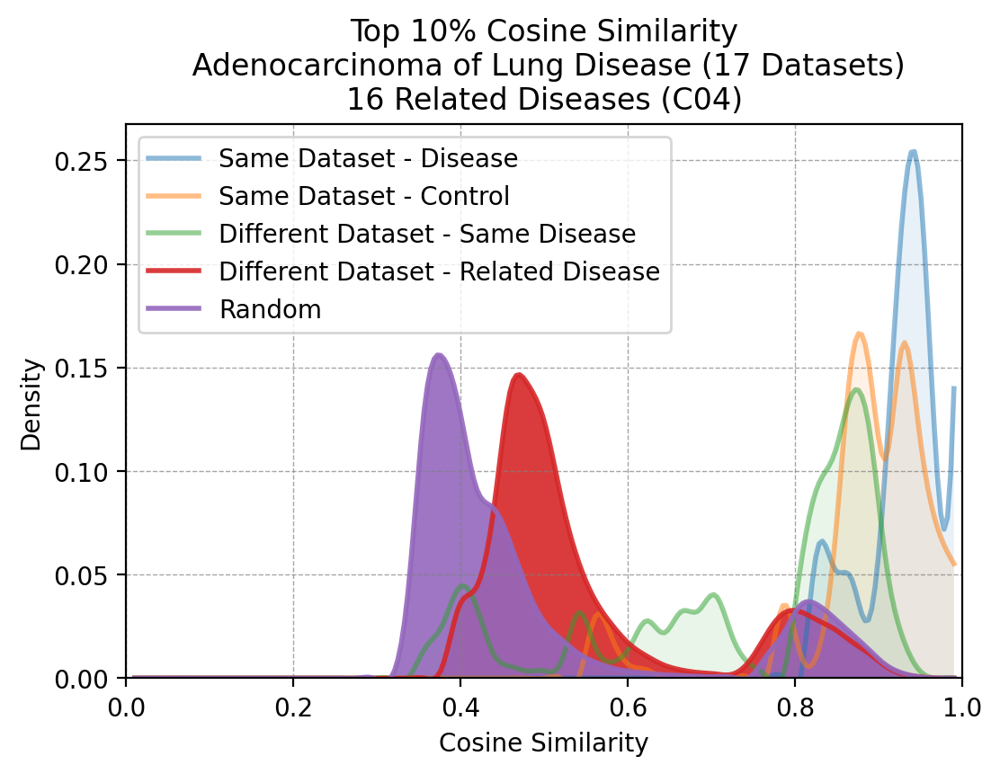

  6%|▋         | 1/16 [00:02<00:31,  2.07s/it]

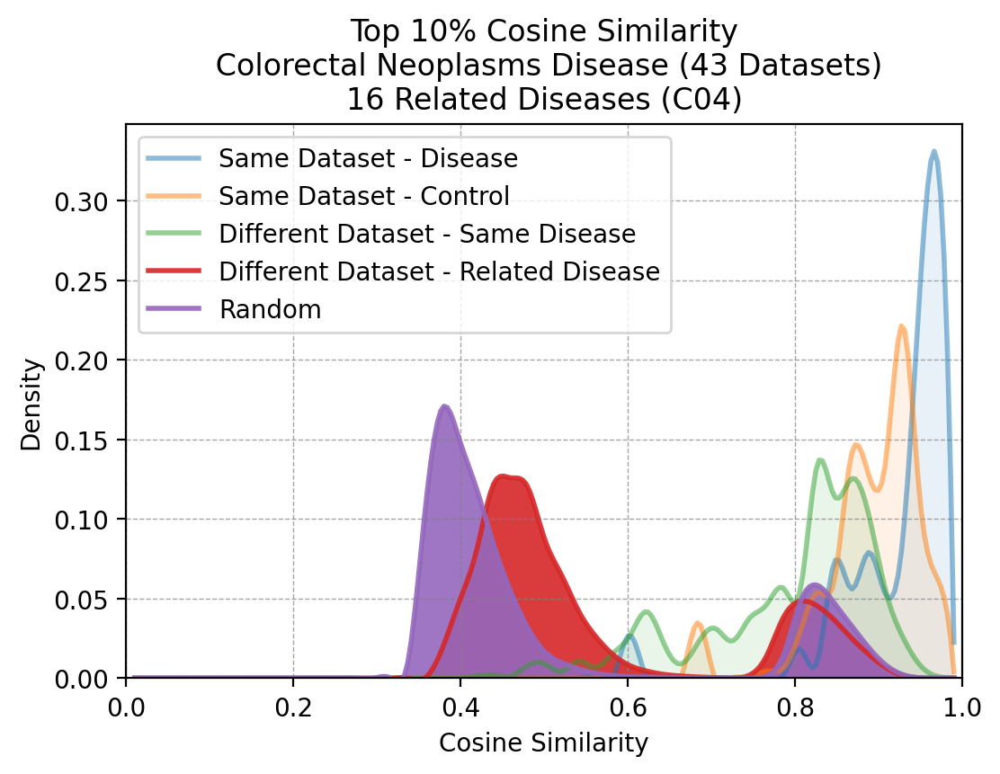

 12%|█▎        | 2/16 [00:04<00:35,  2.51s/it]

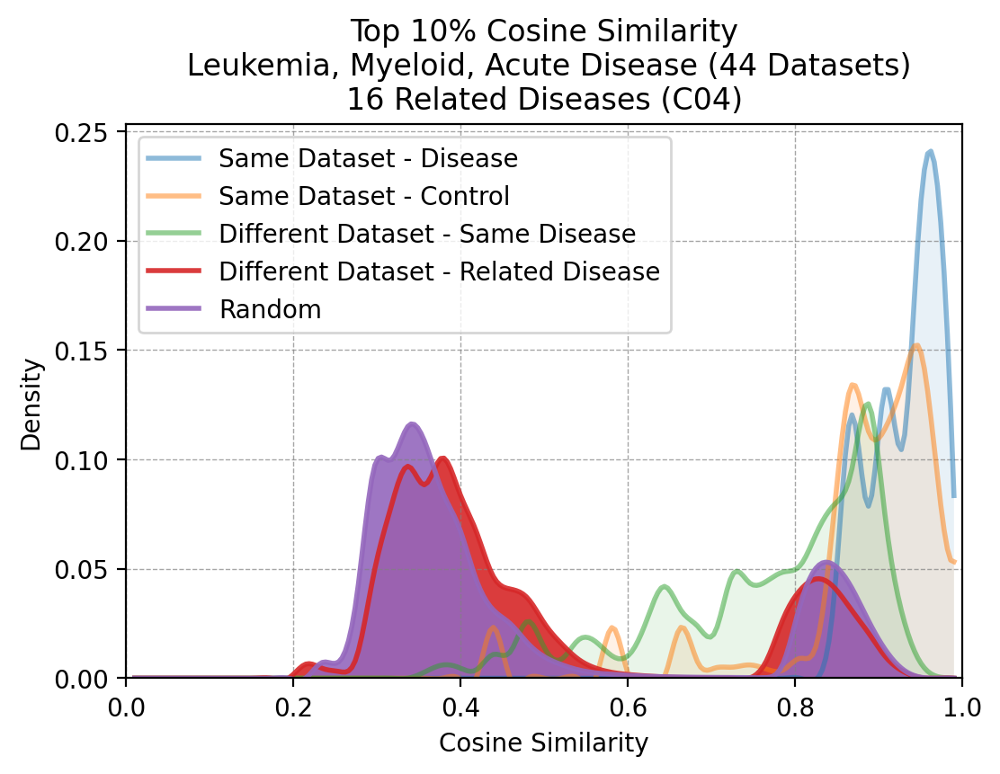

 19%|█▉        | 3/16 [00:07<00:31,  2.43s/it]

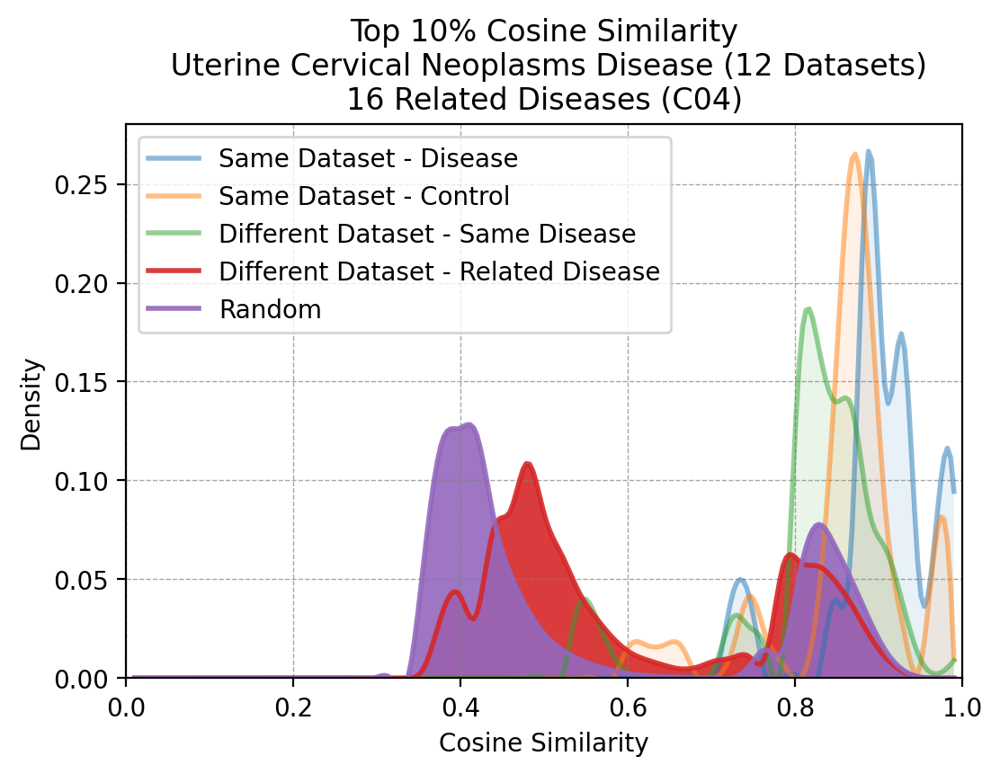

 25%|██▌       | 4/16 [00:07<00:21,  1.75s/it]

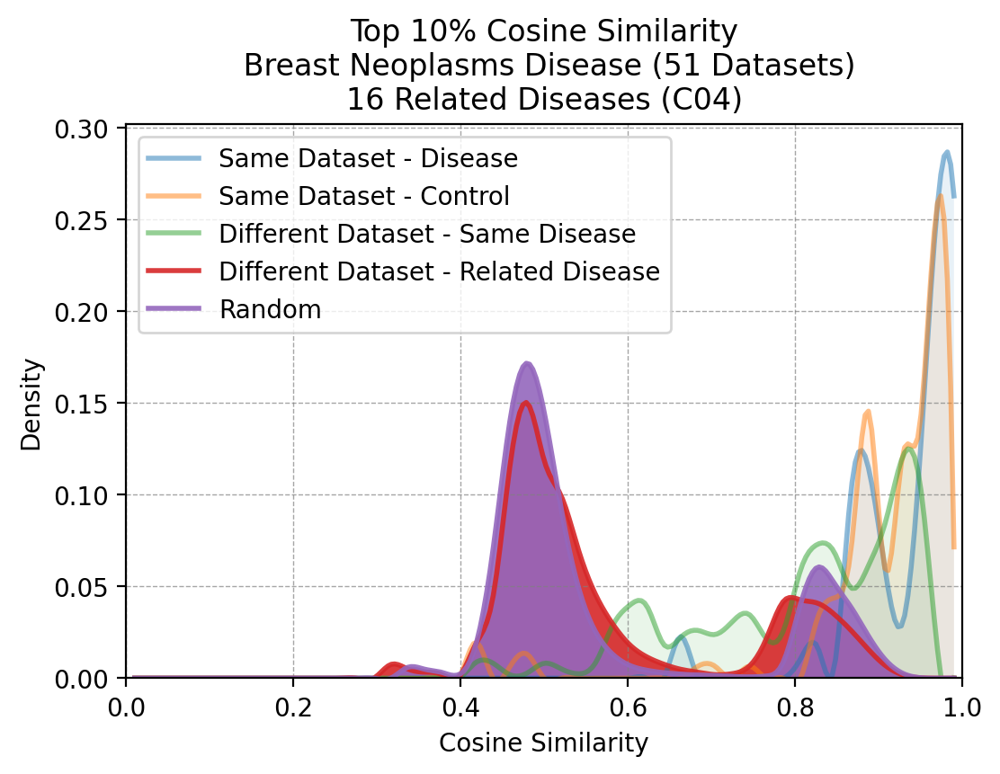

 31%|███▏      | 5/16 [00:11<00:26,  2.41s/it]

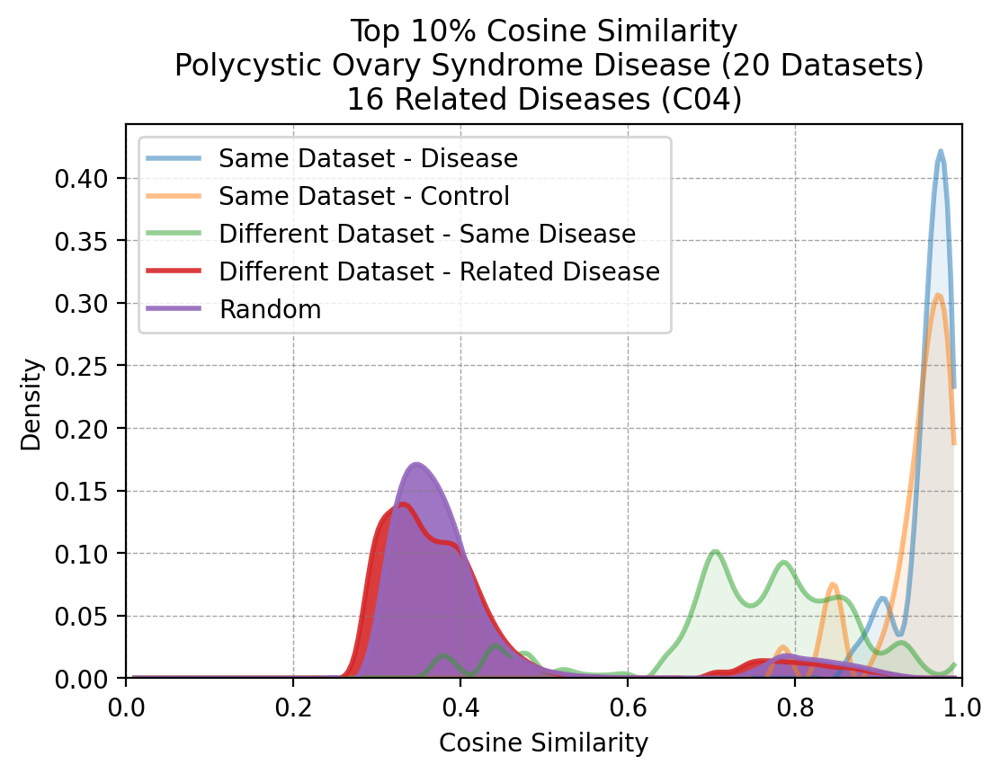

 38%|███▊      | 6/16 [00:11<00:17,  1.73s/it]

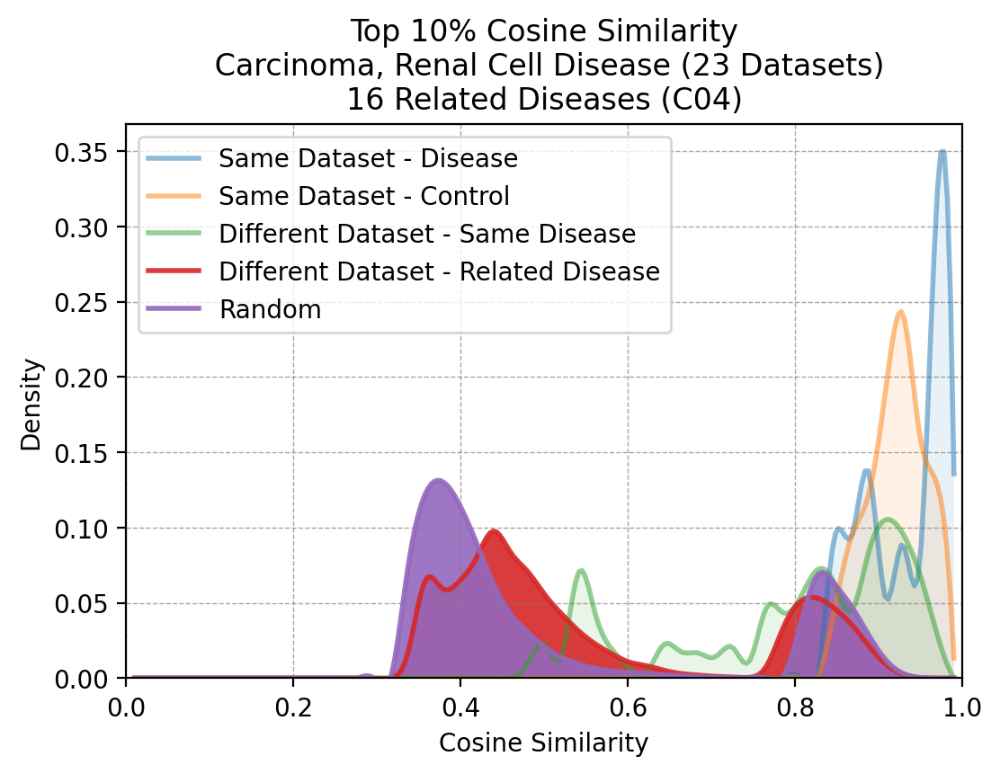

 44%|████▍     | 7/16 [00:12<00:12,  1.44s/it]

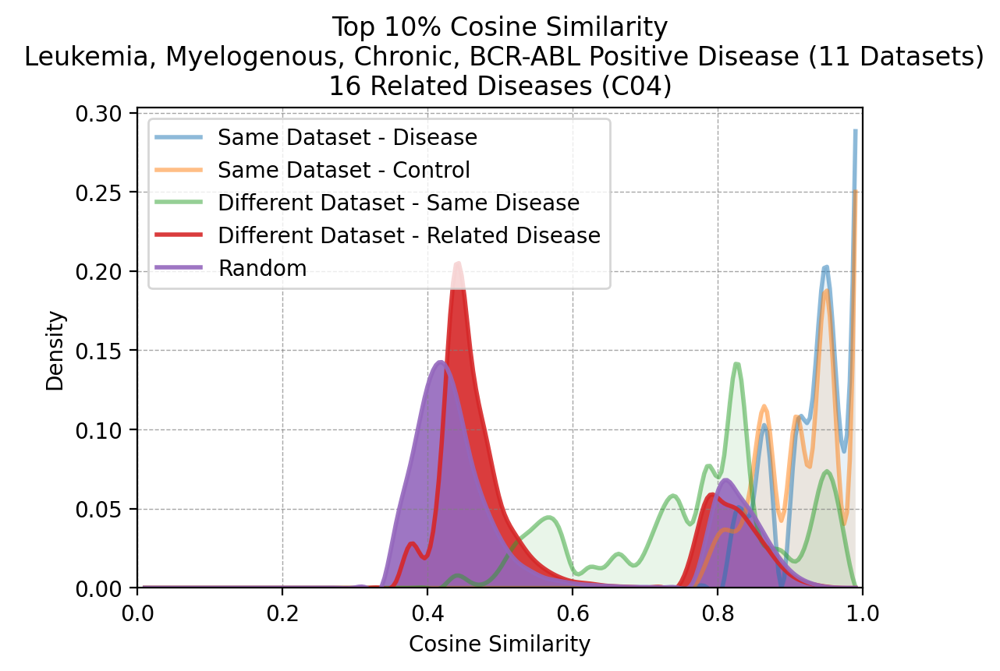

 50%|█████     | 8/16 [00:13<00:08,  1.10s/it]

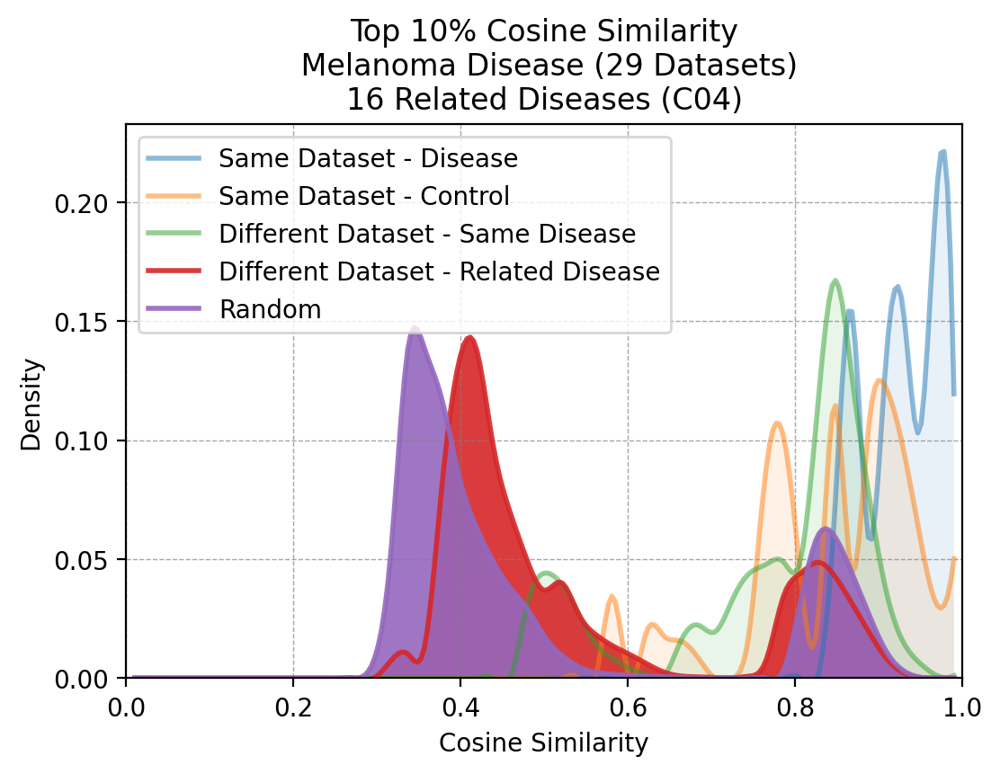

 56%|█████▋    | 9/16 [00:14<00:07,  1.07s/it]

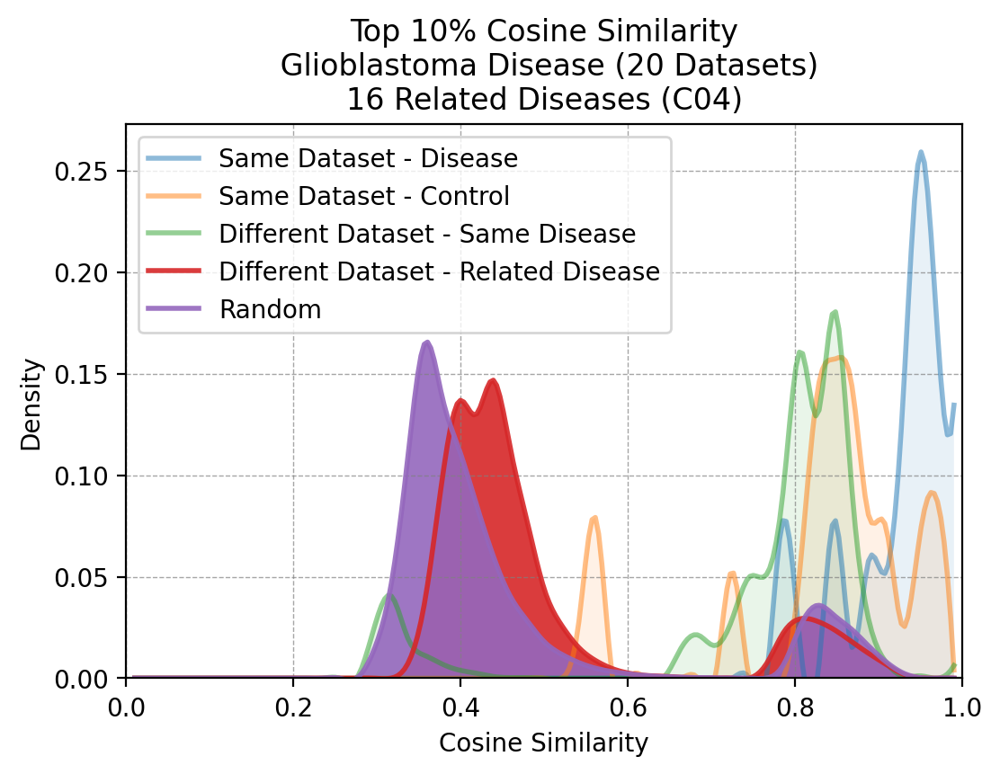

 62%|██████▎   | 10/16 [00:15<00:06,  1.01s/it]

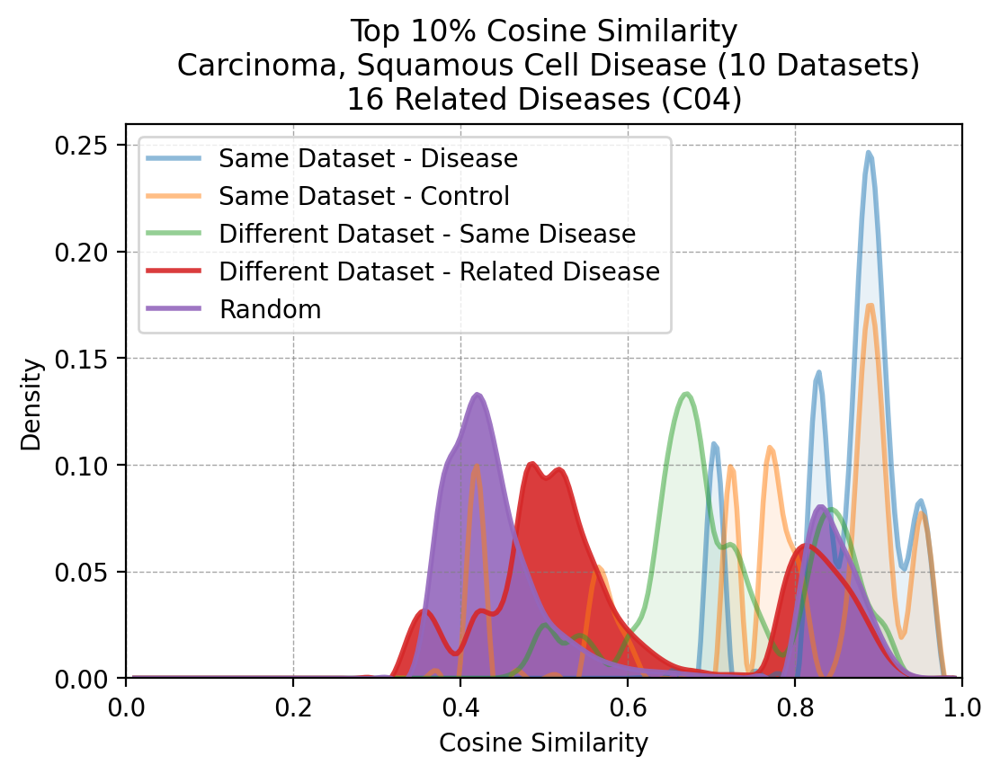

 69%|██████▉   | 11/16 [00:15<00:04,  1.24it/s]

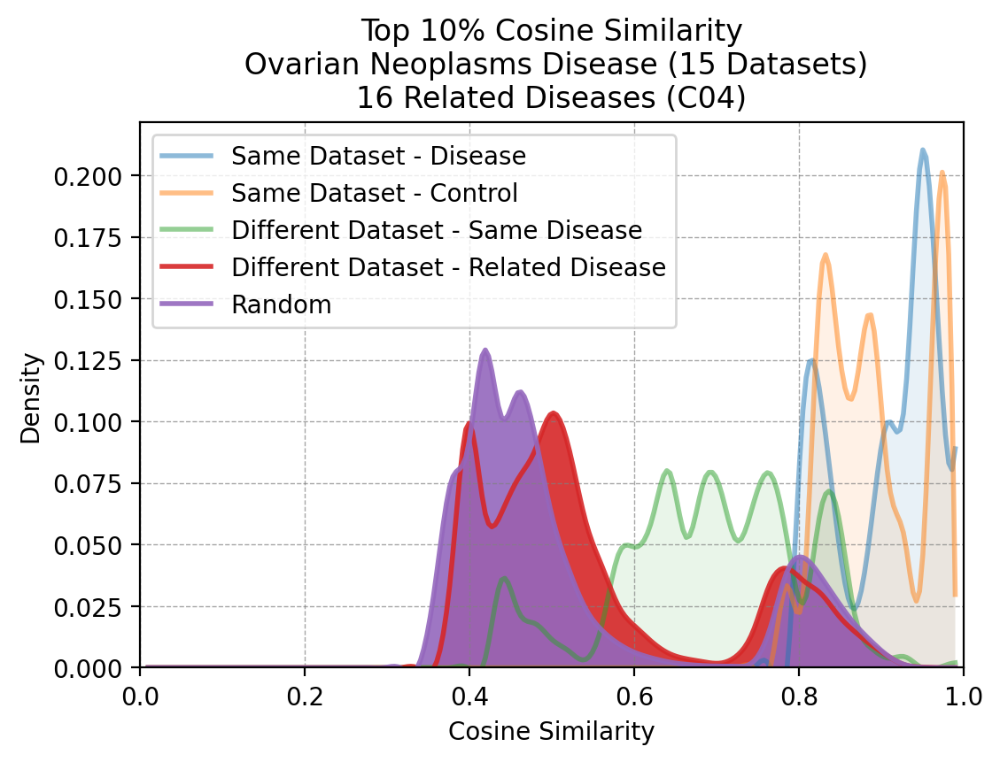

 75%|███████▌  | 12/16 [00:16<00:03,  1.23it/s]

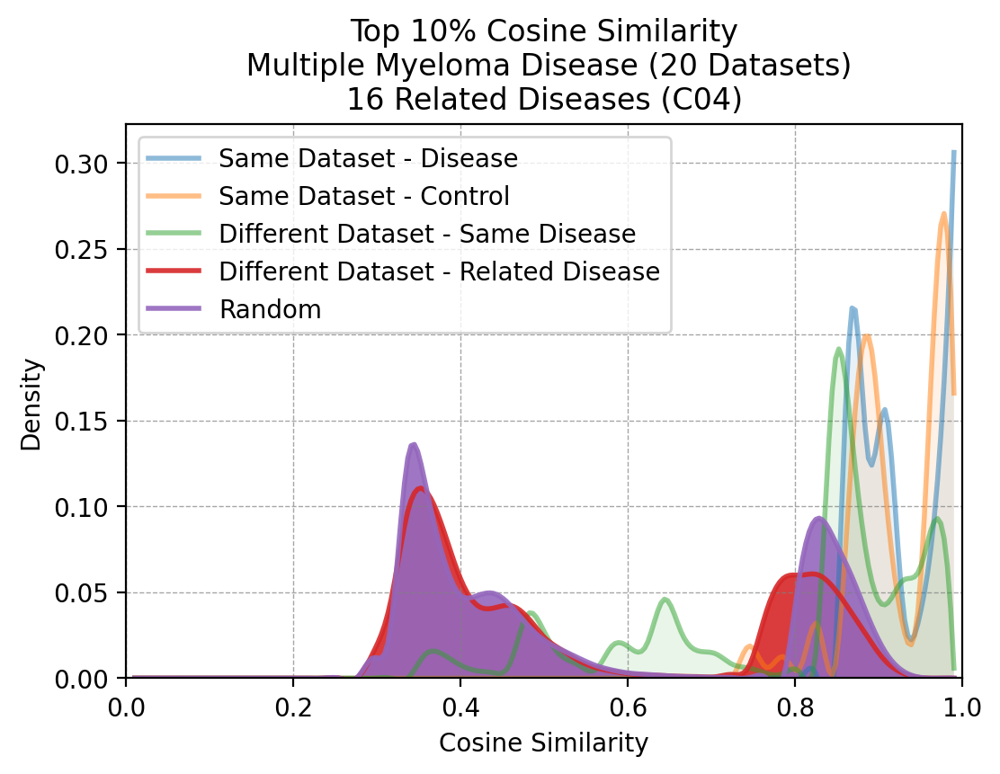

 81%|████████▏ | 13/16 [00:17<00:02,  1.10it/s]

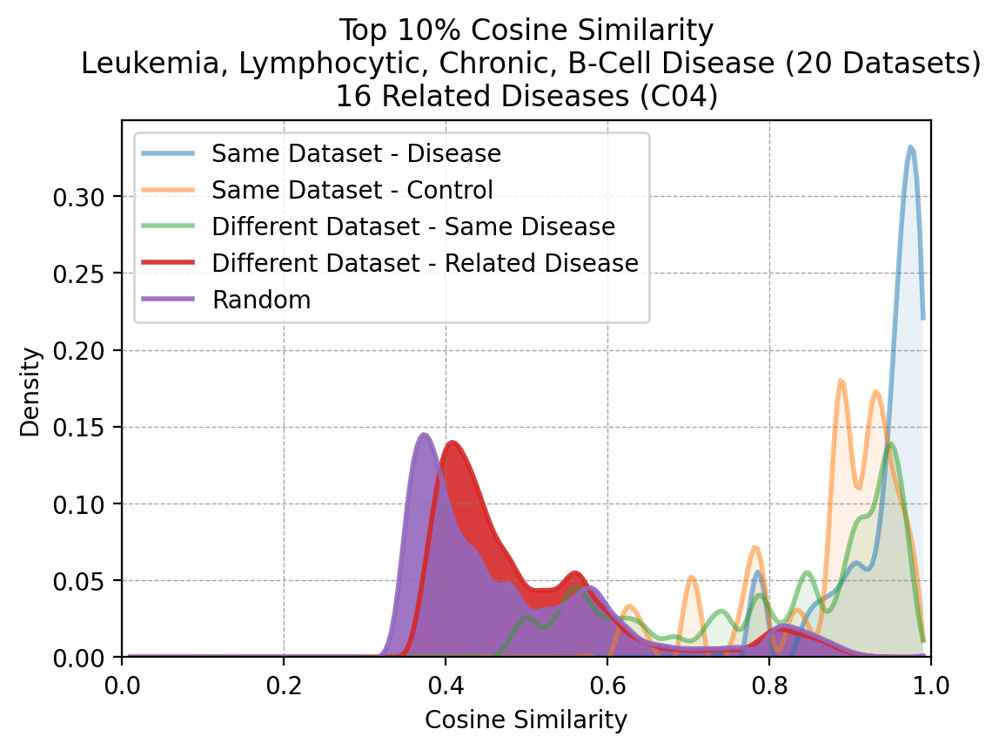

 88%|████████▊ | 14/16 [00:18<00:02,  1.05s/it]

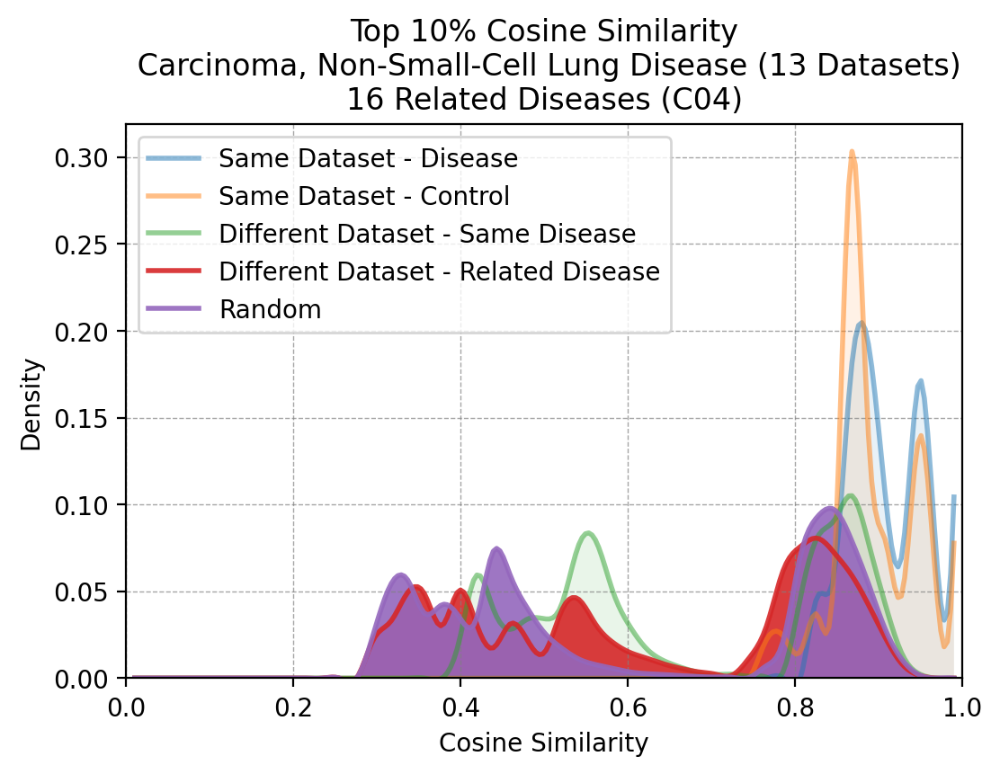

 94%|█████████▍| 15/16 [00:20<00:01,  1.18s/it]

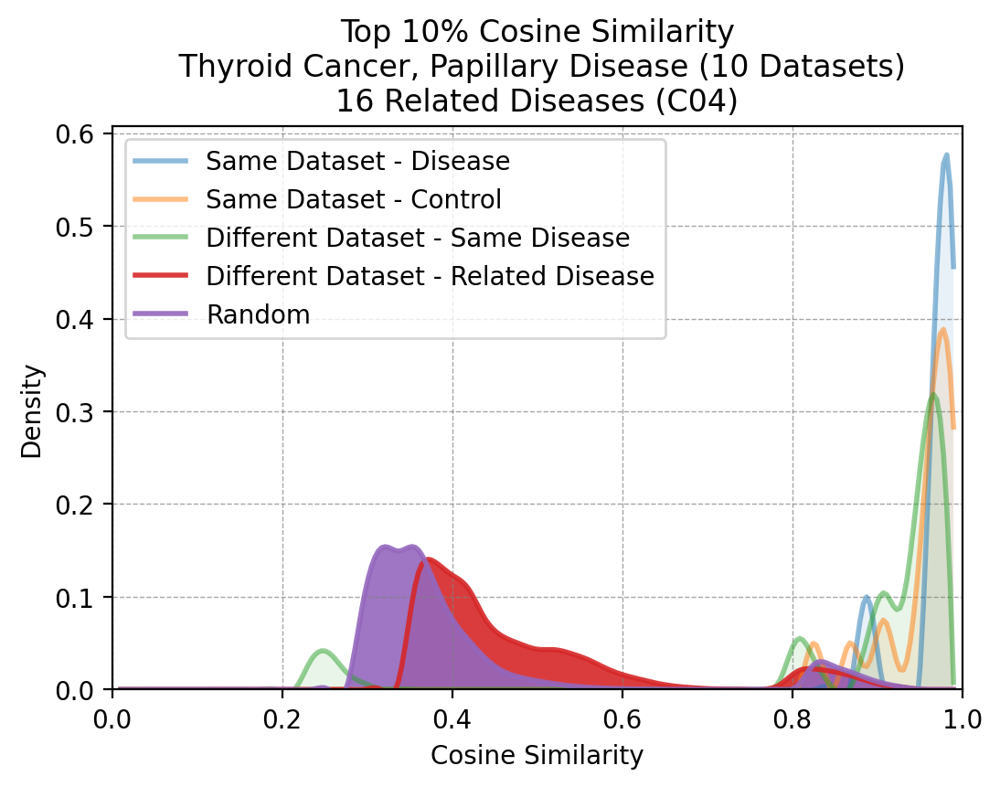

100%|██████████| 16/16 [00:20<00:00,  1.30s/it]


In [22]:
thr_pct = 90

# fuxed bins
fixed_bins = {
    "Cosine Similarity": np.linspace(0, 1, 50),
    # "Euclidean Distance": np.linspace(0, np.nanmax(matrix), 100),
    "Pearson Correlation": np.linspace(-1, 1, 100),
}

# lists to store normalized counts
same_dis_dt_normalized = list()
control_normalized = list()
same_dis_normalized = list()
related_dis_normalized = list()
# unrelated_normalized = list()
other_normalized = list()


# loop through disease
mesh_id_2_name = dict(zip(df_obs["mesh_id"], df_obs["mesh_disease"]))

# loop through diseases
for i in tqdm(range(len(same_dis_dt))):
    # values for each dataset iteration i
    same_dis_dt_v_i = list()
    control_v_i = list()
    same_dis_v_i = list()
    related_dis_v_i = list()
    # unrelated_v_i = list()
    other_v_i = list()

    n_datasets = 0

    # loop through dataset
    for j in range(len(same_dis_dt[i])):
        same_dis_dt_ij = same_dis_dt[i][j]
        control_ij = control[i][j]
        same_dis_ij = same_dis[i][j]
        related_dis_ij = related_dis[i][j]
        # unrelated_ij = unrelated[i][j]
        other_ij = other[i][j]

        # don't retrieve data if no data for all categories
        if (
            (len(same_dis_dt_ij) == 0)
            or (len(control_ij) == 0)
            or (len(related_dis_ij) == 0)
            or (len(same_dis_ij) == 0)
            or (len(other_ij) == 0)
        ):
            continue

        # get values
        same_dis_dt_v_i.append(
            get_top_x_values(
                matrix[same_dis_dt_ij[:, 0], same_dis_dt_ij[:, 1]], thr_pct
            )
        )
        control_v_i.append(
            get_top_x_values(matrix[control_ij[:, 0], control_ij[:, 1]], thr_pct)
        )
        same_dis_v_i.append(
            get_top_x_values(matrix[same_dis_ij[:, 0], same_dis_ij[:, 1]], thr_pct)
        )
        related_dis_v_i.append(
            get_top_x_values(
                matrix[related_dis_ij[:, 0], related_dis_ij[:, 1]], thr_pct
            )
        )
        # unrelated_v_i.append(matrix[unrelated_ij[:, 0], unrelated_ij[:, 1]])
        other_v_i.append(
            get_top_x_values(matrix[other_ij[:, 0], other_ij[:, 1]], thr_pct)
        )

        n_datasets += 1

    # don't append if no data for all categories
    if (
        (len(same_dis_dt_v_i) == 0)
        or (len(control_v_i) == 0)
        or (len(same_dis_v_i) == 0)
        or (len(related_dis_v_i) == 0)
        or (len(other_v_i) == 0)
    ):
        continue

    # normalize counts for diseases within a dataset
    same_dis_dt_normalized = normalize_counts_with_bins(
        same_dis_dt_v_i, fixed_bins.get(metric_i)
    )

    control_normalized = normalize_counts_with_bins(
        control_v_i, fixed_bins.get(metric_i)
    )

    same_dis_normalized = normalize_counts_with_bins(
        same_dis_v_i, fixed_bins.get(metric_i)
    )

    related_dis_normalized = normalize_counts_with_bins(
        related_dis_v_i, fixed_bins.get(metric_i)
    )

    # unrelated_normalized.append(
    #     normalize_counts_with_bins(unrelated_v_i, fixed_bins.get(metric_i))
    # )
    other_normalized = normalize_counts_with_bins(other_v_i, fixed_bins.get(metric_i))

    # # aggregate counts
    # same_dis_dt_normalized = np.array(same_dis_dt_normalized).sum(axis=0) / len(
    #     same_dis_dt_normalized
    # )
    # control_normalized = np.array(control_normalized).sum(axis=0) / len(
    #     control_normalized
    # )
    # same_dis_normalized = np.array(same_dis_normalized).sum(axis=0) / len(
    #     same_dis_normalized
    # )
    # related_dis_normalized = np.array(related_dis_normalized).sum(axis=0) / len(
    #     related_dis_normalized
    # )
    # # unrelated_normalized = np.array(unrelated_normalized).sum(axis=0) / len(
    # #     unrelated_normalized
    # # )
    # other_normalized = np.array(other_normalized).sum(axis=0) / len(other_normalized)

    labels_diseases.append(all_diseases[i])

    labels_plot = [
        "Same Dataset - Disease",
        "Same Dataset - Control",
        "Different Dataset - Same Disease",
        "Different Dataset - Related Disease",
        "Random",
    ]

    all_normalized = [
        same_dis_dt_normalized,
        control_normalized,
        same_dis_normalized,
        related_dis_normalized,
        other_normalized,
    ]

    title = f"Top {100-thr_pct}% {metric_i}\n {mesh_id_2_name.get(mesh_ids[i])} Disease ({n_datasets} Datasets)\n{len(mesh_ids)} Related Diseases ({root_id[0]})"

    plot_smoothed_line_through_histogram(
        all_normalized, fixed_bins.get(metric_i), labels_plot, title
    )

100%|██████████| 16/16 [00:33<00:00,  2.07s/it]


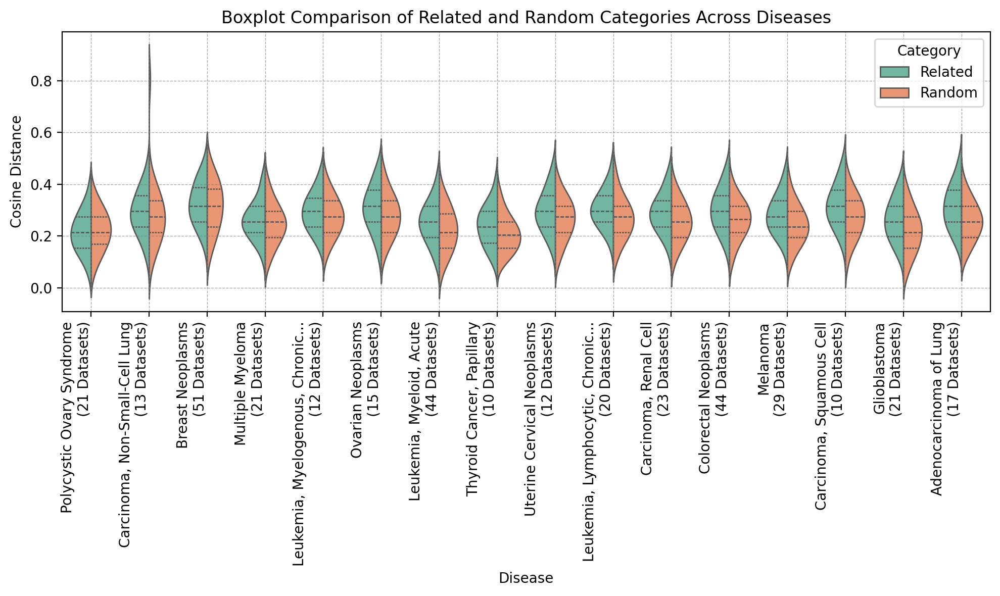

In [23]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm

# Fixed bins for normalization
fixed_bins = {
    "Cosine Similarity": np.linspace(0, 1, 50),
    "Pearson Correlation": np.linspace(-1, 1, 100),
}


# Function for normalizing counts into density
def normalize_counts_with_bins(values_list, fixed_bins):
    """Normalize values into a density distribution using histogram bins."""
    normalized_distributions = []
    for values in values_list:
        if len(values) == 0:  # Skip empty arrays
            continue

        # Compute histogram counts and normalize
        counts, _ = np.histogram(values, bins=fixed_bins)
        counts = counts / np.sum(counts)  # Normalize counts to sum to 1 (density)

        normalized_distributions.append(counts)

    # Combine normalized distributions
    if normalized_distributions:
        combined_normalized = np.sum(normalized_distributions, axis=0)
        combined_normalized = combined_normalized / np.sum(combined_normalized)
    else:
        combined_normalized = np.zeros(len(fixed_bins) - 1)

    return combined_normalized


# Lists to store normalized counts
related_dis_normalized = []
other_normalized = []

# Loop through diseases
mesh_id_2_name = dict(zip(df_obs["mesh_id"], df_obs["mesh_disease"]))

n_datasets = list()
for i in tqdm(range(len(related_dis))):
    related_dis_v_i = []
    other_v_i = []

    # Loop through datasets for the current disease
    for j in range(len(related_dis[i])):
        related_dis_ij = related_dis[i][j]
        other_ij = other[i][j]

        # Skip if any category has no data
        if len(related_dis_ij) == 0 or len(other_ij) == 0:
            continue

        # Retrieve values from the distance matrix
        related_dis_v_i.append(matrix[related_dis_ij[:, 0], related_dis_ij[:, 1]])
        other_v_i.append(matrix[other_ij[:, 0], other_ij[:, 1]])

    # Normalize counts for each category
    related_dis_normalized.append(
        normalize_counts_with_bins(related_dis_v_i, fixed_bins["Cosine Similarity"])
    )
    other_normalized.append(
        normalize_counts_with_bins(other_v_i, fixed_bins["Cosine Similarity"])
    )
    n_datasets.append(len(related_dis_v_i))


# Create boxplot data
boxplot_data = []

# Bin centers
bin_centers = (
    fixed_bins["Cosine Similarity"][:-1] + fixed_bins["Cosine Similarity"][1:]
) / 2

for i in range(len(related_dis_normalized)):
    disease_name = mesh_id_2_name.get(mesh_ids[i], f"Disease {i+1}")
    disease_name = (
        (disease_name[:30] + "...") if len(disease_name) > 30 else disease_name
    )
    disease_name = f"{disease_name}\n({n_datasets[i]} Datasets)"

    # Convert normalized counts into representative values
    related_values = np.repeat(
        bin_centers, (related_dis_normalized[i] * 100).astype(int)
    )
    random_values = np.repeat(bin_centers, (other_normalized[i] * 100).astype(int))

    # Add data to boxplot dataset

    boxplot_data.extend(
        [
            {"Disease": disease_name, "Category": "Random", "Value": val}
            for val in random_values
        ]
    )

    boxplot_data.extend(
        [
            {"Disease": disease_name, "Category": "Related", "Value": val}
            for val in related_values
        ]
    )

# Convert to a DataFrame
df_boxplot = pd.DataFrame(boxplot_data)


# Compute the mean for each disease and category
means = df_boxplot.groupby(["Disease", "Category"])["Value"].mean().unstack()

# Calculate the difference between the means for "Random" and "Related"
means["Difference"] = means["Related"] - means["Random"]

# Sort the diseases by the difference
sorted_means = means.sort_values("Difference")
sorted_diseases = sorted_means.index.tolist()  # Get the sorted disease names

# Apply this sorted order to the DataFrame
df_boxplot["Disease"] = pd.Categorical(
    df_boxplot["Disease"], categories=sorted_diseases, ordered=True
)
df_boxplot = df_boxplot.sort_values("Disease")


# Plot the boxplot
plt.figure(figsize=(10, 6), dpi=200)
sns.violinplot(
    data=df_boxplot,
    x="Disease",
    y="Value",
    hue="Category",
    palette="Set2",
    # palette=["#2779ffff", "#022778ff"],
    split=True,
    inner="quartile",
    linewidth=1,
)

# add grid
plt.grid(True, color="gray", linestyle="--", linewidth=0.5, alpha=0.7)

# Overriding the color of quartile lines
# for artist in plt.gca().findobj(plt.Line2D):
#     artist.set_color("white")

plt.title("Boxplot Comparison of Related and Random Categories Across Diseases")
plt.xlabel("Disease")
plt.ylabel("Cosine Distance")
plt.xticks(rotation=90, ha="right")
plt.legend(title="Category")
plt.tight_layout()
plt.show()

## Plot distances control vs. disease in raw vs embedding space

In [24]:
def get_relationship(
    mesh_id: str, tissue: str, df_obs: pd.DataFrame, mesh_id_2_tree_terms: dict
) -> List:
    """Get Relationship between two diseases
    Args:
        - mesh_id (str): MeSH ID
        - df_obs (pd.DataFrame): DataFrame with disease information
        - mesh_id_2_tree_terms (dict): Mapping of MeSH ID to Tree Terms
    Returns:
        - relationship (List): List of relationships
    """

    # get root tree terms
    tree_term = shorten_terms(mesh_id_2_tree_terms[mesh_id])

    # clean terms
    tree_term = [x for x in tree_term if x.startswith("C")]

    relationship = list()

    for i, row in df_obs.iterrows():
        disease_i = row["disease"]
        mesh_id_i = row["mesh_id"]
        tree_term_i = shorten_terms(mesh_id_2_tree_terms[mesh_id_i])

        # clean terms
        tree_term_i = [x for x in tree_term_i if x.startswith("C")]

        # check if same disease
        condition_1 = mesh_id == mesh_id_i

        # check if control
        condition_2 = disease_i == "Control"

        # check if related
        condition_3 = len(set(tree_term).intersection(set(tree_term_i))) > 0

        # check if

        # Same Disease
        if condition_1 and not condition_2:
            relationship.append("same disease")

        # Control for same Disease
        elif condition_1 and condition_2:
            relationship.append("control")

        # Related Disease
        elif condition_3 and not condition_2:
            relationship.append("related disease")

        else:
            relationship.append("other")

    return relationship

In [25]:
same_dis_dt = list()
control = list()
same_dis = list()
other = list()
# Loop through datasets w/ unrelated diseases
mesh_ids = list(df_obs["mesh_id"].unique())

mesh_ids = random.sample(mesh_ids, 15)
for mesh_i in tqdm(mesh_ids):
    QUERY = f"mesh_id == '{mesh_i}'"
    df_query = df_obs.query(QUERY)

    same_dis_dt_i = list()
    control_i = list()
    same_dis_i = list()

    # define relationships knowing the disease
    df_obs["relationship"] = get_relationship(mesh_i, df_obs, mesh_id_2_tree_terms)

    sample_datasets = random.sample(
        list(df_query["dataset"].unique()), min(df_query["dataset"].nunique(), 10)
    )

    # Loop through diseases in dataset
    for dataset_j in sample_datasets:

        # get same disease indexes
        QUERY = "dataset == @dataset_j and relationship == 'same disease'"
        same_dis_dt_idxs = df_obs.query(QUERY).index.to_list()

        # get control indexes
        QUERY = "dataset == @dataset_j and relationship == 'control'"
        control_idxs = df_obs.query(QUERY).index.to_list()

        # get same disease indexes
        QUERY = "dataset != @dataset_j and relationship == 'same disease'"
        same_dis_idxs = df_obs.query(QUERY).index.to_list()

        # get other indexes
        QUERY = "dataset != @dataset_j and relationship == 'other'"
        other_idxs = df_obs.query(QUERY).index.to_list()

        # sample other indexes
        same_dis_dt_idxs = random.sample(
            same_dis_dt_idxs, min(len(same_dis_dt_idxs), 100)
        )
        control_idxs = random.sample(control_idxs, min(len(control_idxs), 100))
        same_dis_idxs = random.sample(same_dis_idxs, min(len(same_dis_idxs), 100))
        other_idxs = random.sample(other_idxs, min(len(same_dis_dt_idxs) * 100, 100))

        # if we have data for all categories
        if (
            len(same_dis_dt_idxs) > 0
            and len(control_idxs) > 0
            and len(same_dis_idxs) > 0
        ):
            # compute index pairs
            same_dis_dt.append(
                np.array(list(permutations(same_dis_dt_idxs, 2))).astype(int)
            )
            control.append(
                np.array(list(product(same_dis_dt_idxs, control_idxs))).astype(int)
            )
            same_dis.append(
                np.array(list(product(same_dis_dt_idxs, same_dis_idxs))).astype(int)
            )
            other.append(
                np.array(list(product(same_dis_dt_idxs, other_idxs))).astype(int)
            )

  0%|          | 0/15 [00:00<?, ?it/s]


TypeError: get_relationship() missing 1 required positional argument: 'mesh_id_2_tree_terms'

In [ ]:
same_dis_dt = np.array([element for array in same_dis_dt for element in array])
control = np.array([element for array in control for element in array])
same_dis = np.array([element for array in same_dis for element in array])
other = np.array([element for array in other for element in array])

In [ ]:
# fixed bins
fixed_bins = {
    "Cosine Similarity": np.linspace(0, 1, 50),
}
metric_i = "Cosine Similarity"
d_data = dict()

In [ ]:
data_types = ["Raw GEx", "scGPT"]
data_type = data_types[1]


if data_type == "Raw GEx":
    # load comparison matrix of all
    matrix = load_comparison_matrix_all(output_dir, metric_i, scgpt=False)


elif data_type == "scGPT":
    # load comparison matrix of all
    matrix = load_comparison_matrix_all(output_dir, metric_i, scgpt=True)


logging.info(f"Matrix Shape: {matrix.shape}")
matrix = matrix[mask][:, mask]

logging.info(f"Matrix Shape After Mask: {matrix.shape}")

INFO:root:Matrix Shape: (84265, 84265)
INFO:root:Matrix Shape After Mask: (70665, 70665)


In [ ]:
d_data[data_type] = dict()

# get values
d_data[data_type]["same_dis_dt_values"] = matrix[same_dis_dt[:, 0], same_dis_dt[:, 1]]
d_data[data_type]["control_values"] = matrix[control[:, 0], control[:, 1]]
d_data[data_type]["same_dis_values"] = matrix[same_dis[:, 0], same_dis[:, 1]]
d_data[data_type]["other_values"] = matrix[other[:, 0], other[:, 1]]

print(
    f"Same Disease Same Dataset Mean {d_data[data_type]['same_dis_dt_values'].mean()} "
)
print(f"Control Mean {d_data[data_type]['control_values'].mean()} ")
print(f"Same Disease Diff Dataset Mean {d_data[data_type]['same_dis_values'].mean()} ")
print(f"Other Mean {d_data[data_type]['other_values'].mean()} ")

Same Disease Same Dataset Mean 0.853515625 
Control Mean 0.841796875 
Same Disease Diff Dataset Mean 0.5 
Other Mean 0.266357421875 


In [ ]:
d_data[data_type] = dict()

# get values
d_data[data_type]["same_dis_dt_values"] = matrix[same_dis_dt[:, 0], same_dis_dt[:, 1]]
d_data[data_type]["control_values"] = matrix[control[:, 0], control[:, 1]]
d_data[data_type]["same_dis_values"] = matrix[same_dis[:, 0], same_dis[:, 1]]
d_data[data_type]["other_values"] = matrix[other[:, 0], other[:, 1]]

print(
    f"Same Disease Same Dataset Mean {d_data[data_type]['same_dis_dt_values'].mean()} "
)
print(f"Control Mean {d_data[data_type]['control_values'].mean()} ")
print(f"Same Disease Diff Dataset Mean {d_data[data_type]['same_dis_values'].mean()} ")
print(f"Other Mean {d_data[data_type]['other_values'].mean()} ")

Same Disease Same Dataset Mean 0.978515625 
Control Mean 0.9814453125 
Same Disease Diff Dataset Mean 0.90869140625 


In [ ]:
d_data[data_types[1]]["control_values"].mean()

0.3145

/tmp/ipykernel_10658/3489755670.py:51: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y, ax=y_kde_ax, color="green", fill=True, vertical=True)


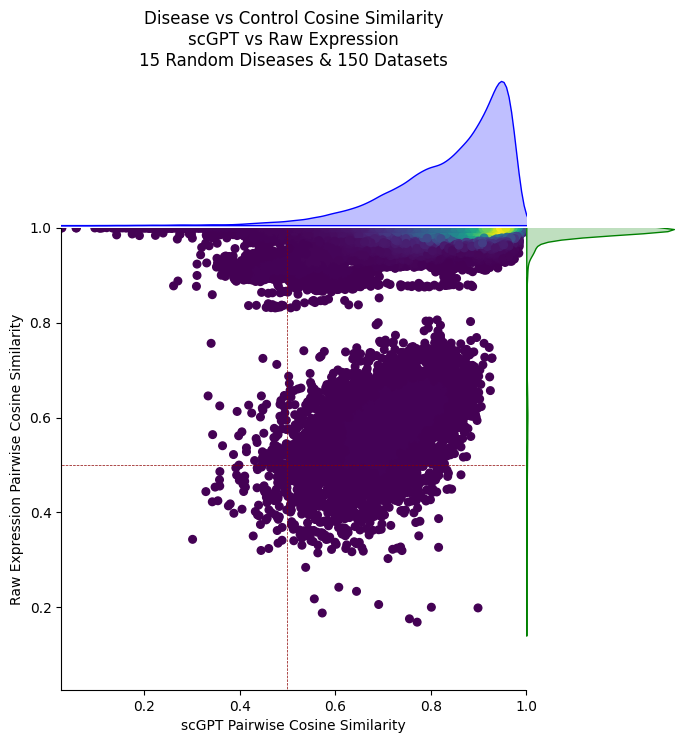

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import gaussian_kde
import random

plt.figure(figsize=(8, 8))

# Define a grid for the plot layout
grid = plt.GridSpec(
    4, 4, hspace=0, wspace=0
)  # Set hspace and wspace to 0 for seamless plots

# Scatter plot will go in the main panel (bottom-right)
main_ax = plt.subplot(grid[1:, :-1])

# KDE plots for Matrix A on top (x-axis KDE)
x_kde_ax = plt.subplot(grid[0, :-1], sharex=main_ax)

# KDE plots for Matrix B on the right (y-axis KDE)
y_kde_ax = plt.subplot(grid[1:, -1], sharey=main_ax)


x = d_data[data_types[1]]["control_values"]  # scGPT
y = d_data[data_types[0]]["control_values"]  # rawGEx

# Combine all points into a 2D array for density estimation
xy = np.vstack([x, y])
density = gaussian_kde(xy)(xy)

# Normalize density values to [0, 1] for coloring
density_norm = (density - density.min()) / (density.max() - density.min())

# Define a colormap for the scatter plot
colormap = plt.cm.viridis

# Scatter plot in the main axis
main_ax.scatter(
    x,
    y,
    c=density_norm,  # Color by normalized density
    cmap=colormap,
    marker="o",
    s=30,
)

# Plot the KDE for Matrix A (x-axis) on the top subplot
sns.kdeplot(x, ax=x_kde_ax, color="blue", fill=True)

# Plot the KDE for Matrix B (y-axis) on the right subplot
sns.kdeplot(y, ax=y_kde_ax, color="green", fill=True, vertical=True)

# Remove ticks and boxes from the KDE plots
# x_kde_ax.set_xticks([])
x_kde_ax.set_yticks([])
x_kde_ax.spines["top"].set_visible(False)
x_kde_ax.spines["right"].set_visible(False)
x_kde_ax.spines["left"].set_visible(False)
x_kde_ax.spines["bottom"].set_visible(False)
x_kde_ax.set_ylim(-0.1)
x_kde_ax.set_ylabel("")
x_kde_ax.set_title(
    f"Disease vs Control Cosine Similarity\nscGPT vs Raw Expression\n15 Random Diseases & 150 Datasets"
)

y_kde_ax.set_xticks([])
# y_kde_ax.set_yticks([])
y_kde_ax.spines["top"].set_visible(False)
y_kde_ax.spines["right"].set_visible(False)
y_kde_ax.spines["left"].set_visible(False)
y_kde_ax.spines["bottom"].set_visible(False)
y_kde_ax.set_xlabel("")
y_kde_ax.set_ylim(-0.1)

# Re-enable ticks on the main scatter plot

main_ax.set_xlabel("scGPT Pairwise Cosine Similarity")
main_ax.set_ylabel("Raw Expression Pairwise Cosine Similarity")
# main_ax.set_ylim(min(min(y), min(x)), max(max(y), max(x)))
# main_ax.set_xlim(min(min(y), min(x)), max(max(y), max(x)))
main_ax.spines["top"].set_visible(False)
main_ax.spines["right"].set_visible(False)
main_ax.set_ylim(min(min(y), min(x)), 1)
main_ax.set_xlim(min(min(y), min(x)), 1)
main_ax.tick_params(left=True, bottom=True)
main_ax.hlines(0.5, -1, 1, color="darkred", linestyle="--", linewidth=0.5)
main_ax.vlines(0.5, -1, 1, color="darkred", linestyle="--", linewidth=0.5)

plt.setp(x_kde_ax.get_xticklabels(), visible=False)
plt.setp(y_kde_ax.get_yticklabels(), visible=False)

x_kde_ax.tick_params(axis="x", which="both", length=0)  # Removes the tick lines
y_kde_ax.tick_params(axis="y", which="both", length=0)  # Removes the tick lines

plt.show()

/tmp/ipykernel_10658/2909039798.py:51: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y, ax=y_kde_ax, color="green", fill=True, vertical=True)


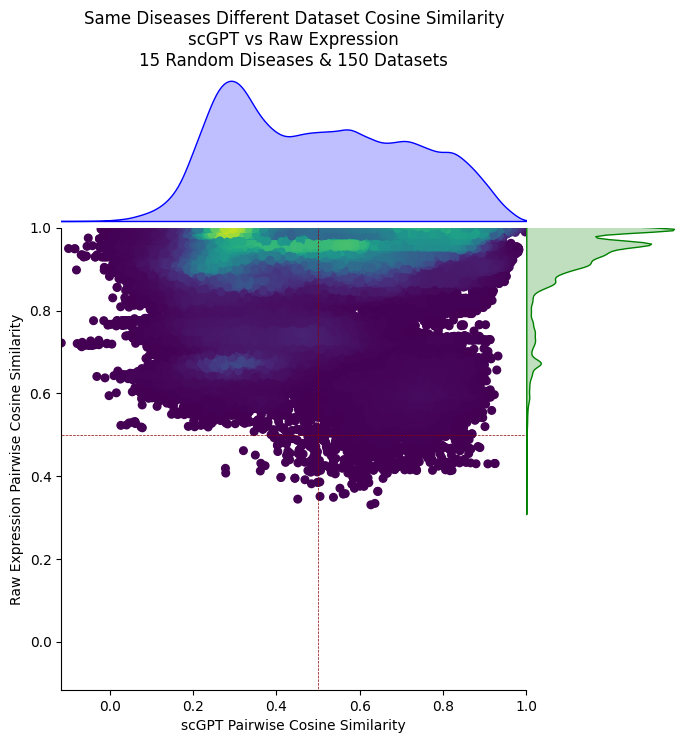

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import gaussian_kde
import random

plt.figure(figsize=(8, 8))

# Define a grid for the plot layout
grid = plt.GridSpec(
    4, 4, hspace=0, wspace=0
)  # Set hspace and wspace to 0 for seamless plots

# Scatter plot will go in the main panel (bottom-right)
main_ax = plt.subplot(grid[1:, :-1])

# KDE plots for Matrix A on top (x-axis KDE)
x_kde_ax = plt.subplot(grid[0, :-1], sharex=main_ax)

# KDE plots for Matrix B on the right (y-axis KDE)
y_kde_ax = plt.subplot(grid[1:, -1], sharey=main_ax)


x = d_data[data_types[1]]["same_dis_values"]
y = d_data[data_types[0]]["same_dis_values"]

# Combine all points into a 2D array for density estimation
xy = np.vstack([x, y])
density = gaussian_kde(xy)(xy)

# Normalize density values to [0, 1] for coloring
density_norm = (density - density.min()) / (density.max() - density.min())

# Define a colormap for the scatter plot
colormap = plt.cm.viridis

# Scatter plot in the main axis
main_ax.scatter(
    x,
    y,
    c=density_norm,  # Color by normalized density
    cmap=colormap,
    marker="o",
    s=30,
)

# Plot the KDE for Matrix A (x-axis) on the top subplot
sns.kdeplot(x, ax=x_kde_ax, color="blue", fill=True)

# Plot the KDE for Matrix B (y-axis) on the right subplot
sns.kdeplot(y, ax=y_kde_ax, color="green", fill=True, vertical=True)

# Remove ticks and boxes from the KDE plots
# x_kde_ax.set_xticks([])
x_kde_ax.set_yticks([])
x_kde_ax.spines["top"].set_visible(False)
x_kde_ax.spines["right"].set_visible(False)
x_kde_ax.spines["left"].set_visible(False)
x_kde_ax.spines["bottom"].set_visible(False)
x_kde_ax.set_ylim(-0.1)
x_kde_ax.set_ylabel("")
x_kde_ax.set_title(
    f"Same Diseases Different Dataset Cosine Similarity\nscGPT vs Raw Expression\n15 Random Diseases & 150 Datasets"
)

y_kde_ax.set_xticks([])
# y_kde_ax.set_yticks([])
y_kde_ax.spines["top"].set_visible(False)
y_kde_ax.spines["right"].set_visible(False)
y_kde_ax.spines["left"].set_visible(False)
y_kde_ax.spines["bottom"].set_visible(False)
y_kde_ax.set_xlabel("")
y_kde_ax.set_ylim(-0.1)

# Re-enable ticks on the main scatter plot

main_ax.set_xlabel("scGPT Pairwise Cosine Similarity")
main_ax.set_ylabel("Raw Expression Pairwise Cosine Similarity")
# main_ax.set_ylim(min(min(y), min(x)), max(max(y), max(x)))
# main_ax.set_xlim(min(min(y), min(x)), max(max(y), max(x)))
main_ax.spines["top"].set_visible(False)
main_ax.spines["right"].set_visible(False)
main_ax.set_ylim(min(min(y), min(x)), 1)
main_ax.set_xlim(min(min(y), min(x)), 1)
main_ax.tick_params(left=True, bottom=True)
main_ax.hlines(0.5, -1, 1, color="darkred", linestyle="--", linewidth=0.5)
main_ax.vlines(0.5, -1, 1, color="darkred", linestyle="--", linewidth=0.5)

plt.setp(x_kde_ax.get_xticklabels(), visible=False)
plt.setp(y_kde_ax.get_yticklabels(), visible=False)

x_kde_ax.tick_params(axis="x", which="both", length=0)  # Removes the tick lines
y_kde_ax.tick_params(axis="y", which="both", length=0)  # Removes the tick lines

plt.show()

/tmp/ipykernel_10658/1254302836.py:51: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y, ax=y_kde_ax, color="green", fill=True, vertical=True)


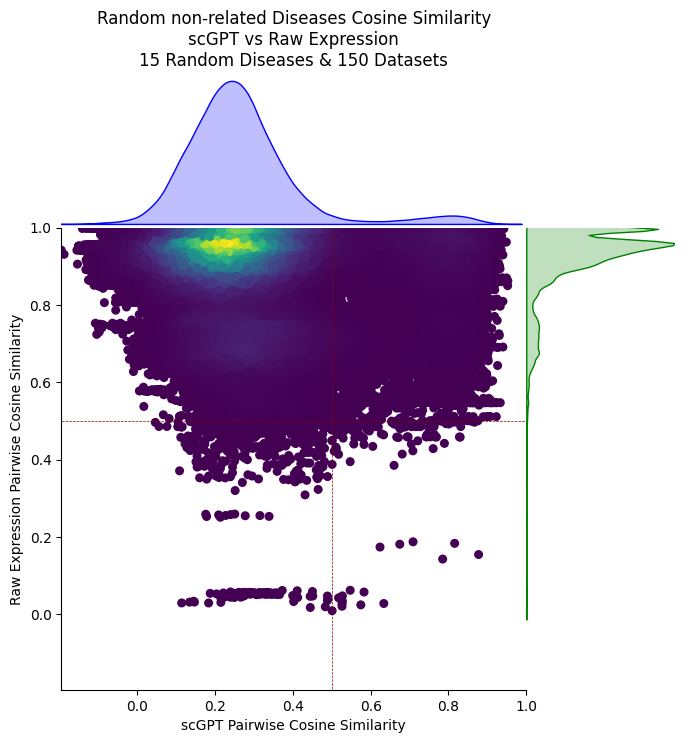

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import gaussian_kde
import random

plt.figure(figsize=(8, 8))

# Define a grid for the plot layout
grid = plt.GridSpec(
    4, 4, hspace=0, wspace=0
)  # Set hspace and wspace to 0 for seamless plots

# Scatter plot will go in the main panel (bottom-right)
main_ax = plt.subplot(grid[1:, :-1])

# KDE plots for Matrix A on top (x-axis KDE)
x_kde_ax = plt.subplot(grid[0, :-1], sharex=main_ax)

# KDE plots for Matrix B on the right (y-axis KDE)
y_kde_ax = plt.subplot(grid[1:, -1], sharey=main_ax)


x = d_data[data_types[1]]["other_values"]
y = d_data[data_types[0]]["other_values"]

# Combine all points into a 2D array for density estimation
xy = np.vstack([x, y])
density = gaussian_kde(xy)(xy)

# Normalize density values to [0, 1] for coloring
density_norm = (density - density.min()) / (density.max() - density.min())

# Define a colormap for the scatter plot
colormap = plt.cm.viridis

# Scatter plot in the main axis
main_ax.scatter(
    x,
    y,
    c=density_norm,  # Color by normalized density
    cmap=colormap,
    marker="o",
    s=30,
)

# Plot the KDE for Matrix A (x-axis) on the top subplot
sns.kdeplot(x, ax=x_kde_ax, color="blue", fill=True)

# Plot the KDE for Matrix B (y-axis) on the right subplot
sns.kdeplot(y, ax=y_kde_ax, color="green", fill=True, vertical=True)

# Remove ticks and boxes from the KDE plots
# x_kde_ax.set_xticks([])
x_kde_ax.set_yticks([])
x_kde_ax.spines["top"].set_visible(False)
x_kde_ax.spines["right"].set_visible(False)
x_kde_ax.spines["left"].set_visible(False)
x_kde_ax.spines["bottom"].set_visible(False)
x_kde_ax.set_ylim(-0.1)
x_kde_ax.set_ylabel("")
x_kde_ax.set_title(
    f"Random non-related Diseases Cosine Similarity\nscGPT vs Raw Expression\n15 Random Diseases & 150 Datasets"
)

y_kde_ax.set_xticks([])
# y_kde_ax.set_yticks([])
y_kde_ax.spines["top"].set_visible(False)
y_kde_ax.spines["right"].set_visible(False)
y_kde_ax.spines["left"].set_visible(False)
y_kde_ax.spines["bottom"].set_visible(False)
y_kde_ax.set_xlabel("")
y_kde_ax.set_ylim(-0.1)

# Re-enable ticks on the main scatter plot

main_ax.set_xlabel("scGPT Pairwise Cosine Similarity")
main_ax.set_ylabel("Raw Expression Pairwise Cosine Similarity")
# main_ax.set_ylim(min(min(y), min(x)), max(max(y), max(x)))
# main_ax.set_xlim(min(min(y), min(x)), max(max(y), max(x)))
main_ax.spines["top"].set_visible(False)
main_ax.spines["right"].set_visible(False)
main_ax.set_ylim(min(min(y), min(x)), 1)
main_ax.set_xlim(min(min(y), min(x)), 1)
main_ax.tick_params(left=True, bottom=True)
main_ax.hlines(0.5, -1, 1, color="darkred", linestyle="--", linewidth=0.5)
main_ax.vlines(0.5, -1, 1, color="darkred", linestyle="--", linewidth=0.5)

plt.setp(x_kde_ax.get_xticklabels(), visible=False)
plt.setp(y_kde_ax.get_yticklabels(), visible=False)

x_kde_ax.tick_params(axis="x", which="both", length=0)  # Removes the tick lines
y_kde_ax.tick_params(axis="y", which="both", length=0)  # Removes the tick lines

plt.show()

## Tissue Bias Analysis

In [ ]:
"""Tissue Bias Analysis

Here we will assess in 2 exercises the presence of tissue bias. 

First overall picture of comparing:
    - same tissue different datasets different tissue vs different tissue same disease different datasets
    
"""

# 1. Imports, Variables, Functions
# imports


# variables


# functions
def plot_smoothed_line_through_histogram(all_data, bins, labels, title):
    """
    Plot smoothed lines for multiple datasets on the same plot.

    Args:
        all_data (list of np.ndarray): List of datasets (counts) to plot.
        bins (np.ndarray): Bin edges for the histogram.
        labels (list of str): Labels for each dataset.
    """
    from scipy.interpolate import make_interp_spline

    # Create the plot
    plt.figure(figsize=(6, 4), dpi=200)

    for data, label in zip(all_data, labels):
        # Compute bin centers
        bin_centers = 0.5 * (bins[:-1] + bins[1:])

        # Spline interpolation for smooth lines
        spline = make_interp_spline(bin_centers, data, k=3)  # Cubic spline
        x_smooth = np.linspace(bin_centers.min(), bin_centers.max(), 250)
        y_smooth = spline(x_smooth)

        # Plot the smoothed line
        # if label in [""]:
        if True:
            plt.plot(x_smooth, y_smooth, label=label, linewidth=2, alpha=0.9)
            plt.fill_between(x_smooth, y_smooth, alpha=0.5)
        else:
            plt.plot(x_smooth, y_smooth, label=label, linewidth=2, alpha=0.5)
            plt.fill_between(x_smooth, y_smooth, alpha=0.1)

    # Add labels and legend
    plt.xlabel(f"{metric_i}")
    plt.ylabel("Density")
    plt.title(title)
    plt.legend(loc="upper left")
    plt.xlim(np.min(bins), np.max(bins))
    plt.ylim(
        0,
    )
    # show grid
    plt.grid(True, color="gray", linestyle="--", linewidth=0.5, alpha=0.7)

    plt.show()


def get_relationship_tissue(
    mesh_id: str, tissue: str, df_obs: pd.DataFrame, mesh_id_2_tree_terms: dict
) -> List:
    """Get Relationship between two diseases
    Args:
        - mesh_id (str): MeSH ID
        - df_obs (pd.DataFrame): DataFrame with disease information
        - mesh_id_2_tree_terms (dict): Mapping of MeSH ID to Tree Terms
    Returns:
        - relationship (List): List of relationships
    """

    # get root tree terms
    tree_term = shorten_terms(mesh_id_2_tree_terms[mesh_id])

    # clean terms
    tree_term = [x for x in tree_term if x.startswith("C")]

    relationship = list()

    # check if same disease
    condition_1 = lambda x: True if x == mesh_id else False

    # check if control
    condition_2 = lambda x: True if x == "Control" else False

    # check if related
    condition_3 = lambda x: (
        True if len(set(tree_term).intersection(set(x))) > 0 else False
    )

    # check if same tissue or not
    condition_4 = lambda x: True if x == tissue else False

    for i, row in df_obs.iterrows():
        disease_i = row["disease"]
        mesh_id_i = row["mesh_id"]
        tissue_i = row["tissue"]
        tree_term_i = shorten_terms(mesh_id_2_tree_terms[mesh_id_i])

        # clean terms
        tree_term_i = [x for x in tree_term_i if x.startswith("C")]

        # Same Disease Not same Tissue
        if (
            condition_1(mesh_id_i)
            and not condition_2(disease_i)
            and not condition_4(tissue_i)
        ):
            relationship.append("same disease different tissue")

        # same disease same tissue
        elif (
            condition_1(mesh_id_i)
            and not condition_2(disease_i)
            and condition_4(tissue_i)
        ):
            relationship.append("same disease same tissue")

        # Unrelated Disease Same Tissue
        elif (
            condition_3(tree_term_i)
            and not condition_2(disease_i)
            and condition_4(tissue_i)
        ):
            relationship.append("unrelated disease same tissue")

        # Control for same Disease
        elif condition_1(mesh_id_i) and condition_2(disease_i):
            relationship.append("control")

        # Related Disease
        elif condition_3(tree_term_i) and not condition_2(disease_i):
            relationship.append("related disease")

        # Other
        else:
            relationship.append("other")

    return relationship


# 2. Load Data

# 3. Tissue Bias Analysis

In [ ]:
root_id = ["C04"]
max_sample = 100

same_ds_dt_ts = list()
same_dis = list()
same_tis = list()
other = list()

# Loop through datasets w/ unrelated diseases

# remove nan values
df_obs_filter = df_obs.query("tissue != 'nan'")

# Group by 'mesh_id' and 'tissue', count samples per tissue
grouped = df_obs_filter.groupby(["mesh_id", "tissue"]).size()

# Filter for tissues with at least 5 samples
filtered = grouped[grouped >= 5].reset_index(name="count")

# Count the number of unique tissues per 'mesh_id'
unique_tissues = filtered.groupby("mesh_id")["tissue"].nunique()

# Get 'mesh_id' with more than 1 unique tissue
result_mesh_ids = unique_tissues[unique_tissues > 1].index.tolist()

# loop through diseases
for mesh_i in tqdm(result_mesh_ids):
    QUERY = f"mesh_id == '{mesh_i}'"
    df_query_1 = df_obs_filter.query(QUERY)

    same_dis_i = list()
    same_ds_dt_ts_i = list()
    same_tis_i = list()
    other_i = list()

    tisues = [x for x in df_query_1["tissue"].unique() if x != "nan"]

    # loop through tissues
    for tisue_i in tisues:
        df_query_2 = df_query_1.query(f"tissue == '{tisue_i}'")

        # define relationships knowing the disease
        df_obs_filter = df_obs_filter.copy()

        df_obs_filter["relationship"] = get_relationship_tissue(
            mesh_i, tisue_i, df_obs_filter, mesh_id_2_tree_terms
        )

        # Loop through diseases in dataset
        for dataset_j in df_query_2["dataset"].unique():

            # same disease same tissue
            QUERY = (
                "dataset == @dataset_j and relationship == 'same disease same tissue'"
            )
            same_ds_dt_ts_idxs = df_obs_filter.query(QUERY).index.to_list()

            # same disease diff tissue
            QUERY = "dataset != @dataset_j and relationship == 'same disease different tissue'"
            same_dis_idxs = df_obs_filter.query(QUERY).index.to_list()

            # unrelated disease same tissue
            QUERY = "relationship == 'unrelated disease same tissue' and dataset != @dataset_j"
            same_tis_idxs = df_obs_filter.query(QUERY).index.to_list()

            # random
            QUERY = "dataset != @dataset_j and relationship == 'other'"
            other_idxs = df_obs_filter.query(QUERY).index.to_list()

            # sample other indexes
            same_ds_dt_ts_idxs = random.sample(
                same_ds_dt_ts_idxs, min(len(same_ds_dt_ts_idxs), max_sample)
            )

            same_dis_idxs = random.sample(
                same_dis_idxs, min(len(same_dis_idxs), max_sample)
            )

            same_tis_idxs = random.sample(
                same_tis_idxs, min(len(same_tis_idxs), max_sample)
            )
            other_idxs = random.sample(other_idxs, min(len(other_idxs), max_sample))

            # print(df_obs["relationship"].value_counts())

            # if we have data for all categories
            if (
                len(same_ds_dt_ts_idxs) >= 5
                and len(same_tis_idxs) >= 5
                and len(same_dis_idxs) >= 5
                and len(other_idxs) >= 5
            ):
                # compute index pairs of groups vs same disease same dataset same tissue
                same_ds_dt_ts_i.append(
                    np.array(list(permutations(same_ds_dt_ts_idxs, 2))).astype(int)
                )

                same_dis_i.append(
                    np.array(list(product(same_ds_dt_ts_idxs, same_dis_idxs))).astype(
                        int
                    )
                )

                same_tis_i.append(
                    np.array(list(product(same_ds_dt_ts_idxs, same_tis_idxs))).astype(
                        int
                    )
                )
                other_i.append(
                    np.array(list(product(same_ds_dt_ts_idxs, other_idxs))).astype(int)
                )

    if (
        len(same_dis_i) > 0
        and len(same_ds_dt_ts_i) > 0
        and len(same_tis_i) > 0
        and len(other_i) > 0
    ):
        same_ds_dt_ts.append(same_ds_dt_ts_i)
        same_dis.append(same_dis_i)
        same_tis.append(same_tis_i)
        other.append(other_i)

100%|██████████| 56/56 [08:11<00:00,  8.77s/it]


In [ ]:
print(len(same_ds_dt_ts_idxs), len(same_dis_idxs), len(same_tis_idxs), len(other_idxs))
print(len(same_ds_dt_ts), len(same_dis), len(same_tis), len(other))

90 100 100 100
55 55 55 55


In [ ]:
len(same_ds_dt_ts[100])

16

100%|██████████| 55/55 [00:00<00:00, 103.82it/s]


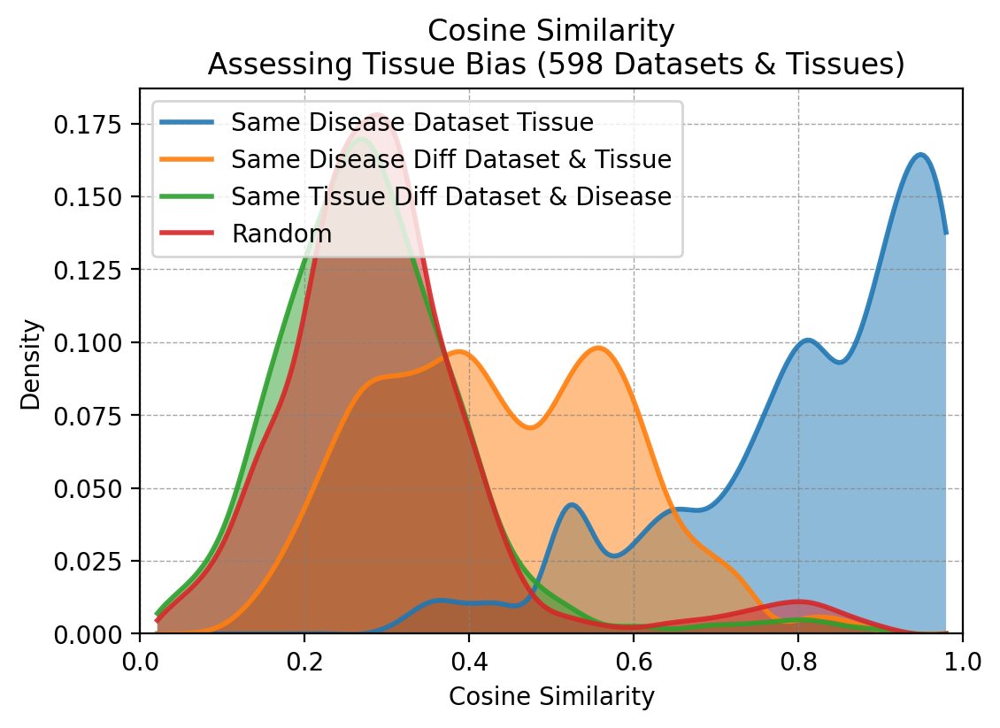

In [ ]:
def get_top_x_values(X: np.array, threshold: int) -> np.array:
    """Get top x values
    Args:
        - X (np.array): Input array
        - threshold (int): Threshold
    Returns:
        - np.array: Array with top x values
    """

    return X[X > np.percentile(X, threshold)]


thr_pct = 0

# fuxed bins
fixed_bins = {
    "Cosine Similarity": np.linspace(0, 1, 25),
    # "Euclidean Distance": np.linspace(0, np.nanmax(matrix), 100),
    "Pearson Correlation": np.linspace(-1, 1, 100),
}


same_ds_dt_ts_normalized = list()
same_dis_normalized = list()
same_tis_normalized = list()
other_normalized = list()

# loop through disease
mesh_id_2_name = dict(zip(df_obs["mesh_id"], df_obs["mesh_disease"]))

n_datasets = 0
# loop through diseases
for i in tqdm(range(len(same_ds_dt_ts))):
    # values for each dataset iteration i
    same_ds_dt_ts_v_i = list()
    same_dis_v_i = list()
    same_tis_v_i = list()
    other_v_i = list()

    # loop through dataset
    for j in range(len(same_ds_dt_ts[i])):
        same_ds_dt_ts_ij = same_ds_dt_ts[i][j]
        same_dis_ij = same_dis[i][j]
        same_tis_ij = same_tis[i][j]
        other_ij = other[i][j]

        # don't retrieve data if no data for all categories
        if (
            (len(same_ds_dt_ts_ij) == 0)
            or (len(same_dis_ij) == 0)
            or (len(same_tis_ij) == 0)
            or (len(other_ij) == 0)
        ):
            continue

        # get values
        same_ds_dt_ts_v_i.append(
            get_top_x_values(
                matrix[same_ds_dt_ts_ij[:, 0], same_ds_dt_ts_ij[:, 1]], thr_pct
            )
        )
        same_dis_v_i.append(
            get_top_x_values(matrix[same_dis_ij[:, 0], same_dis_ij[:, 1]], thr_pct)
        )
        same_tis_v_i.append(
            get_top_x_values(matrix[same_tis_ij[:, 0], same_tis_ij[:, 1]], thr_pct)
        )

        other_v_i.append(
            get_top_x_values(matrix[other_ij[:, 0], other_ij[:, 1]], thr_pct)
        )

        n_datasets += 1

    # don't append if no data for all categories
    if (
        (len(same_ds_dt_ts_v_i) == 0)
        or (len(same_dis_v_i) == 0)
        or (len(same_tis_v_i) == 0)
        or (len(other_v_i) == 0)
    ):
        continue

    # normalize counts for diseases within a dataset
    same_ds_dt_ts_normalized.append(
        normalize_counts_with_bins(same_ds_dt_ts_v_i, fixed_bins.get(metric_i))
    )
    same_dis_normalized.append(
        normalize_counts_with_bins(same_dis_v_i, fixed_bins.get(metric_i))
    )
    same_tis_normalized.append(
        normalize_counts_with_bins(same_tis_v_i, fixed_bins.get(metric_i))
    )
    other_normalized.append(
        normalize_counts_with_bins(other_v_i, fixed_bins.get(metric_i))
    )


# labels_diseases.append(all_diseases[i])
same_ds_dt_ts_normalized = normalize_counts_with_bins(
    same_ds_dt_ts_v_i, fixed_bins.get(metric_i)
)
same_dis_normalized = normalize_counts_with_bins(same_dis_v_i, fixed_bins.get(metric_i))
same_tis_normalized = normalize_counts_with_bins(same_tis_v_i, fixed_bins.get(metric_i))
other_normalized = normalize_counts_with_bins(other_v_i, fixed_bins.get(metric_i))


labels_plot = [
    "Same Disease Dataset Tissue",
    "Same Disease Diff Dataset & Tissue",
    "Same Tissue Diff Dataset & Disease",
    "Random",
]

all_normalized = [
    same_ds_dt_ts_normalized,
    same_dis_normalized,
    same_tis_normalized,
    other_normalized,
]

title = f"Top {100-thr_pct}% {metric_i}\n Assessing Tissue Bias ({n_datasets} Datasets & Tissues)"
if thr_pct == 0:
    title = f"{metric_i}\n Assessing Tissue Bias ({n_datasets} Datasets & Tissues)"


plot_smoothed_line_through_histogram(
    all_normalized, fixed_bins.get(metric_i), labels_plot, title
)

100%|██████████| 55/55 [00:00<00:00, 173.16it/s]


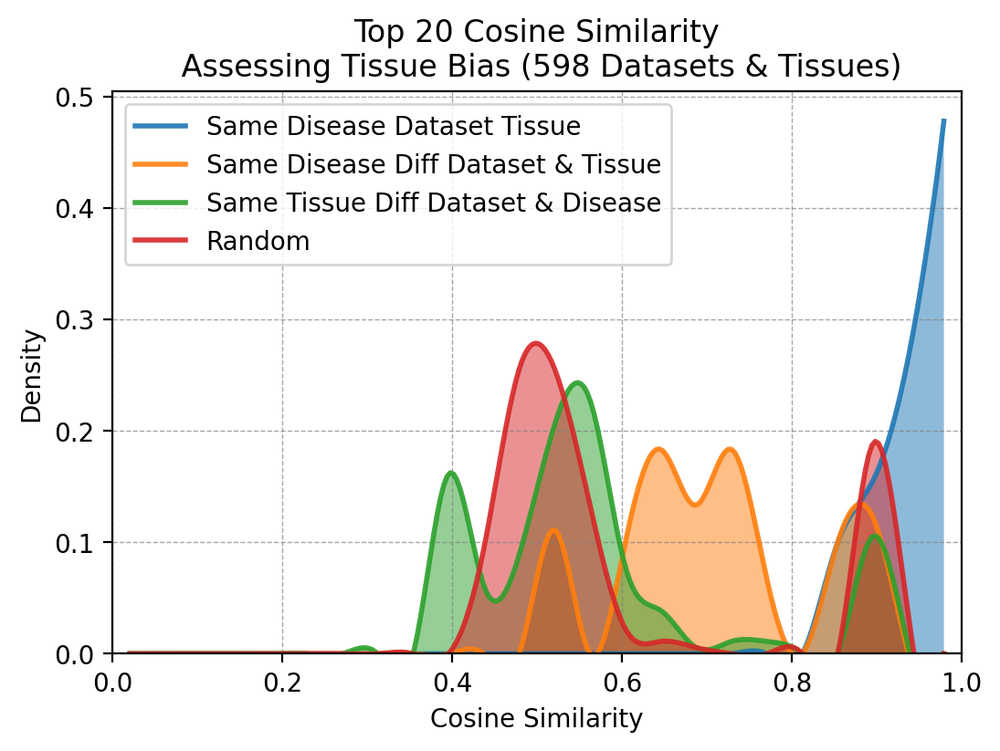

In [ ]:
def get_top_k_values(X: np.array, k: int) -> np.array:
    """Get top x values
    Args:
        - X (np.array): Input array
        - k (int): Threshold
    Returns:
        - np.array: Array with top x values
    """

    return np.sort(X)[::-1][:k]


thr_k = 20

# fuxed bins
fixed_bins = {
    "Cosine Similarity": np.linspace(0, 1, 25),
    # "Euclidean Distance": np.linspace(0, np.nanmax(matrix), 100),
    "Pearson Correlation": np.linspace(-1, 1, 100),
}


same_ds_dt_ts_normalized = list()
same_dis_normalized = list()
same_tis_normalized = list()
other_normalized = list()

# loop through disease
mesh_id_2_name = dict(zip(df_obs["mesh_id"], df_obs["mesh_disease"]))

n_datasets = 0
# loop through diseases
for i in tqdm(range(len(same_ds_dt_ts))):
    # values for each dataset iteration i
    same_ds_dt_ts_v_i = list()
    same_dis_v_i = list()
    same_tis_v_i = list()
    other_v_i = list()

    # loop through dataset
    for j in range(len(same_ds_dt_ts[i])):
        same_ds_dt_ts_ij = same_ds_dt_ts[i][j]
        same_dis_ij = same_dis[i][j]
        same_tis_ij = same_tis[i][j]
        other_ij = other[i][j]

        # don't retrieve data if no data for all categories
        if (
            (len(same_ds_dt_ts_ij) == 0)
            or (len(same_dis_ij) == 0)
            or (len(same_tis_ij) == 0)
            or (len(other_ij) == 0)
        ):
            continue

        # get values
        same_ds_dt_ts_v_i.append(
            get_top_k_values(
                matrix[same_ds_dt_ts_ij[:, 0], same_ds_dt_ts_ij[:, 1]], thr_k
            )
        )
        same_dis_v_i.append(
            get_top_k_values(matrix[same_dis_ij[:, 0], same_dis_ij[:, 1]], thr_k)
        )
        same_tis_v_i.append(
            get_top_k_values(matrix[same_tis_ij[:, 0], same_tis_ij[:, 1]], thr_k)
        )

        other_v_i.append(
            get_top_k_values(matrix[other_ij[:, 0], other_ij[:, 1]], thr_k)
        )

        n_datasets += 1

    # don't append if no data for all categories
    if (
        (len(same_ds_dt_ts_v_i) == 0)
        or (len(same_dis_v_i) == 0)
        or (len(same_tis_v_i) == 0)
        or (len(other_v_i) == 0)
    ):
        continue

    # normalize counts for diseases within a dataset
    same_ds_dt_ts_normalized.append(
        normalize_counts_with_bins(same_ds_dt_ts_v_i, fixed_bins.get(metric_i))
    )
    same_dis_normalized.append(
        normalize_counts_with_bins(same_dis_v_i, fixed_bins.get(metric_i))
    )
    same_tis_normalized.append(
        normalize_counts_with_bins(same_tis_v_i, fixed_bins.get(metric_i))
    )
    other_normalized.append(
        normalize_counts_with_bins(other_v_i, fixed_bins.get(metric_i))
    )


# labels_diseases.append(all_diseases[i])
same_ds_dt_ts_normalized = normalize_counts_with_bins(
    same_ds_dt_ts_v_i, fixed_bins.get(metric_i)
)
same_dis_normalized = normalize_counts_with_bins(same_dis_v_i, fixed_bins.get(metric_i))
same_tis_normalized = normalize_counts_with_bins(same_tis_v_i, fixed_bins.get(metric_i))
other_normalized = normalize_counts_with_bins(other_v_i, fixed_bins.get(metric_i))


labels_plot = [
    "Same Disease Dataset Tissue",
    "Same Disease Diff Dataset & Tissue",
    "Same Tissue Diff Dataset & Disease",
    "Random",
]

all_normalized = [
    same_ds_dt_ts_normalized,
    same_dis_normalized,
    same_tis_normalized,
    other_normalized,
]

title = (
    f"Top {thr_k} {metric_i}\n Assessing Tissue Bias ({n_datasets} Datasets & Tissues)"
)
if thr_k == 0:
    title = f"{metric_i}\n Assessing Tissue Bias ({n_datasets} Datasets & Tissues)"


plot_smoothed_line_through_histogram(
    all_normalized, fixed_bins.get(metric_i), labels_plot, title
)

In [ ]:
# diseases present in more than one dataset
diseases = df_obs["disease"].unique()
diseases = diseases[diseases != "Control"]


# get diseases present in more than one dataset

disease_study
Asthma                                   4812
Ulcerative Colitis                       4121
Systemic Lupus Erythematosus             3663
Crohn's Disease                          3601
Chronic Obstructive Pulmonary Disease    3063
                                         ... 
Cirrhosis                                 254
Diabetic Kidney Disease                   197
Myotonic Dystrophy Type 1                 189
Squamous Cell Carcinoma                   186
Hutchinson-Gilford Progeria Syndrome      161
Name: count, Length: 62, dtype: int64

In [ ]:
df_obs["tissue"].value_counts()

tissue
nan                        17473
Blood                       9799
Peripheral blood            4418
Whole blood                 3583
Lung                        3161
                           ...  
Visceral adipose tissue        6
Airway epithelium              6
Blood vessel                   6
Airway wall                    2
Myocardium                     2
Name: count, Length: 187, dtype: int64

## Enrichment - Nearest Neighbors

In [ ]:
def get_relationship_dataset(
    mesh_id: str, dataset: str, df_obs: pd.DataFrame, mesh_id_2_tree_terms: dict
) -> List:
    """Get Relationship between two diseases
    Args:
        - mesh_id (str): MeSH ID
        - dataset (str): Dataset
        - df_obs (pd.DataFrame): DataFrame with disease information
        - mesh_id_2_tree_terms (dict): Mapping of MeSH ID to Tree Terms
    Returns:
        - relationship (List): List of relationships
    """

    # get root tree terms
    tree_term = shorten_terms(mesh_id_2_tree_terms[mesh_id])

    # clean terms
    tree_term = [x for x in tree_term if x.startswith("C")]

    relationship = list()

    for i, row in df_obs.iterrows():
        disease_i = row["disease"]
        mesh_id_i = row["mesh_id"]
        tree_term_i = shorten_terms(mesh_id_2_tree_terms[mesh_id_i])

        # clean terms
        tree_term_i = [x for x in tree_term_i if x.startswith("C")]

        # check if same disease
        condition_1 = mesh_id == mesh_id_i

        # check if control
        condition_2 = disease_i == "Control"

        # check if related
        condition_3 = len(set(tree_term).intersection(set(tree_term_i))) > 0

        # check if same dataset or not
        condition_4 = dataset == row["dataset"]

        # Same Disease
        if condition_1 and not condition_2:
            if condition_4:
                relationship.append("same disease same dataset")
            else:
                relationship.append("same disease different dataset")

        # Control for same Disease
        elif condition_1 and condition_2 and condition_4:
            relationship.append("control")

        # Related Disease
        elif condition_3 and not condition_2:
            if condition_4:
                relationship.append("related disease same dataset")
            else:
                relationship.append("related disease different dataset")

        elif not condition_3 and not condition_2 and condition_4:
            relationship.append("unrelated disease same dataset")

        else:
            relationship.append("other")

    return relationship

In [ ]:
k = 1
n_diseases = 200

# choose random 200 diseases
idxs = random.sample(df_obs[df_obs["disease"] != "Control"].index.to_list(), n_diseases)


# initialize a list to store the nearest neighbors
nearest_neighbors = []

for idx in tqdm(idxs):

    mesh_id = df_obs.loc[idx, "mesh_id"]
    dataset_i = df_obs.loc[idx, "dataset"]
    # get labels for diseases
    labels_i = get_relationship_dataset(
        mesh_id, dataset_i, df_obs, mesh_id_2_tree_terms
    )

    # append to list of nn the closest diseases
    matrix_i = matrix[idx, :]

    # Get top-k highest cosine similarity indexes, excluding the query disease itself
    top_k_idxs = matrix_i.argsort()[::-1]  # Sort in descending order
    top_k_idxs = [i for i in top_k_idxs if i != idx][:k]  # Remove itself and take top k

    # Get the corresponding diseases (or IDs) for these indexes
    closest_diseases = [df_obs.loc[i, "mesh_id"] for i in top_k_idxs]

    # top k labels
    top_k_labels = [labels_i[idx] for idx in top_k_idxs]

    # Store the results as a dictionary or another structure
    nearest_neighbors.append(
        {
            "query_disease": mesh_id,
            "labels": top_k_labels,
            "nearest_neighbors": closest_diseases,
        }
    )

# Output or process the nearest_neighbors list
for nn in nearest_neighbors:
    print(
        f"Disease: {nn['query_disease']},Nº of NN {len(nn['nearest_neighbors'])} Nearest Neighbors: {nn['nearest_neighbors']}"
    )

100%|██████████| 200/200 [04:24<00:00,  1.32s/it]

Disease: D007251,Nº of NN 1 Nearest Neighbors: ['D007251']
Disease: D015470,Nº of NN 1 Nearest Neighbors: ['D015470']
Disease: D008545,Nº of NN 1 Nearest Neighbors: ['D008545']
Disease: D015464,Nº of NN 1 Nearest Neighbors: ['D015464']
Disease: D001249,Nº of NN 1 Nearest Neighbors: ['D001249']
Disease: D003093,Nº of NN 1 Nearest Neighbors: ['D003093']
Disease: D008180,Nº of NN 1 Nearest Neighbors: ['D008180']
Disease: D015451,Nº of NN 1 Nearest Neighbors: ['D008180']
Disease: D008180,Nº of NN 1 Nearest Neighbors: ['D029424']
Disease: D009765,Nº of NN 1 Nearest Neighbors: ['D009765']
Disease: D012559,Nº of NN 1 Nearest Neighbors: ['D015470']
Disease: D009101,Nº of NN 1 Nearest Neighbors: ['D009101']
Disease: D008180,Nº of NN 1 Nearest Neighbors: ['D008180']
Disease: D014376,Nº of NN 1 Nearest Neighbors: ['D014376']
Disease: D012859,Nº of NN 1 Nearest Neighbors: ['D018805']
Disease: D001249,Nº of NN 1 Nearest Neighbors: ['D001249']
Disease: D002583,Nº of NN 1 Nearest Neighbors: ['D002583

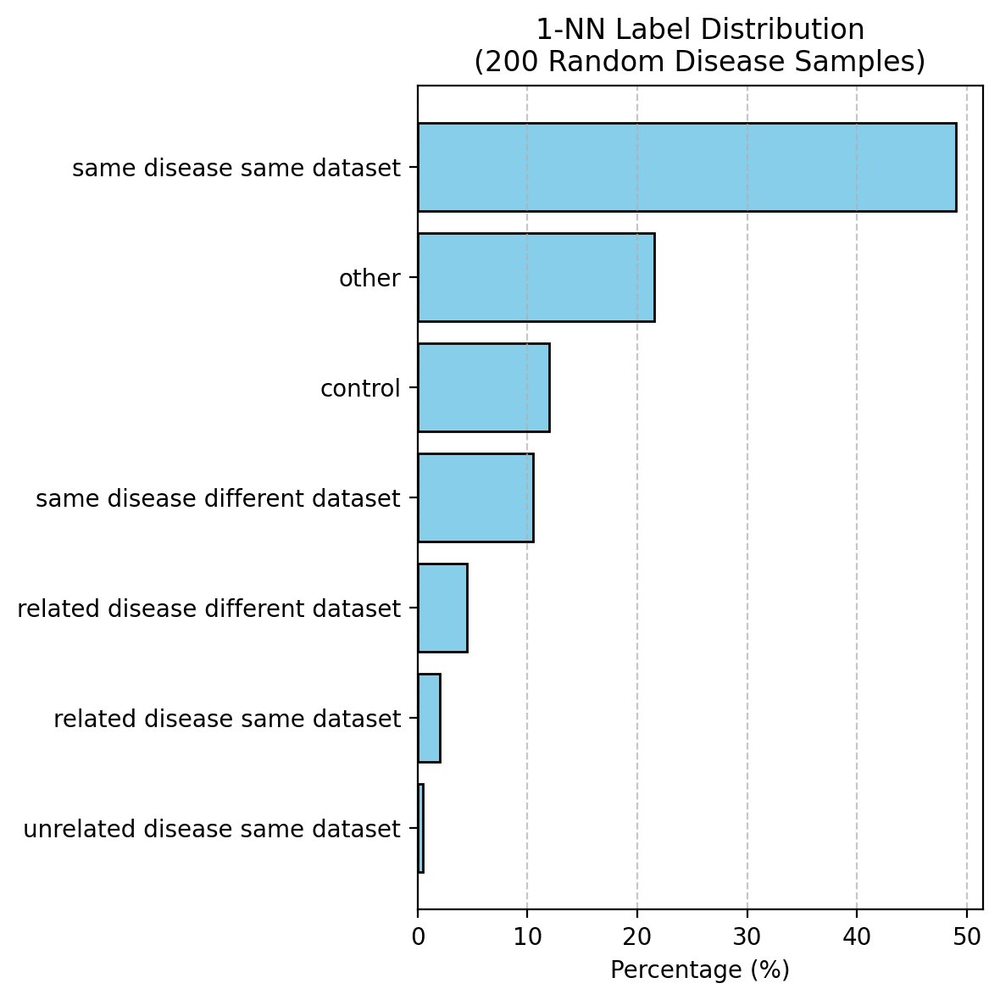

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter

# Flatten the labels from all nearest neighbors to count their occurrences
all_labels = [label for nn in nearest_neighbors for label in nn["labels"]]

# Count occurrences of each label
label_counts = Counter(all_labels)

# Convert counts to percentages
total_labels = sum(label_counts.values())
label_percentages = {
    label: (count / total_labels) * 100 for label, count in label_counts.items()
}

# Sort labels by percentage in ascending order
sorted_labels_percentages = sorted(
    label_percentages.items(), key=lambda x: x[1], reverse=False
)
labels, percentages = zip(*sorted_labels_percentages)

# Plot the labels
plt.figure(figsize=(6, 6), dpi=200)
plt.barh(labels, percentages, color="skyblue", edgecolor="black")
plt.xlabel("Percentage (%)")
plt.title(f"{k}-NN Label Distribution\n({n_diseases} Random Disease Samples)")

# Add gridlines behind bars
plt.grid(axis="x", linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()

['same disease',
 'same disease',
 'same disease',
 'same disease',
 'same disease',
 'same disease',
 'same disease',
 'same disease',
 'same disease',
 'same disease']

In [ ]:
nearest_neighbors

[{'query_disease': 'D015179',
  'labels': ['other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',
   'other',


In [ ]:
matrix_i.argsort()[-11:]

array([26178, 49747, 35204, 31604, 22856, 62198, 69617, 32389, 45121,
       35302, 51504])

In [ ]:
k_idxs

array([[26178, 49747, 35204, 31604, 22856, 62198, 69617, 32389, 45121,
        35302, 51504]])

In [ ]:
matrix_i = matrix[13993, :]

In [ ]:
matrix[13993, :]

array([0.266 , 0.2434, 0.2744, ..., 0.3816, 0.3335, 0.2854], dtype=float16)

In [ ]:
# get top-k highest cosine similarity values indexes (excluding the disease itself)
top_k_idxs = matrix_i.argsort()

In [ ]:
top_k_idxs

array([    0,     1,     2, ..., 70662, 70663, 70664])

In [ ]:
matrix_i[13993]

0.2029